In [1]:
import numpy as np
import matplotlib.pyplot as plt
import random
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten

In [2]:
X_train = np.loadtxt('input.csv', delimiter = ',')
Y_train = np.loadtxt('labels.csv', delimiter = ',')

X_test = np.loadtxt('input_test.csv', delimiter = ',')
Y_test = np.loadtxt('labels_test.csv', delimiter = ',')

In [3]:
X_train = X_train.reshape(len(X_train), 100, 100, 3)
Y_train = Y_train.reshape(len(Y_train), 1)

X_test = X_test.reshape(len(X_test), 100, 100, 3)
Y_test = Y_test.reshape(len(Y_test), 1)

X_train = X_train/255.0
X_test = X_test/255.0

In [4]:
print("Shape of X_train: ", X_train.shape)
print("Shape of Y_train: ", Y_train.shape)
print("Shape of X_test: ", X_test.shape)
print("Shape of Y_test: ", Y_test.shape)

Shape of X_train:  (2000, 100, 100, 3)
Shape of Y_train:  (2000, 1)
Shape of X_test:  (400, 100, 100, 3)
Shape of Y_test:  (400, 1)


In [5]:
import tensorflow as tf
import os

In [6]:
gpus = tf.config.experimental.list_physical_devices ('CPU')
gpus

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')]

In [7]:
gpus = tf.config.experimental.list_physical_devices ('GPU')
for gpu in gpus:
    tf. config.experimental.set_memory_growth(gpu, True)

In [8]:
import cv2
import imghdr

/var/folders/x3/jh_7mg9d1sx0rl54wqhg5gr00000gn/T/ipykernel_54702/89219108.py:2: DeprecationWarning: 'imghdr' is deprecated and slated for removal in Python 3.13
  import imghdr


In [9]:
data_dir = 'data'

In [10]:
#os.listdir(os.path.join(data_dir, 'Cotton'))
def read_images(directory):
    fabric_images = {}
    index = 1
    for root, dirs, files in os.walk(directory):
        for file in files:
            if file.endswith(".png"):
                fabric = os.path.relpath(root, directory)
                image_path = os.path.join(root, file)
                if fabric not in fabric_images:
                    fabric_images[fabric] = [file]
                else:
                    fabric_images[fabric].append(file)

    images = []
    for fabric, image_list in fabric_images.items():
        print(f"{index}.{fabric}: {image_list}")
        index += 1

    return images

read_images(data_dir)

1.Velvet/965: ['im_4.png', 'im_2.png', 'im_3.png', 'im_1.png']
2.Velvet/1934: ['im_4.png', 'im_2.png', 'im_3.png', 'im_1.png']
3.Velvet/1933: ['im_4.png', 'im_2.png', 'im_3.png', 'im_1.png']
4.Velvet/1932: ['im_4.png', 'im_2.png', 'im_3.png', 'im_1.png']
5.Velvet/1935: ['im_4.png', 'im_2.png', 'im_3.png', 'im_1.png']
6.Velvet/966: ['im_4.png', 'im_2.png', 'im_3.png', 'im_1.png']
7.Velvet/1939: ['im_4.png', 'im_2.png', 'im_3.png', 'im_1.png']
8.Velvet/1937: ['im_4.png', 'im_2.png', 'im_3.png', 'im_1.png']
9.Velvet/1936: ['im_4.png', 'im_2.png', 'im_3.png', 'im_1.png']
10.Velvet/1931: ['im_4.png', 'im_2.png', 'im_3.png', 'im_1.png']
11.Velvet/1938: ['im_4.png', 'im_2.png', 'im_3.png', 'im_1.png']
12.Fleece/1864: ['im_4.png', 'im_2.png', 'im_3.png', 'im_1.png']
13.Fleece/1863: ['im_4.png', 'im_2.png', 'im_3.png', 'im_1.png']
14.Fleece/1662: ['im_4.png', 'im_2.png', 'im_3.png', 'im_1.png']
15.Fleece/1654: ['im_4.png', 'im_2.png', 'im_3.png', 'im_1.png']
16.Fleece/1862: ['im_4.png', 'im_2.p

[]

In [11]:
image_exts = ['jpeg', 'jpg', 'png', 'bmp']

In [12]:
import numpy as np
from matplotlib import pyplot as plt

In [13]:
data = tf.keras.utils.image_dataset_from_directory('data')
num_classes = len(list(data.class_names))
data = data.map(lambda x, y: (x, tf.one_hot(y, num_classes)))

Found 4856 files belonging to 14 classes.


In [14]:
data_iterator = data.as_numpy_iterator()

In [15]:
data_iterator

NumpyIterator(iterator=<tensorflow.python.data.ops.iterator_ops.OwnedIterator object at 0x17c98d510>)

In [16]:
#Get another batch from the iterator
batch = data_iterator.next() 

In [17]:
#batch
#len(batch)
#Images represented as numpy arrays
batch[0].shape

(32, 256, 256, 3)

In [18]:
# Class 0 = Cotton
# Class 1 = Polyester
batch[1]

array([[0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1

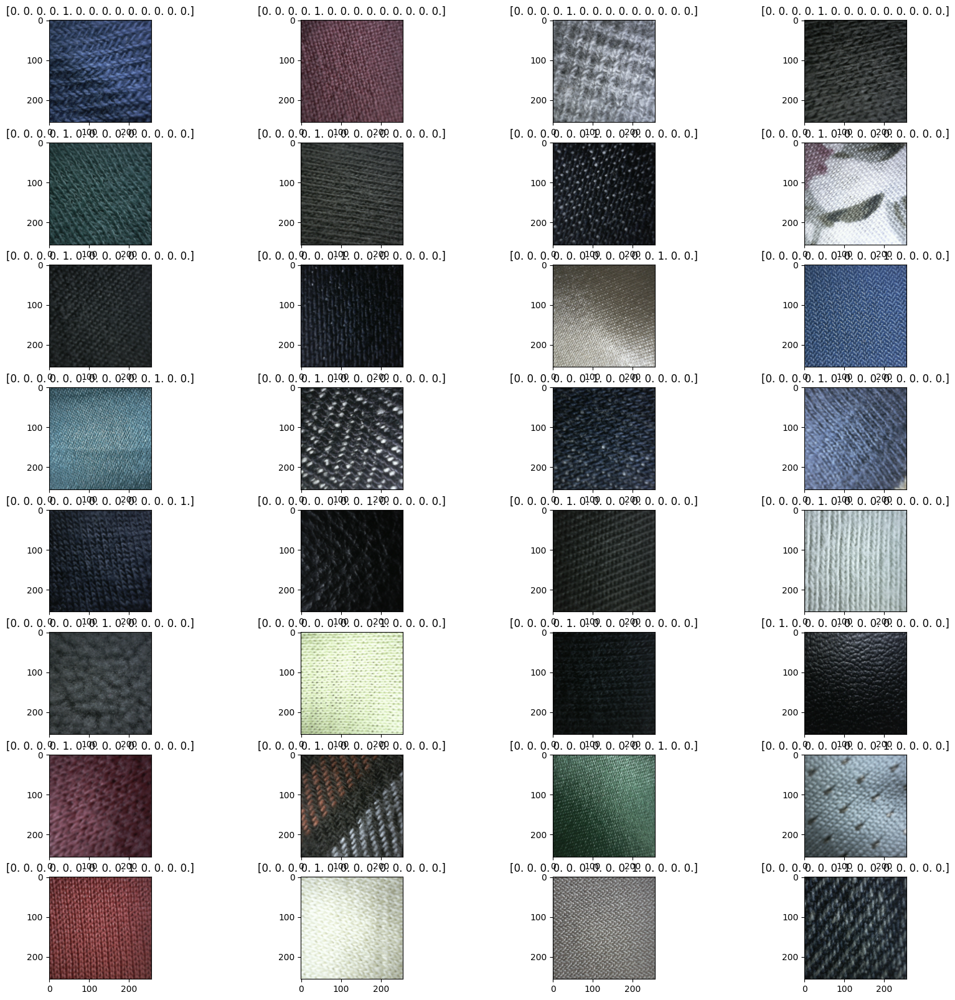

In [19]:
fig, ax = plt.subplots(nrows=8, ncols=4, figsize=(20, 20))
#for idx, img in enumerate(batch[0][:4]):
for row in range(8):
    for col in range(4):
        idx = row * 4 + col
        #ax[idx].imshow(img.astype(int))
        #ax[idx].title.set_text(batch[1][idx])
        ax[row, col].imshow(batch[0][idx].astype(int))
        ax[row, col].title.set_text(batch[1][idx])

In [20]:
scaled = batch[0] / 255

In [21]:
scaled.max()

1.0

In [22]:
data = data.map(lambda x, y: (x/255, y))

In [23]:
scaled_iterator = data.as_numpy_iterator()

In [24]:
batch = scaled_iterator.next()

In [25]:
 batch[0].min()

0.009286918

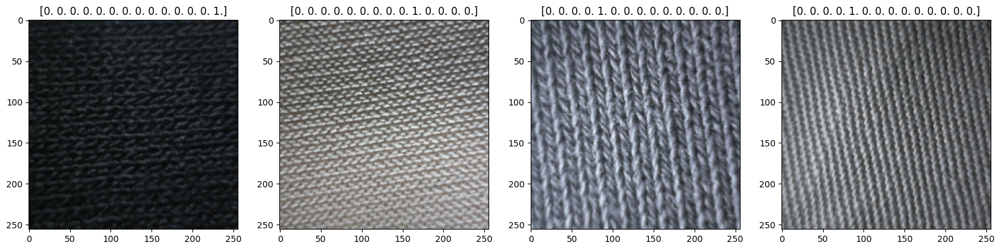

In [26]:
fig, ax = plt.subplots(ncols=4, figsize=(20, 20))
for idx, img in enumerate(batch[0][:4]):
    ax[idx].imshow(img)
    ax[idx].title.set_text(batch[1][idx])

In [27]:
len(data)

152

In [28]:
print(keras.__version__)

NameError: name 'keras' is not defined

In [29]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

def apply_augmentation(image, label):
    # Convert image to float32 for compatibility with augmentation operations
    image = tf.cast(image, tf.float32)
    # Apply data augmentation
    image = data_augmentation(image)
    # Normalize pixel values to [0, 1]
    image /= 255.0
    return image, label

# Initialize ImageDataGenerator for augmentation
data_augmentation = ImageDataGenerator(
    rotation_range=10,  # Rotate images randomly up to 10 degrees
    width_shift_range=0.1,  # Shift width by a maximum of 10%
    height_shift_range=0.1,  # Shift height by a maximum of 10%
    zoom_range=0.1,  # Zoom in/out by up to 10%
    horizontal_flip=True,  # Flip images horizontally
    vertical_flip=False  # Don't flip images vertically
)

# Load image dataset with data augmentation
data = tf.keras.utils.image_dataset_from_directory(
    'data',
    labels='inferred',
    label_mode='int',  # Or 'categorical' if you want one-hot encoded labels
    image_size=(256, 256),
    batch_size=32,
    shuffle=True,
    seed=42,
    validation_split=0.2,
    subset='training',
    interpolation='bilinear',
    follow_links=False,
    preprocessing_function=apply_augmentation  # Apply data augmentation
)

# Verify the first batch with data augmentation applied
for images, labels in data.take(1):
    print("Images shape with augmentation applied:", images.shape)
    print("Labels:", labels)

TypeError: image_dataset_from_directory() got an unexpected keyword argument 'preprocessing_function'

In [30]:
train_size = int(len(data) * .7)
val_size = int(len(data) * .2)
test_size = int(len(data) * .1)+1

In [31]:
train_size + val_size + test_size

152

In [32]:
train = data.take(train_size)
val = data.skip(train_size).take(val_size)
test = data.skip(train_size+val_size).take(test_size)

In [33]:
len(test)

16

In [34]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout

In [35]:
model = Sequential()

In [36]:
model.add(Conv2D(4, (3,3), 1, activation='relu', input_shape= (256,256, 3)))
model.add(MaxPooling2D())

model.add(Conv2D(8, (3,3), 1, activation='relu'))
model.add(MaxPooling2D())

model.add(Conv2D(4, (3,3), 1, activation='relu'))
model.add(MaxPooling2D())

model.add(Flatten())

model.add(Dense(256, activation='relu')) 
model.add(Dense(num_classes, activation='relu'))

/Users/tabitalucaciu/UBB INFO ENGL/YEAR 3/SEM 2/Licenta/pythonProject1/.venv/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


In [37]:
model.compile('adam', loss=tf.losses.CategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

In [38]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 254, 254, 4)    │           112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 127, 127, 4)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 125, 125, 8)    │           296 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 62, 62, 8)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 60, 60, 4)      │           292 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 30, 30, 4)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 3600)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       921,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 14)             │         3,598 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 926,154 (3.53 MB)

 Trainable params: 926,154 (3.53 MB)

 Non-trainable params: 0 (0.00 B)

In [39]:
logdir='logs'

In [40]:
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=logdir)

In [41]:
hist = model.fit(train, epochs=20, validation_data=val, callbacks=[tensorboard_callback])

Epoch 1/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 23s 200ms/step - accuracy: 0.4652 - loss: 1.9625 - val_accuracy: 0.5104 - val_loss: 1.6632
Epoch 2/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 18s 169ms/step - accuracy: 0.5067 - loss: 1.6710 - val_accuracy: 0.5625 - val_loss: 1.5745
Epoch 3/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 19s 178ms/step - accuracy: 0.5507 - loss: 1.5318 - val_accuracy: 0.5958 - val_loss: 1.4057
Epoch 4/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 19s 174ms/step - accuracy: 0.5887 - loss: 1.4031 - val_accuracy: 0.6240 - val_loss: 1.3399
Epoch 5/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 18s 170ms/step - accuracy: 0.6244 - loss: 1.2988 - val_accuracy: 0.6406 - val_loss: 1.3041
Epoch 6/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 19s 173ms/step - accuracy: 0.6660 - loss: 1.2264 - val_accuracy: 0.5969 - val_loss: 1.3196
Epoch 7/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 19s 178ms/step - accuracy: 0.6564 - loss: 1.2024 - val_accuracy: 0.6562 - val_loss: 1.2294
Epoch 8/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 19s 171ms/step - accuracy: 0.6914 - loss: 1

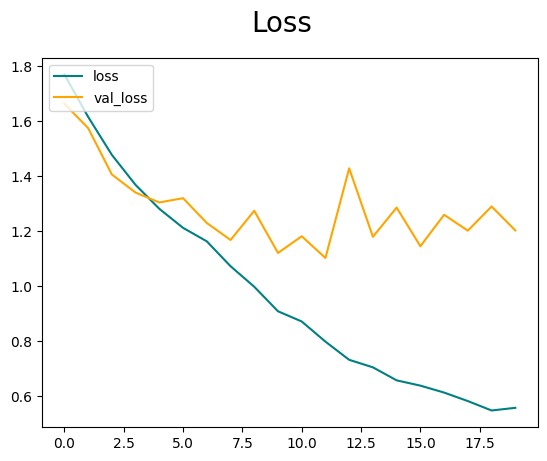

In [42]:
fig = plt.figure()
plt.plot(hist.history['loss'], color='teal', label='loss')
plt.plot(hist.history['val_loss'], color='orange', label='val_loss')
fig.suptitle('Loss', fontsize=20)
plt.legend(loc="upper left")
plt.show()

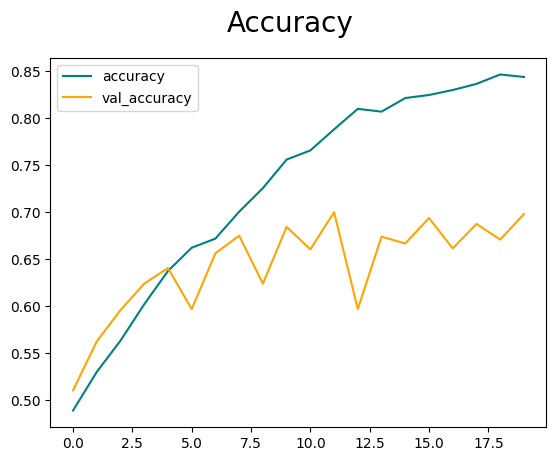

In [43]:
fig = plt.figure()
plt.plot(hist.history['accuracy'], color='teal', label='accuracy')
plt.plot(hist.history['val_accuracy'], color='orange', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=20)
plt.legend(loc="upper left")
plt.show()

In [140]:
hist = model.fit(train, epochs=50, validation_data=val, callbacks=[tensorboard_callback])

Epoch 1/50
106/106 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - accuracy: 0.4424 - loss: 2.0089 - val_accuracy: 0.5250 - val_loss: 1.6418
Epoch 2/50
106/106 ━━━━━━━━━━━━━━━━━━━━ 19s 175ms/step - accuracy: 0.5337 - loss: 1.6194 - val_accuracy: 0.5615 - val_loss: 1.5200
Epoch 3/50
106/106 ━━━━━━━━━━━━━━━━━━━━ 19s 174ms/step - accuracy: 0.5685 - loss: 1.4903 - val_accuracy: 0.5292 - val_loss: 1.5080
Epoch 4/50
106/106 ━━━━━━━━━━━━━━━━━━━━ 19s 176ms/step - accuracy: 0.5873 - loss: 1.4185 - val_accuracy: 0.6458 - val_loss: 1.3181
Epoch 5/50
106/106 ━━━━━━━━━━━━━━━━━━━━ 19s 176ms/step - accuracy: 0.6311 - loss: 1.3002 - val_accuracy: 0.6594 - val_loss: 1.2675
Epoch 6/50
106/106 ━━━━━━━━━━━━━━━━━━━━ 19s 176ms/step - accuracy: 0.6574 - loss: 1.2272 - val_accuracy: 0.6552 - val_loss: 1.2574
Epoch 7/50
106/106 ━━━━━━━━━━━━━━━━━━━━ 19s 179ms/step - accuracy: 0.6718 - loss: 1.1511 - val_accuracy: 0.6646 - val_loss: 1.1932
Epoch 8/50
106/106 ━━━━━━━━━━━━━━━━━━━━ 19s 176ms/step - accuracy: 0.6954 - loss: 1

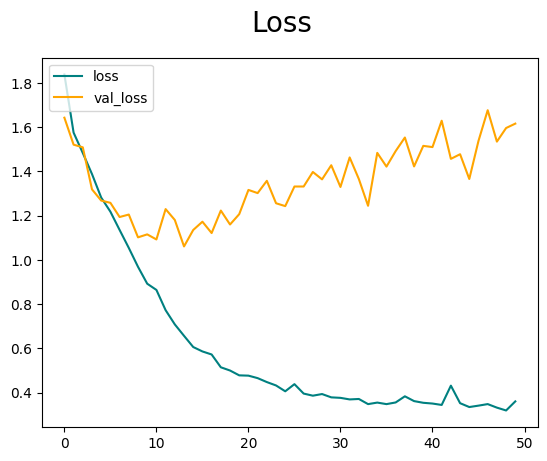

In [142]:
fig = plt.figure()
plt.plot(hist.history['loss'], color='teal', label='loss')
plt.plot(hist.history['val_loss'], color='orange', label='val_loss')
fig.suptitle('Loss', fontsize=20)
plt.legend(loc="upper left")
plt.show()

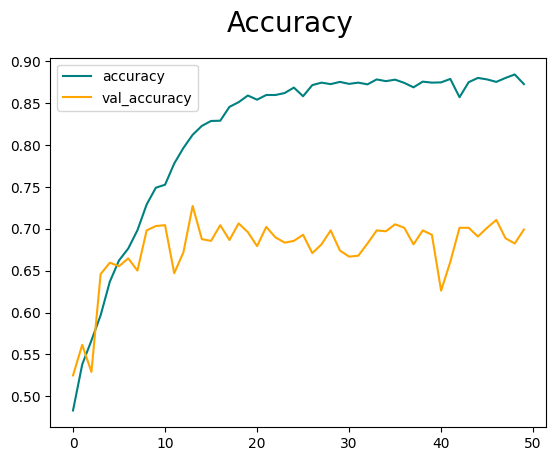

In [143]:
fig = plt.figure()
plt.plot(hist.history['accuracy'], color='teal', label='accuracy')
plt.plot(hist.history['val_accuracy'], color='orange', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=20)
plt.legend(loc="upper left")
plt.show()

In [61]:
hist.history['val_loss'] 

[0.4455602765083313,
 0.4058208465576172,
 0.43962278962135315,
 0.4031867980957031,
 0.3704507052898407,
 0.3582700192928314,
 0.3474544286727905,
 0.324367493391037,
 0.37122219800949097,
 0.2791961133480072,
 0.35732489824295044,
 0.28204381465911865,
 0.2825689911842346,
 0.4926115572452545,
 0.34165364503860474,
 0.3099270761013031,
 0.30739590525627136,
 0.3360806107521057,
 0.33402472734451294,
 0.3336460292339325,
 0.6325907111167908,
 0.33046528697013855,
 0.31597036123275757,
 0.32613423466682434,
 0.40272313356399536,
 0.4435061812400818,
 0.40994033217430115,
 0.5905195474624634,
 0.30463266372680664,
 0.3991691470146179,
 0.38627514243125916,
 0.39788368344306946,
 0.4055635929107666,
 0.4745698571205139,
 0.380425363779068,
 0.3940204977989197,
 0.5075116753578186,
 0.515992283821106,
 0.4743875563144684,
 0.5155142545700073,
 0.5160320401191711,
 0.4187866151332855,
 0.3304266929626465,
 0.4335106313228607,
 0.44530829787254333,
 0.4650985598564148,
 0.4077441096305847,


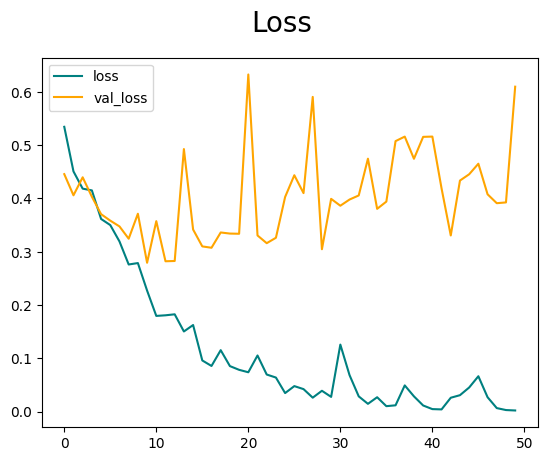

In [62]:
fig = plt.figure()
plt.plot(hist.history['loss'], color='teal', label='loss')
plt.plot(hist.history['val_loss'], color='orange', label='val_loss')
fig.suptitle('Loss', fontsize=20)
plt.legend(loc="upper left")
plt.show()

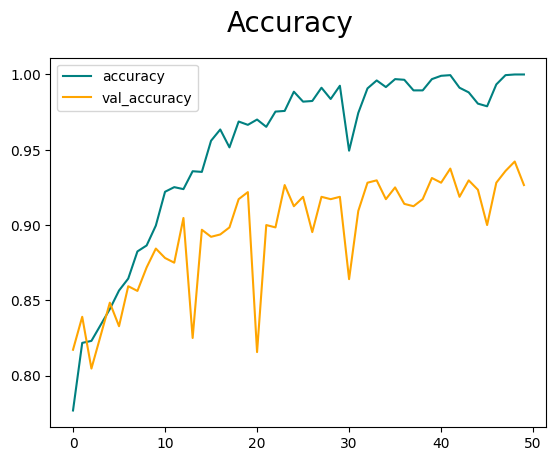

In [63]:
fig = plt.figure()
plt.plot(hist.history['accuracy'], color='teal', label='accuracy')
plt.plot(hist.history['val_accuracy'], color='orange', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=20)
plt.legend(loc="upper left")
plt.show()

In [110]:
hist = model.fit(train, epochs=50, validation_data=val, callbacks=[tensorboard_callback])

Epoch 1/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 15s 184ms/step - accuracy: 0.7065 - loss: 0.5958 - val_accuracy: 0.7828 - val_loss: 0.4977
Epoch 2/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 16s 223ms/step - accuracy: 0.8033 - loss: 0.4685 - val_accuracy: 0.8313 - val_loss: 0.4251
Epoch 3/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 13s 183ms/step - accuracy: 0.8167 - loss: 0.4381 - val_accuracy: 0.8250 - val_loss: 0.4104
Epoch 4/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 16s 226ms/step - accuracy: 0.8249 - loss: 0.4232 - val_accuracy: 0.8687 - val_loss: 0.3733
Epoch 5/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 14s 193ms/step - accuracy: 0.8417 - loss: 0.3763 - val_accuracy: 0.8375 - val_loss: 0.4008
Epoch 6/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 17s 235ms/step - accuracy: 0.8595 - loss: 0.3470 - val_accuracy: 0.8109 - val_loss: 0.5076
Epoch 7/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 16s 215ms/step - accuracy: 0.8765 - loss: 0.3007 - val_accuracy: 0.8516 - val_loss: 0.3676
Epoch 8/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 13s 183ms/step - accuracy: 0.9047 - loss: 0.2290 - val_accu

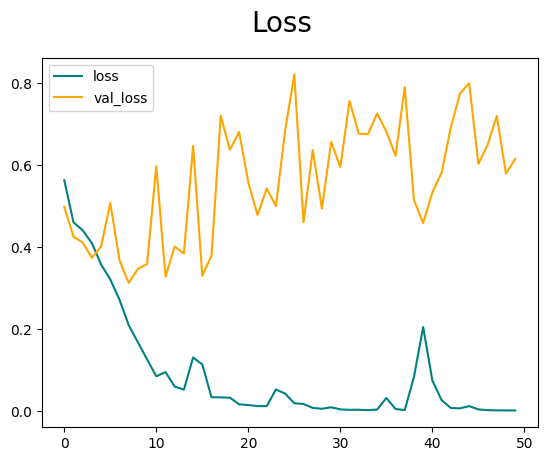

In [111]:
fig = plt.figure()
plt.plot(hist.history['loss'], color='teal', label='loss')
plt.plot(hist.history['val_loss'], color='orange', label='val_loss')
fig.suptitle('Loss', fontsize=20)
plt.legend(loc="upper left")
plt.show()

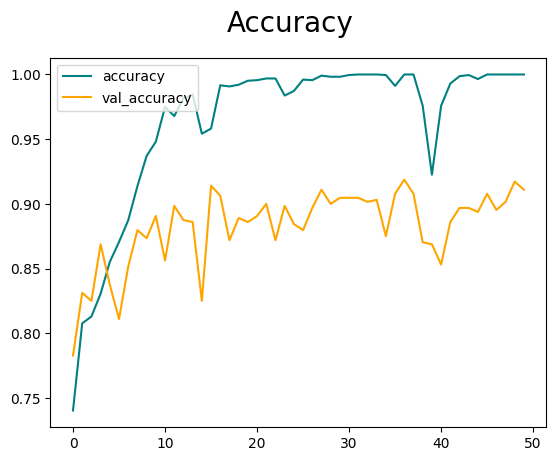

In [112]:
fig = plt.figure()
plt.plot(hist.history['accuracy'], color='teal', label='accuracy')
plt.plot(hist.history['val_accuracy'], color='orange', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=20)
plt.legend(loc="upper left")
plt.show()

In [162]:
model = Sequential([
    Conv2D(filters=32, kernel_size=(3, 3), activation='relu', padding = 'same', input_shape=(224,224,3)),
    MaxPooling2D(pool_size=(2,2), strides=2),
    Conv2D(filters=64, kernel_size=(3, 3), activation='relu', padding = 'same'),
    MaxPooling2D(pool_size=(2,2), strides=2),
    Flatten(),
    Dense(units=2, activation='softmax'),
])

In [163]:
model.summary()

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_17 (Conv2D)              │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_16 (MaxPooling2D) │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_18 (Conv2D)              │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_17 (MaxPooling2D) │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_6 (Flatten)             │ (None, 200704)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 2)              │       401,410 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 420,802 (1.61 MB)

 Trainable params: 420,802 (1.61 MB)

 Non-trainable params: 0 (0.00 B)

In [164]:
from keras.src.optimizers import Adam

model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

In [165]:
model.fit(x=train, validation_data=val, epochs=10, verbose=2)

Epoch 1/10


ValueError: Exception encountered when calling Sequential.call().

[1mInput 0 of layer "dense_10" is incompatible with the layer: expected axis -1 of input shape to have value 200704, but received input with shape (None, 262144)[0m

Arguments received by Sequential.call():
  • inputs=tf.Tensor(shape=(None, 256, 256, 3), dtype=float32)
  • training=True
  • mask=None

In [168]:
import tensorflow as tf
from tensorflow.keras import layers, models

model = models.Sequential([
    # Convolutional layers
    layers.Conv2D(filters=32, kernel_size=(3, 3), activation='relu', input_shape=(256, 256, 3)),
    layers.MaxPooling2D(pool_size=(2, 2)),
    # Add more convolutional layers if needed
    
    # Flatten layer to convert the 2D output of convolutional layers to 1D
    layers.Flatten(),
    
    # Dense layers
    layers.Dense(64, activation='relu'),
    layers.Dense(10, activation='softmax')  # Adjust units and activation as needed
])

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_20 (Conv2D)              │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_19 (MaxPooling2D) │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_8 (Flatten)             │ (None, 516128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 64)             │    33,032,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 33,033,802 (126.01 MB)

 Trainable params: 33,033,802 (126.01 MB)

 Non-trainable params: 0 (0.00 B)

In [169]:
model.fit(x=train, validation_data=val, epochs=10, verbose=2)

Epoch 1/10
71/71 - 37s - 517ms/step - accuracy: 0.6963 - loss: 3.2862 - val_accuracy: 0.8500 - val_loss: 0.4920
Epoch 2/10
71/71 - 43s - 610ms/step - accuracy: 0.8147 - loss: 0.5191 - val_accuracy: 0.5984 - val_loss: 0.7131
Epoch 3/10
71/71 - 38s - 542ms/step - accuracy: 0.8336 - loss: 0.4886 - val_accuracy: 0.8422 - val_loss: 0.4206
Epoch 4/10
71/71 - 28s - 393ms/step - accuracy: 0.8746 - loss: 0.3551 - val_accuracy: 0.8734 - val_loss: 0.3493
Epoch 5/10
71/71 - 35s - 488ms/step - accuracy: 0.9089 - loss: 0.2861 - val_accuracy: 0.8547 - val_loss: 0.4164
Epoch 6/10
71/71 - 33s - 459ms/step - accuracy: 0.9203 - loss: 0.2212 - val_accuracy: 0.8609 - val_loss: 0.3508
Epoch 7/10
71/71 - 32s - 452ms/step - accuracy: 0.9441 - loss: 0.1625 - val_accuracy: 0.8594 - val_loss: 0.3276
Epoch 8/10
71/71 - 34s - 473ms/step - accuracy: 0.9630 - loss: 0.1217 - val_accuracy: 0.9047 - val_loss: 0.2377
Epoch 9/10
71/71 - 38s - 540ms/step - accuracy: 0.9705 - loss: 0.0925 - val_accuracy: 0.8906 - val_loss:

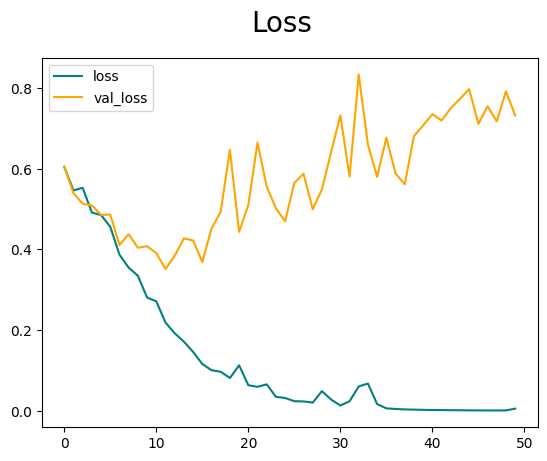

In [40]:
fig = plt.figure()
plt.plot(hist.history['loss'], color='teal', label='loss')
plt.plot(hist.history['val_loss'], color='orange', label='val_loss')
fig.suptitle('Loss', fontsize=20)
plt.legend(loc="upper left")
plt.show()

Epoch 1/1000


/Users/tabitalucaciu/UBB INFO ENGL/YEAR 3/SEM 2/Licenta/pythonProject1/.venv/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


63/63 ━━━━━━━━━━━━━━━━━━━━ 8s 110ms/step - accuracy: 0.5142 - loss: 0.7193 - val_accuracy: 0.6200 - val_loss: 0.6777
Epoch 2/1000
63/63 ━━━━━━━━━━━━━━━━━━━━ 7s 109ms/step - accuracy: 0.5844 - loss: 0.6753 - val_accuracy: 0.6100 - val_loss: 0.6485
Epoch 3/1000
63/63 ━━━━━━━━━━━━━━━━━━━━ 7s 111ms/step - accuracy: 0.6067 - loss: 0.6718 - val_accuracy: 0.5750 - val_loss: 0.7512
Epoch 4/1000
63/63 ━━━━━━━━━━━━━━━━━━━━ 7s 108ms/step - accuracy: 0.6491 - loss: 0.6292 - val_accuracy: 0.6600 - val_loss: 0.6315
Epoch 5/1000
63/63 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - accuracy: 0.6572 - loss: 0.6324 - val_accuracy: 0.6800 - val_loss: 0.5846
Epoch 6/1000
63/63 ━━━━━━━━━━━━━━━━━━━━ 7s 112ms/step - accuracy: 0.6681 - loss: 0.5996 - val_accuracy: 0.7100 - val_loss: 0.5554
Epoch 7/1000
63/63 ━━━━━━━━━━━━━━━━━━━━ 7s 113ms/step - accuracy: 0.6837 - loss: 0.5971 - val_accuracy: 0.6675 - val_loss: 0.6215
Epoch 8/1000
63/63 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - accuracy: 0.6885 - loss: 0.5843 - val_accuracy:

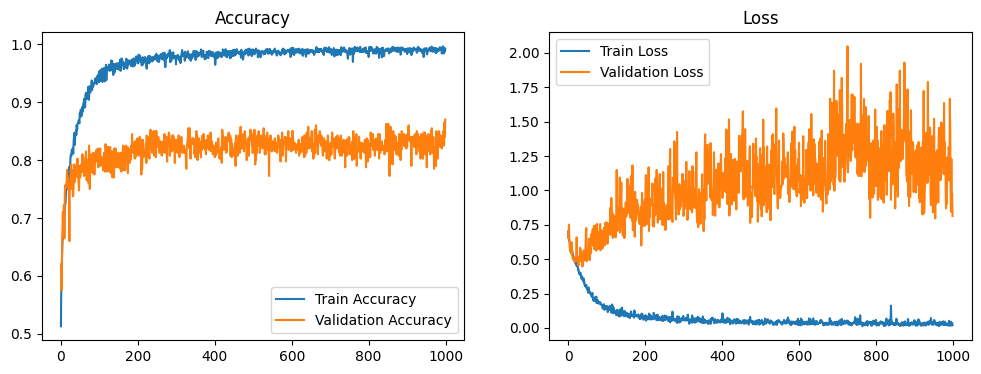

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Load and preprocess the data
X_train = np.loadtxt('input.csv', delimiter=',')
Y_train = np.loadtxt('labels.csv', delimiter=',')
X_test = np.loadtxt('input_test.csv', delimiter=',')
Y_test = np.loadtxt('labels_test.csv', delimiter=',')

# Assume 100x100 images with 3 color channels
X_train = X_train.reshape(len(X_train), 100, 100, 3) / 255.0
X_test = X_test.reshape(len(X_test), 100, 100, 3) / 255.0

# Determine number of classes from the training labels
num_classes = len(np.unique(Y_train))

# Convert labels to one-hot encoding
Y_train = tf.keras.utils.to_categorical(Y_train, num_classes=num_classes)
Y_test = tf.keras.utils.to_categorical(Y_test, num_classes=num_classes)

# Data augmentation
datagen = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True
)
datagen.fit(X_train)

# Build the model
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(100, 100, 3)),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Flatten(),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(datagen.flow(X_train, Y_train, batch_size=32),
                    validation_data=(X_test, Y_test),
                    epochs=1000,
                    callbacks=[tf.keras.callbacks.TensorBoard(log_dir='logs')])

# Plot the training history
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
ax1.plot(history.history['accuracy'], label='Train Accuracy')
ax1.plot(history.history['val_accuracy'], label='Validation Accuracy')
ax1.legend()
ax1.set_title('Accuracy')

ax2.plot(history.history['loss'], label='Train Loss')
ax2.plot(history.history['val_loss'], label='Validation Loss')
ax2.legend()
ax2.set_title('Loss')

plt.show()

In [7]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout
from tensorflow.keras.layers import RandomFlip, RandomRotation, RandomZoom, RandomTranslation
import matplotlib.pyplot as plt

# Load and preprocess the data
X_train = np.loadtxt('input.csv', delimiter=',')
Y_train = np.loadtxt('labels.csv', delimiter=',')
X_test = np.loadtxt('input_test.csv', delimiter=',')
Y_test = np.loadtxt('labels_test.csv', delimiter=',')

# Assume 100x100 images with 3 color channels
X_train = X_train.reshape(len(X_train), 100, 100, 3) / 255.0
X_test = X_test.reshape(len(X_test), 100, 100, 3) / 255.0

# Determine number of classes from the training labels
num_classes = len(np.unique(Y_train))

# Convert labels to one-hot encoding
Y_train = tf.keras.utils.to_categorical(Y_train, num_classes=num_classes)
Y_test = tf.keras.utils.to_categorical(Y_test, num_classes=num_classes)

# Build the model
model = Sequential([
    RandomFlip("horizontal_and_vertical"),
    RandomRotation(0.2),
    RandomZoom(0.2),
    RandomTranslation(0.2, 0.2),
    Conv2D(32, (3, 3), activation='relu', input_shape=(100, 100, 3)),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Flatten(),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(X_train, Y_train,
                    validation_data=(X_test, Y_test),
                    epochs=100,
                    batch_size=32,
                    callbacks=[tf.keras.callbacks.TensorBoard(log_dir='logs')])

# Plot the training history
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
ax1.plot(history.history['accuracy'], label='Train Accuracy')
ax1.plot(history.history['val_accuracy'], label='Validation Accuracy')
ax1.legend()
ax1.set_title('Accuracy')

ax2.plot(history.history['loss'], label='Train Loss')
ax2.plot(history.history['val_loss'], label='Validation Loss')
ax2.legend()
ax2.set_title('Loss')

plt.show()


Epoch 1/100
63/63 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - accuracy: 0.4934 - loss: 0.7139 - val_accuracy: 0.5000 - val_loss: 0.6924
Epoch 2/100
63/63 ━━━━━━━━━━━━━━━━━━━━ 7s 111ms/step - accuracy: 0.5052 - loss: 0.6915 - val_accuracy: 0.5850 - val_loss: 0.6773
Epoch 3/100
63/63 ━━━━━━━━━━━━━━━━━━━━ 7s 112ms/step - accuracy: 0.5512 - loss: 0.6817 - val_accuracy: 0.5525 - val_loss: 0.6870
Epoch 4/100
63/63 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - accuracy: 0.5669 - loss: 0.6816 - val_accuracy: 0.5975 - val_loss: 0.6707
Epoch 5/100
63/63 ━━━━━━━━━━━━━━━━━━━━ 7s 110ms/step - accuracy: 0.5692 - loss: 0.6732 - val_accuracy: 0.6125 - val_loss: 0.6697
Epoch 6/100
63/63 ━━━━━━━━━━━━━━━━━━━━ 7s 109ms/step - accuracy: 0.5725 - loss: 0.6808 - val_accuracy: 0.5950 - val_loss: 0.6716
Epoch 7/100
63/63 ━━━━━━━━━━━━━━━━━━━━ 7s 110ms/step - accuracy: 0.5838 - loss: 0.6708 - val_accuracy: 0.6325 - val_loss: 0.6573
Epoch 8/100
63/63 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - accuracy: 0.5999 - loss: 0.6556 - val_accu

KeyboardInterrupt: 

Found 4856 files belonging to 14 classes.
Using 3885 files for training.
Found 4856 files belonging to 14 classes.
Using 971 files for validation.
Epoch 1/100
122/122 ━━━━━━━━━━━━━━━━━━━━ 19s 141ms/step - accuracy: 0.4781 - loss: 1.8069 - val_accuracy: 0.4027 - val_loss: 1.7238
Epoch 2/100
122/122 ━━━━━━━━━━━━━━━━━━━━ 17s 136ms/step - accuracy: 0.5297 - loss: 1.5727 - val_accuracy: 0.4779 - val_loss: 1.5544
Epoch 3/100
122/122 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - accuracy: 0.5600 - loss: 1.4717 - val_accuracy: 0.5623 - val_loss: 1.4527
Epoch 4/100
122/122 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - accuracy: 0.5722 - loss: 1.4320 - val_accuracy: 0.5808 - val_loss: 1.4351
Epoch 5/100
122/122 ━━━━━━━━━━━━━━━━━━━━ 18s 147ms/step - accuracy: 0.5674 - loss: 1.4171 - val_accuracy: 0.5129 - val_loss: 1.4832
Epoch 6/100
122/122 ━━━━━━━━━━━━━━━━━━━━ 17s 140ms/step - accuracy: 0.5910 - loss: 1.3518 - val_accuracy: 0.5932 - val_loss: 1.4071
Epoch 7/100
122/122 ━━━━━━━━━━━━━━━━━━━━ 17s 141ms/step - acc

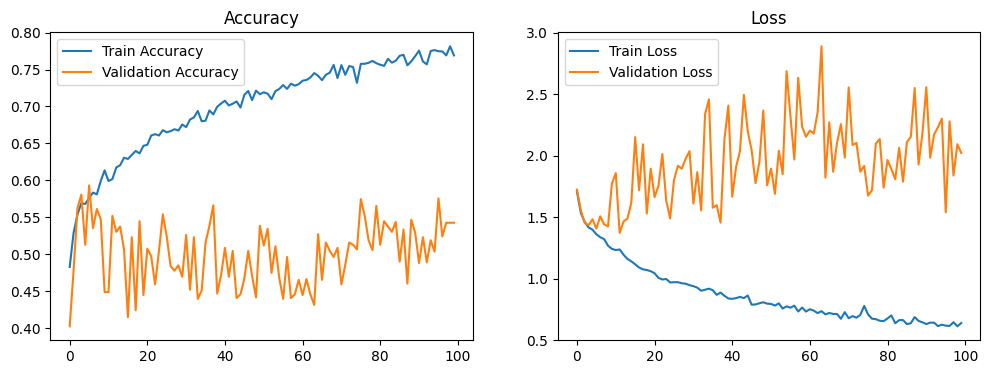

In [8]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout, RandomFlip, RandomRotation, RandomZoom, RandomTranslation
import matplotlib.pyplot as plt

# Load and preprocess the data
data_dir = 'data'

# Load dataset
data = tf.keras.utils.image_dataset_from_directory(data_dir, image_size=(100, 100), batch_size=32, seed=42, validation_split=0.2, subset='training')
val_data = tf.keras.utils.image_dataset_from_directory(data_dir, image_size=(100, 100), batch_size=32, seed=42, validation_split=0.2, subset='validation')

# Get the number of classes
num_classes = len(data.class_names)

# One-hot encode the labels
data = data.map(lambda x, y: (x / 255.0, tf.one_hot(y, num_classes)))
val_data = val_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, num_classes)))

# Data augmentation
data_augmentation = Sequential([
    RandomFlip("horizontal_and_vertical"),
    RandomRotation(0.2),
    RandomZoom(0.2),
    RandomTranslation(0.2, 0.2)
])

# Build the model
model = Sequential([
    data_augmentation,
    Conv2D(32, (3, 3), activation='relu', input_shape=(100, 100, 3)),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Flatten(),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(data, validation_data=val_data, epochs=100, callbacks=[tf.keras.callbacks.TensorBoard(log_dir='logs')])

# Plot the training history
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
ax1.plot(history.history['accuracy'], label='Train Accuracy')
ax1.plot(history.history['val_accuracy'], label='Validation Accuracy')
ax1.legend()
ax1.set_title('Accuracy')

ax2.plot(history.history['loss'], label='Train Loss')
ax2.plot(history.history['val_loss'], label='Validation Loss')
ax2.legend()
ax2.set_title('Loss')

plt.show()


Found 4856 files belonging to 14 classes.
Using 3885 files for training.
Found 4856 files belonging to 14 classes.
Using 971 files for validation.
Epoch 1/100
122/122 ━━━━━━━━━━━━━━━━━━━━ 19s 140ms/step - accuracy: 0.4610 - loss: 3.9893 - val_accuracy: 0.4593 - val_loss: 1.9437
Epoch 2/100
122/122 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - accuracy: 0.4951 - loss: 1.8935 - val_accuracy: 0.4593 - val_loss: 1.7906
Epoch 3/100
122/122 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - accuracy: 0.4985 - loss: 1.8082 - val_accuracy: 0.4593 - val_loss: 1.7565
Epoch 4/100
122/122 ━━━━━━━━━━━━━━━━━━━━ 19s 152ms/step - accuracy: 0.4909 - loss: 1.7729 - val_accuracy: 0.4593 - val_loss: 1.7700
Epoch 5/100
122/122 ━━━━━━━━━━━━━━━━━━━━ 18s 144ms/step - accuracy: 0.4913 - loss: 1.7615 - val_accuracy: 0.4593 - val_loss: 1.7265
Epoch 6/100
122/122 ━━━━━━━━━━━━━━━━━━━━ 18s 143ms/step - accuracy: 0.4939 - loss: 1.7306 - val_accuracy: 0.4593 - val_loss: 1.7334
Epoch 7/100
122/122 ━━━━━━━━━━━━━━━━━━━━ 22s 173ms/step - acc

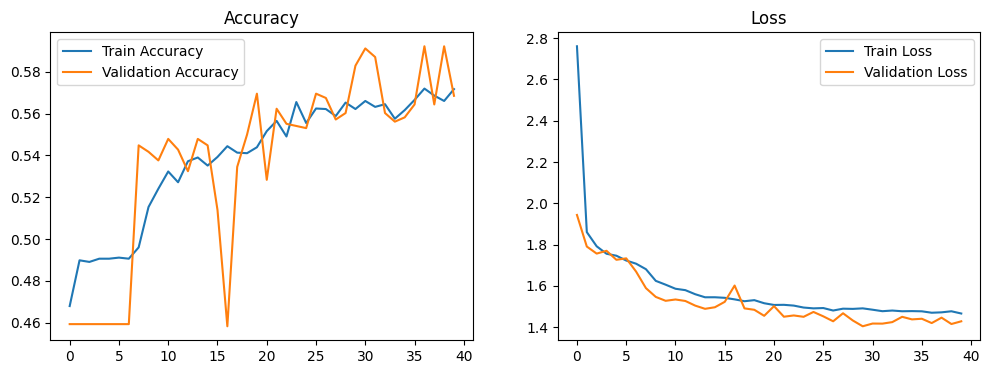

In [9]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout
from tensorflow.keras.layers import RandomFlip, RandomRotation, RandomZoom, RandomTranslation
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt

# Load and preprocess the data
data_dir = 'data'

# Load dataset
data = tf.keras.utils.image_dataset_from_directory(data_dir, image_size=(100, 100), batch_size=32, seed=42, validation_split=0.2, subset='training')
val_data = tf.keras.utils.image_dataset_from_directory(data_dir, image_size=(100, 100), batch_size=32, seed=42, validation_split=0.2, subset='validation')

# Get the number of classes
num_classes = len(data.class_names)

# One-hot encode the labels
data = data.map(lambda x, y: (x / 255.0, tf.one_hot(y, num_classes)))
val_data = val_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, num_classes)))

# Data augmentation
data_augmentation = Sequential([
    RandomFlip("horizontal_and_vertical"),
    RandomRotation(0.2),
    RandomZoom(0.2),
    RandomTranslation(0.2, 0.2)
])

# Build the model
model = Sequential([
    data_augmentation,
    Conv2D(32, (3, 3), activation='relu', input_shape=(100, 100, 3), kernel_regularizer=l2(0.01)),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l2(0.01)),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l2(0.01)),
    MaxPooling2D(pool_size=(2, 2)),
    Flatten(),
    Dense(256, activation='relu', kernel_regularizer=l2(0.01)),
    Dropout(0.5),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
history = model.fit(data, validation_data=val_data, epochs=100, callbacks=[early_stopping, tf.keras.callbacks.TensorBoard(log_dir='logs')])

# Plot the training history
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
ax1.plot(history.history['accuracy'], label='Train Accuracy')
ax1.plot(history.history['val_accuracy'], label='Validation Accuracy')
ax1.legend()
ax1.set_title('Accuracy')

ax2.plot(history.history['loss'], label='Train Loss')
ax2.plot(history.history['val_loss'], label='Validation Loss')
ax2.legend()
ax2.set_title('Loss')

plt.show()


Found 4856 files belonging to 14 classes.
Using 3885 files for training.
Found 4856 files belonging to 14 classes.
Using 971 files for validation.
Epoch 1/10
122/122 ━━━━━━━━━━━━━━━━━━━━ 19s 140ms/step - accuracy: 0.4738 - loss: 6.9080 - val_accuracy: 0.4593 - val_loss: 3.9478
Epoch 2/10
122/122 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - accuracy: 0.4935 - loss: 3.6135 - val_accuracy: 0.4593 - val_loss: 2.8230
Epoch 3/10
122/122 ━━━━━━━━━━━━━━━━━━━━ 18s 147ms/step - accuracy: 0.4936 - loss: 2.7108 - val_accuracy: 0.4593 - val_loss: 2.4063
Epoch 4/10
122/122 ━━━━━━━━━━━━━━━━━━━━ 18s 147ms/step - accuracy: 0.4993 - loss: 2.3575 - val_accuracy: 0.5324 - val_loss: 2.1918
Epoch 5/10
122/122 ━━━━━━━━━━━━━━━━━━━━ 18s 146ms/step - accuracy: 0.4978 - loss: 2.1761 - val_accuracy: 0.5139 - val_loss: 2.0128
Epoch 6/10
122/122 ━━━━━━━━━━━━━━━━━━━━ 22s 182ms/step - accuracy: 0.5246 - loss: 2.0281 - val_accuracy: 0.5427 - val_loss: 1.9216
Epoch 7/10
122/122 ━━━━━━━━━━━━━━━━━━━━ 18s 145ms/step - accuracy: 

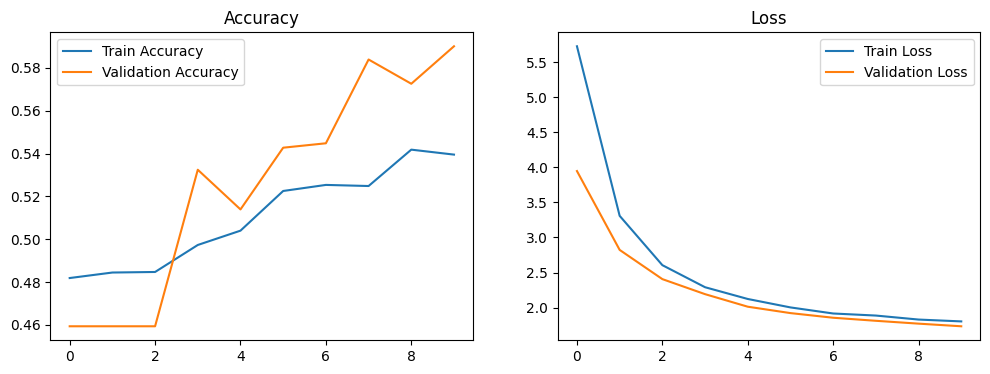

In [10]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout
from tensorflow.keras.layers import RandomFlip, RandomRotation, RandomZoom, RandomTranslation
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.regularizers import l2
import matplotlib.pyplot as plt

# Load and preprocess the data
data_dir = 'data'

# Load dataset
data = tf.keras.utils.image_dataset_from_directory(data_dir, image_size=(100, 100), batch_size=32, seed=42, validation_split=0.2, subset='training')
val_data = tf.keras.utils.image_dataset_from_directory(data_dir, image_size=(100, 100), batch_size=32, seed=42, validation_split=0.2, subset='validation')

# Get the number of classes
num_classes = len(data.class_names)

# One-hot encode the labels
data = data.map(lambda x, y: (x / 255.0, tf.one_hot(y, num_classes)))
val_data = val_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, num_classes)))

# Data augmentation
data_augmentation = Sequential([
    RandomFlip("horizontal_and_vertical"),
    RandomRotation(0.3),
    RandomZoom(0.3),
    RandomTranslation(0.3, 0.3)
])

# Build the model
model = Sequential([
    data_augmentation,
    Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l2(0.01), input_shape=(100, 100, 3)),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l2(0.01)),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l2(0.01)),
    MaxPooling2D(pool_size=(2, 2)),
    Flatten(),
    Dense(256, activation='relu', kernel_regularizer=l2(0.01)),
    Dropout(0.5),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Implement Early Stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
history = model.fit(data, validation_data=val_data, epochs=10, callbacks=[early_stopping, tf.keras.callbacks.TensorBoard(log_dir='logs')])

# Plot the training history
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
ax1.plot(history.history['accuracy'], label='Train Accuracy')
ax1.plot(history.history['val_accuracy'], label='Validation Accuracy')
ax1.legend()
ax1.set_title('Accuracy')

ax2.plot(history.history['loss'], label='Train Loss')
ax2.plot(history.history['val_loss'], label='Validation Loss')
ax2.legend()
ax2.set_title('Loss')

plt.show()


In [11]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout, BatchNormalization
from tensorflow.keras.layers import RandomFlip, RandomRotation, RandomZoom, RandomTranslation
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.regularizers import l2
import matplotlib.pyplot as plt

# Load and preprocess the data
data_dir = 'data'

# Load dataset
data = tf.keras.utils.image_dataset_from_directory(data_dir, image_size=(100, 100), batch_size=32, seed=42, validation_split=0.2, subset='training')
val_data = tf.keras.utils.image_dataset_from_directory(data_dir, image_size=(100, 100), batch_size=32, seed=42, validation_split=0.2, subset='validation')

# Get the number of classes
num_classes = len(data.class_names)

# One-hot encode the labels
data = data.map(lambda x, y: (x / 255.0, tf.one_hot(y, num_classes)))
val_data = val_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, num_classes)))

# Data augmentation
data_augmentation = Sequential([
    RandomFlip("horizontal_and_vertical"),
    RandomRotation(0.3),
    RandomZoom(0.3),
    RandomTranslation(0.3, 0.3)
])

# Build the model
model = Sequential([
    data_augmentation,
    Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l2(0.01), input_shape=(100, 100, 3)),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l2(0.01)),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l2(0.01)),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Flatten(),
    Dense(256, activation='relu', kernel_regularizer=l2(0.01)),
    Dropout(0.5),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Implement Early Stopping and ReduceLROnPlateau
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)

# Train the model
history = model.fit(data, validation_data=val_data, epochs=100, callbacks=[early_stopping, reduce_lr, tf.keras.callbacks.TensorBoard(log_dir='logs')])

# Plot the training history
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
ax1.plot(history.history['accuracy'], label='Train Accuracy')
ax1.plot(history.history['val_accuracy'], label='Validation Accuracy')
ax1.legend()
ax1.set_title('Accuracy')

ax2.plot(history.history['loss'], label='Train Loss')
ax2.plot(history.history['val_loss'], label='Validation Loss')
ax2.legend()
ax2.set_title('Loss')

plt.show()

Found 4856 files belonging to 14 classes.
Using 3885 files for training.
Found 4856 files belonging to 14 classes.
Using 971 files for validation.
Epoch 1/100
122/122 ━━━━━━━━━━━━━━━━━━━━ 38s 291ms/step - accuracy: 0.3892 - loss: 8.9649 - val_accuracy: 0.0051 - val_loss: 11.3979 - learning_rate: 1.0000e-04
Epoch 2/100
122/122 ━━━━━━━━━━━━━━━━━━━━ 26s 209ms/step - accuracy: 0.5132 - loss: 7.7136 - val_accuracy: 0.0185 - val_loss: 13.8914 - learning_rate: 1.0000e-04
Epoch 3/100
122/122 ━━━━━━━━━━━━━━━━━━━━ 27s 216ms/step - accuracy: 0.5324 - loss: 7.3267 - val_accuracy: 0.2698 - val_loss: 9.4626 - learning_rate: 1.0000e-04
Epoch 4/100
122/122 ━━━━━━━━━━━━━━━━━━━━ 30s 242ms/step - accuracy: 0.5440 - loss: 7.0151 - val_accuracy: 0.4624 - val_loss: 7.5209 - learning_rate: 1.0000e-04
Epoch 5/100
122/122 ━━━━━━━━━━━━━━━━━━━━ 28s 222ms/step - accuracy: 0.5454 - loss: 6.6396 - val_accuracy: 0.4706 - val_loss: 6.4853 - learning_rate: 1.0000e-04
Epoch 6/100
122/122 ━━━━━━━━━━━━━━━━━━━━ 34s 274ms/

KeyboardInterrupt: 

Found 4856 files belonging to 14 classes.
Using 3885 files for training.
Found 4856 files belonging to 14 classes.
Using 971 files for validation.


Exception: URL fetch failure on https://storage.googleapis.com/tensorflow/keras-applications/mobilenet_v2/mobilenet_v2_weights_tf_dim_ordering_tf_kernels_1.0_160_no_top.h5: None -- [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1006)

Found 4856 files belonging to 14 classes.
Using 3885 files for training.
Found 4856 files belonging to 14 classes.
Using 971 files for validation.
Epoch 1/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - accuracy: 0.4294 - loss: 1.9099 - val_accuracy: 0.6725 - val_loss: 1.0375 - learning_rate: 1.0000e-04
Epoch 2/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 21s 166ms/step - accuracy: 0.6320 - loss: 1.1190 - val_accuracy: 0.7085 - val_loss: 0.8658 - learning_rate: 1.0000e-04
Epoch 3/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 22s 176ms/step - accuracy: 0.6860 - loss: 0.9317 - val_accuracy: 0.7394 - val_loss: 0.7896 - learning_rate: 1.0000e-04
Epoch 4/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 23s 184ms/step - accuracy: 0.7160 - loss: 0.8418 - val_accuracy: 0.7467 - val_loss: 0.7281 - learning_rate: 1.0000e-04
Epoch 5/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - accuracy: 0.7327 - loss: 0.7645 - val_accuracy: 0.7621 - val_loss: 0.6848 - learning_rate: 1.0000e-04
Epoch 6/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 24s 196ms/step - a

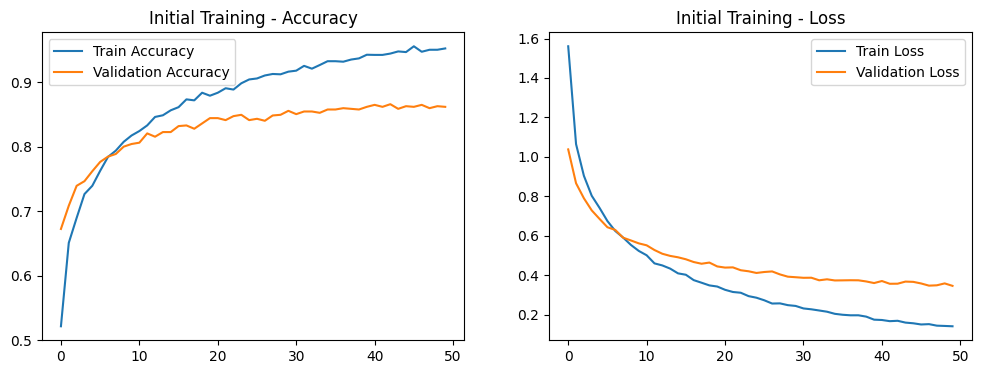

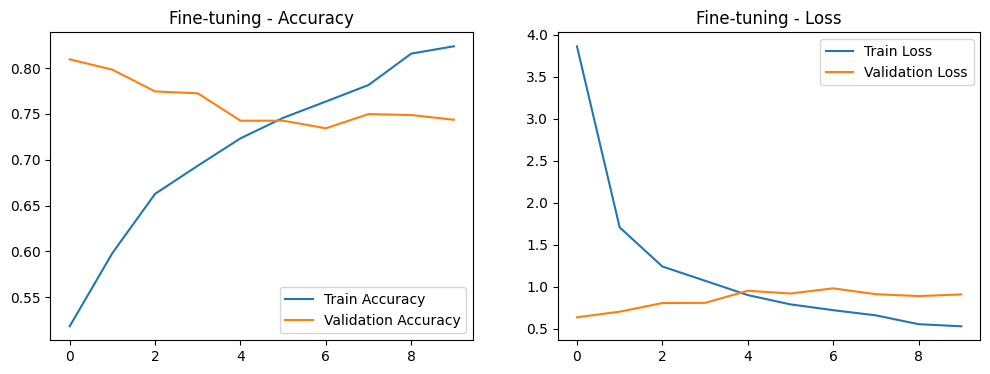

31/31 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - accuracy: 0.8253 - loss: 0.6653
Validation Accuracy: 80.95%


In [15]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout, GlobalAveragePooling2D
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt

# Load and preprocess the data
data_dir = 'data'

# Load dataset
data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),  # MobileNetV2 expects images of at least 160x160
    batch_size=32,
    seed=42,
    validation_split=0.2,
    subset='training'
)
val_data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),
    batch_size=32,
    seed=42,
    validation_split=0.2,
    subset='validation'
)

# Get the number of classes
num_classes = len(data.class_names)

# Normalize the images
data = data.map(lambda x, y: (x / 255.0, tf.one_hot(y, num_classes)))
val_data = val_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, num_classes)))

# Load pre-trained MobileNetV2 model + higher level layers
weights_path = 'mobilenet_v2_weights_tf_dim_ordering_tf_kernels_1.0_160_no_top.h5'
base_model = MobileNetV2(input_shape=(160, 160, 3), include_top=False, weights=None)
base_model.load_weights(weights_path)
base_model.trainable = False  # Freeze the base model

# Build the model
model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Implement Early Stopping and ReduceLROnPlateau
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)

# Train the model
history = model.fit(data, validation_data=val_data, epochs=50, callbacks=[early_stopping, reduce_lr])

# Unfreeze some layers in the base model for fine-tuning
base_model.trainable = True
fine_tune_at = 100  # Fine-tune from this layer onwards

for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])

# Continue training the model
history_fine = model.fit(data, validation_data=val_data, epochs=50, callbacks=[early_stopping, reduce_lr])

# Plot the training history
def plot_history(history, title):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(history.history['accuracy'], label='Train Accuracy')
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy')
    ax1.legend()
    ax1.set_title(f'{title} - Accuracy')

    ax2.plot(history.history['loss'], label='Train Loss')
    ax2.plot(history.history['val_loss'], label='Validation Loss')
    ax2.legend()
    ax2.set_title(f'{title} - Loss')

    plt.show()

plot_history(history, 'Initial Training')
plot_history(history_fine, 'Fine-tuning')

# Evaluate the model
val_loss, val_accuracy = model.evaluate(val_data)
print(f'Validation Accuracy: {val_accuracy * 100:.2f}%')


Found 4856 files belonging to 14 classes.
Using 3885 files for training.
Found 4856 files belonging to 14 classes.
Using 971 files for validation.
Epoch 1/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 26s 188ms/step - accuracy: 0.4342 - loss: 1.9163 - val_accuracy: 0.6128 - val_loss: 1.2739 - learning_rate: 1.0000e-04
Epoch 2/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 23s 185ms/step - accuracy: 0.5790 - loss: 1.3182 - val_accuracy: 0.6457 - val_loss: 1.1172 - learning_rate: 1.0000e-04
Epoch 3/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 24s 192ms/step - accuracy: 0.6192 - loss: 1.1687 - val_accuracy: 0.6529 - val_loss: 1.1023 - learning_rate: 1.0000e-04
Epoch 4/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 23s 190ms/step - accuracy: 0.6425 - loss: 1.0900 - val_accuracy: 0.6777 - val_loss: 1.0500 - learning_rate: 1.0000e-04
Epoch 5/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 23s 188ms/step - accuracy: 0.6489 - loss: 1.0584 - val_accuracy: 0.6797 - val_loss: 1.0251 - learning_rate: 1.0000e-04
Epoch 6/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 23s 189ms/step - a

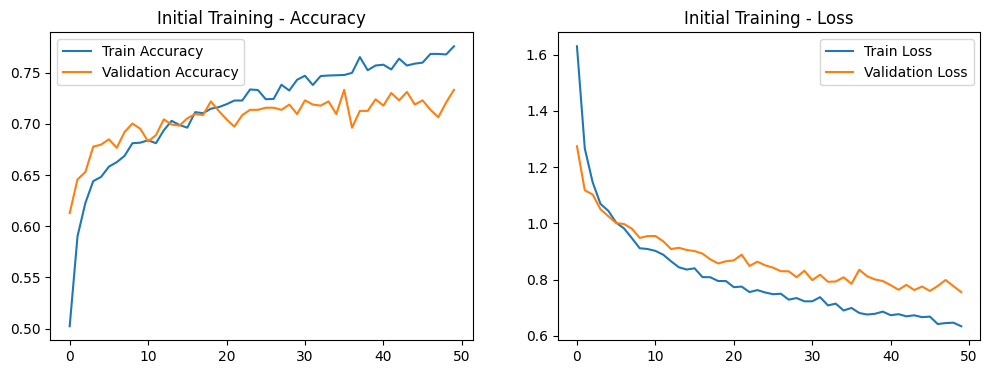

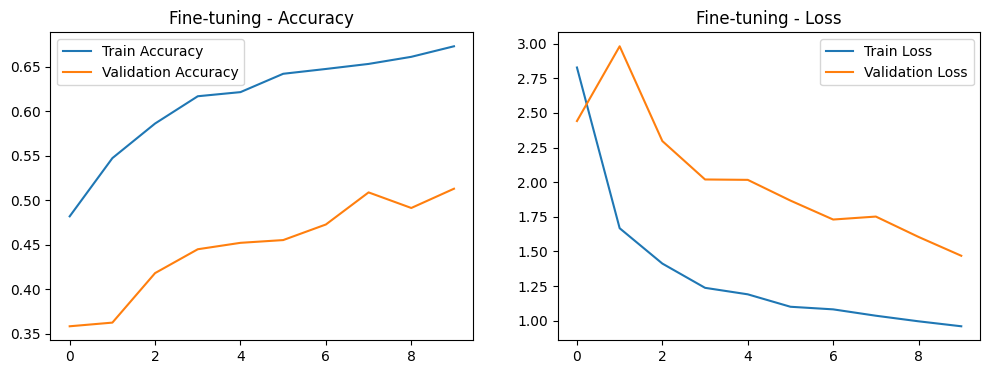

31/31 ━━━━━━━━━━━━━━━━━━━━ 4s 122ms/step - accuracy: 0.3696 - loss: 2.3296
Validation Accuracy: 35.84%


In [16]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt

# Load and preprocess the data
data_dir = 'data'

# Load dataset
data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),  # MobileNetV2 expects images of at least 160x160
    batch_size=32,
    seed=42,
    validation_split=0.2,
    subset='training'
)
val_data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),
    batch_size=32,
    seed=42,
    validation_split=0.2,
    subset='validation'
)

# Get the number of classes
num_classes = len(data.class_names)

# Normalize the images
data = data.map(lambda x, y: (x / 255.0, tf.one_hot(y, num_classes)))
val_data = val_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, num_classes)))

# Data augmentation
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.3),
    tf.keras.layers.RandomZoom(0.3),
    tf.keras.layers.RandomTranslation(0.3, 0.3)
])

# Load pre-trained MobileNetV2 model + higher level layers
weights_path = 'mobilenet_v2_weights_tf_dim_ordering_tf_kernels_1.0_160_no_top.h5'
base_model = MobileNetV2(input_shape=(160, 160, 3), include_top=False, weights=None)
base_model.load_weights(weights_path)
base_model.trainable = False  # Freeze the base model

# Build the model
model = Sequential([
    data_augmentation,
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Implement Early Stopping and ReduceLROnPlateau
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)

# Train the model
history = model.fit(data, validation_data=val_data, epochs=50, callbacks=[early_stopping, reduce_lr])

# Unfreeze more layers in the base model for fine-tuning
base_model.trainable = True
fine_tune_at = 50  # Fine-tune from this layer onwards

for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])

# Continue training the model
history_fine = model.fit(data, validation_data=val_data, epochs=50, callbacks=[early_stopping, reduce_lr])

# Plot the training history
def plot_history(history, title):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(history.history['accuracy'], label='Train Accuracy')
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy')
    ax1.legend()
    ax1.set_title(f'{title} - Accuracy')

    ax2.plot(history.history['loss'], label='Train Loss')
    ax2.plot(history.history['val_loss'], label='Validation Loss')
    ax2.legend()
    ax2.set_title(f'{title} - Loss')

    plt.show()

plot_history(history, 'Initial Training')
plot_history(history_fine, 'Fine-tuning')

# Evaluate the model
val_loss, val_accuracy = model.evaluate(val_data)
print(f'Validation Accuracy: {val_accuracy * 100:.2f}%')

Found 4856 files belonging to 14 classes.
Using 3885 files for training.
Found 4856 files belonging to 14 classes.
Using 971 files for validation.
Epoch 1/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 25s 183ms/step - accuracy: 0.3600 - loss: 2.2316 - val_accuracy: 0.5438 - val_loss: 1.4240 - learning_rate: 1.0000e-04
Epoch 2/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 22s 176ms/step - accuracy: 0.5291 - loss: 1.5436 - val_accuracy: 0.6045 - val_loss: 1.2542 - learning_rate: 1.0000e-04
Epoch 3/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 23s 186ms/step - accuracy: 0.5531 - loss: 1.3978 - val_accuracy: 0.6241 - val_loss: 1.1933 - learning_rate: 1.0000e-04
Epoch 4/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 24s 191ms/step - accuracy: 0.5778 - loss: 1.3410 - val_accuracy: 0.6488 - val_loss: 1.1255 - learning_rate: 1.0000e-04
Epoch 5/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 22s 182ms/step - accuracy: 0.5903 - loss: 1.2737 - val_accuracy: 0.6519 - val_loss: 1.0935 - learning_rate: 1.0000e-04
Epoch 6/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 23s 188ms/step - a

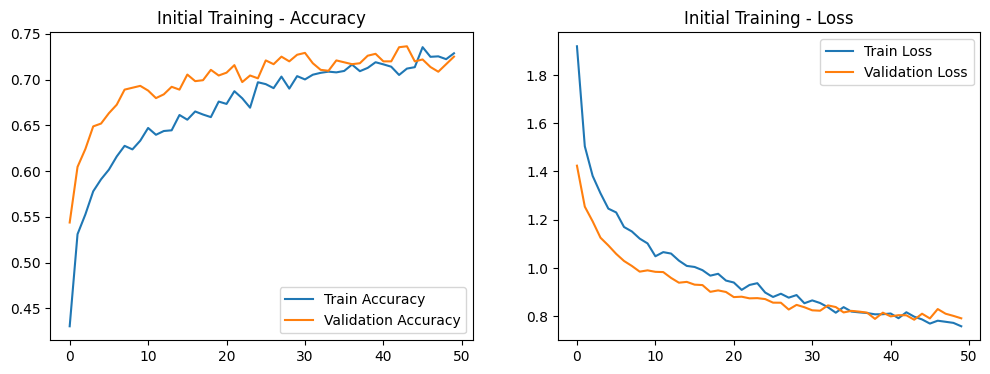

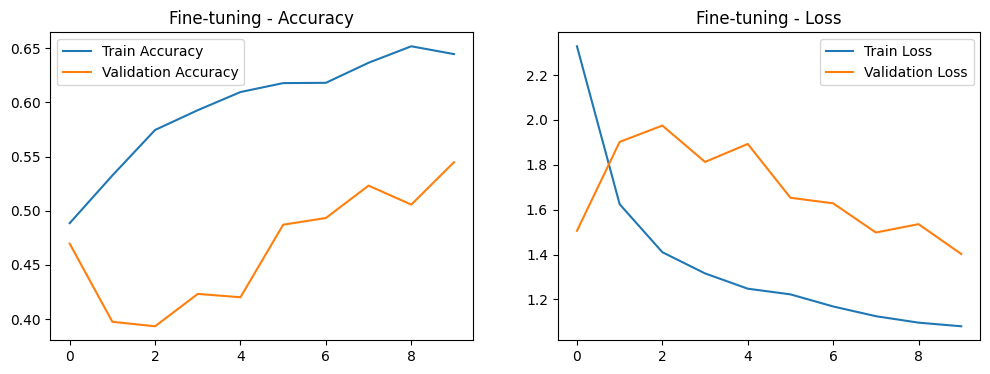

31/31 ━━━━━━━━━━━━━━━━━━━━ 6s 171ms/step - accuracy: 0.4731 - loss: 1.4586
Validation Accuracy: 46.96%


In [17]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt

# Load and preprocess the data
data_dir = 'data'

# Load dataset
data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),  # MobileNetV2 expects images of at least 160x160
    batch_size=32,
    seed=42,
    validation_split=0.2,
    subset='training'
)
val_data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),
    batch_size=32,
    seed=42,
    validation_split=0.2,
    subset='validation'
)

# Get the number of classes
num_classes = len(data.class_names)

# Normalize the images
data = data.map(lambda x, y: (x / 255.0, tf.one_hot(y, num_classes)))
val_data = val_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, num_classes)))

# Data augmentation
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.3),
    tf.keras.layers.RandomZoom(0.3),
    tf.keras.layers.RandomTranslation(0.3, 0.3),
    tf.keras.layers.RandomContrast(0.2)
])

# Load pre-trained MobileNetV2 model + higher level layers
weights_path = 'mobilenet_v2_weights_tf_dim_ordering_tf_kernels_1.0_160_no_top.h5'
base_model = MobileNetV2(input_shape=(160, 160, 3), include_top=False, weights=None)
base_model.load_weights(weights_path)
base_model.trainable = False  # Freeze the base model

# Build the model
model = Sequential([
    data_augmentation,
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Implement Early Stopping and ReduceLROnPlateau
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)

# Train the model
history = model.fit(data, validation_data=val_data, epochs=50, callbacks=[early_stopping, reduce_lr])

# Unfreeze more layers in the base model for fine-tuning
base_model.trainable = True
fine_tune_at = 50  # Fine-tune from this layer onwards

for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])

# Continue training the model
history_fine = model.fit(data, validation_data=val_data, epochs=50, callbacks=[early_stopping, reduce_lr])

# Plot the training history
def plot_history(history, title):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(history.history['accuracy'], label='Train Accuracy')
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy')
    ax1.legend()
    ax1.set_title(f'{title} - Accuracy')

    ax2.plot(history.history['loss'], label='Train Loss')
    ax2.plot(history.history['val_loss'], label='Validation Loss')
    ax2.legend()
    ax2.set_title(f'{title} - Loss')

    plt.show()

plot_history(history, 'Initial Training')
plot_history(history_fine, 'Fine-tuning')

# Evaluate the model
val_loss, val_accuracy = model.evaluate(val_data)
print(f'Validation Accuracy: {val_accuracy * 100:.2f}%')


Found 4856 files belonging to 14 classes.
Using 3885 files for training.
Found 4856 files belonging to 14 classes.
Using 971 files for validation.
Epoch 1/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 25s 186ms/step - accuracy: 0.3504 - loss: 2.2189 - val_accuracy: 0.5695 - val_loss: 1.3851 - learning_rate: 1.0000e-04
Epoch 2/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 22s 181ms/step - accuracy: 0.5200 - loss: 1.5655 - val_accuracy: 0.5953 - val_loss: 1.2385 - learning_rate: 1.0000e-04
Epoch 3/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 23s 186ms/step - accuracy: 0.5480 - loss: 1.4066 - val_accuracy: 0.6231 - val_loss: 1.1876 - learning_rate: 1.0000e-04
Epoch 4/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 23s 184ms/step - accuracy: 0.5687 - loss: 1.3466 - val_accuracy: 0.6375 - val_loss: 1.1293 - learning_rate: 1.0000e-04
Epoch 5/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 25s 202ms/step - accuracy: 0.5810 - loss: 1.3006 - val_accuracy: 0.6612 - val_loss: 1.1012 - learning_rate: 1.0000e-04
Epoch 6/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 41s 333ms/step - a

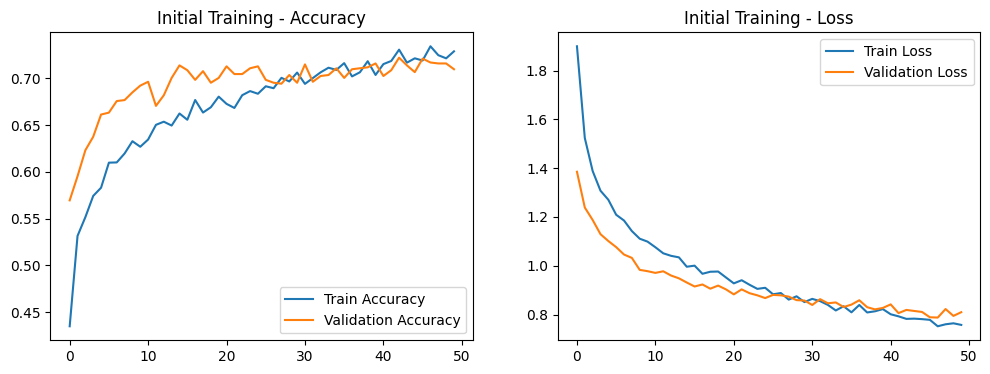

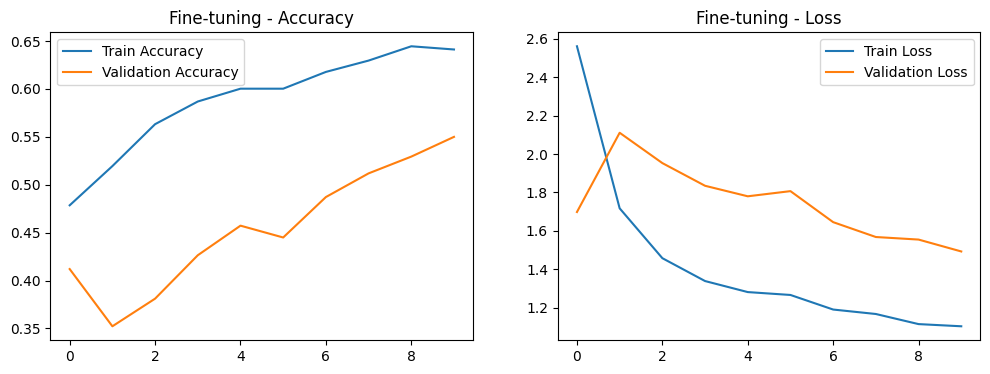

31/31 ━━━━━━━━━━━━━━━━━━━━ 6s 187ms/step - accuracy: 0.4344 - loss: 1.6153
Validation Accuracy: 41.19%


In [18]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt

# Load and preprocess the data
data_dir = 'data'

# Load dataset
data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),  # MobileNetV2 expects images of at least 160x160
    batch_size=32,
    seed=42,
    validation_split=0.2,
    subset='training'
)
val_data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),
    batch_size=32,
    seed=42,
    validation_split=0.2,
    subset='validation'
)

# Get the number of classes
num_classes = len(data.class_names)

# Normalize the images
data = data.map(lambda x, y: (x / 255.0, tf.one_hot(y, num_classes)))
val_data = val_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, num_classes)))

# Data augmentation
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.3),
    tf.keras.layers.RandomZoom(0.3),
    tf.keras.layers.RandomTranslation(0.3, 0.3),
    tf.keras.layers.RandomContrast(0.2)
])

# Load pre-trained MobileNetV2 model + higher level layers
weights_path = 'mobilenet_v2_weights_tf_dim_ordering_tf_kernels_1.0_160_no_top.h5'
base_model = MobileNetV2(input_shape=(160, 160, 3), include_top=False, weights=None)
base_model.load_weights(weights_path)
base_model.trainable = False  # Freeze the base model

# Build the model
model = Sequential([
    data_augmentation,
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Implement Early Stopping and ReduceLROnPlateau
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)

# Train the model
history = model.fit(data, validation_data=val_data, epochs=50, callbacks=[early_stopping, reduce_lr])

# Unfreeze more layers in the base model for fine-tuning
base_model.trainable = True
fine_tune_at = 20  # Fine-tune from this layer onwards (increase to fine-tune more layers)

for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])

# Continue training the model
history_fine = model.fit(data, validation_data=val_data, epochs=20, callbacks=[early_stopping, reduce_lr])

# Plot the training history
def plot_history(history, title):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(history.history['accuracy'], label='Train Accuracy')
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy')
    ax1.legend()
    ax1.set_title(f'{title} - Accuracy')

    ax2.plot(history.history['loss'], label='Train Loss')
    ax2.plot(history.history['val_loss'], label='Validation Loss')
    ax2.legend()
    ax2.set_title(f'{title} - Loss')

    plt.show()

plot_history(history, 'Initial Training')
plot_history(history_fine, 'Fine-tuning')

# Evaluate the model
val_loss, val_accuracy = model.evaluate(val_data)
print(f'Validation Accuracy: {val_accuracy * 100:.2f}%')

In [20]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt

# Load and preprocess the data
data_dir = 'data'

# Load dataset
data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(224, 224),  # EfficientNetB0 expects images of at least 224x224
    batch_size=32,
    seed=42,
    validation_split=0.2,
    subset='training'
)
val_data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(224, 224),
    batch_size=32,
    seed=42,
    validation_split=0.2,
    subset='validation'
)

# Get the number of classes
num_classes = len(data.class_names)

# Normalize the images
data = data.map(lambda x, y: (x / 255.0, tf.one_hot(y, num_classes)))
val_data = val_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, num_classes)))

# Data augmentation
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.3),
    tf.keras.layers.RandomZoom(0.3),
    tf.keras.layers.RandomTranslation(0.3, 0.3),
    tf.keras.layers.RandomContrast(0.2)
])

# Load pre-trained EfficientNetB0 model + higher level layers
base_model = EfficientNetB0(input_shape=(224, 224, 3), include_top=False, weights='imagenet')
base_model.trainable = False  # Freeze the base model

# Build the model
model = Sequential([
    data_augmentation,
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Implement Early Stopping and ReduceLROnPlateau
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)

# Train the model
history = model.fit(data, validation_data=val_data, epochs=50, callbacks=[early_stopping, reduce_lr])

# Unfreeze more layers in the base model for fine-tuning
base_model.trainable = True
fine_tune_at = 20  # Fine-tune from this layer onwards (increase to fine-tune more layers)

for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])

# Continue training the model
history_fine = model.fit(data, validation_data=val_data, epochs=50, callbacks=[early_stopping, reduce_lr])

# Plot the training history
def plot_history(history, title):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(history.history['accuracy'], label='Train Accuracy')
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy')
    ax1.legend()
    ax1.set_title(f'{title} - Accuracy')

    ax2.plot(history.history['loss'], label='Train Loss')
    ax2.plot(history.history['val_loss'], label='Validation Loss')
    ax2.legend()
    ax2.set_title(f'{title} - Loss')

    plt.show()

plot_history(history, 'Initial Training')
plot_history(history_fine, 'Fine-tuning')

# Evaluate the model
val_loss, val_accuracy = model.evaluate(val_data)
print(f'Validation Accuracy: {val_accuracy * 100:.2f}%')


Found 4856 files belonging to 14 classes.
Using 3885 files for training.
Found 4856 files belonging to 14 classes.
Using 971 files for validation.


Exception: URL fetch failure on https://storage.googleapis.com/keras-applications/efficientnetb0_notop.h5: None -- [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1006)

In [21]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt

# Load and preprocess the data
data_dir = 'data'

# Load dataset
data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(224, 224),  # EfficientNetB0 expects images of at least 224x224
    batch_size=32,
    seed=42,
    validation_split=0.2,
    subset='training'
)
val_data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(224, 224),
    batch_size=32,
    seed=42,
    validation_split=0.2,
    subset='validation'
)

# Get the number of classes
num_classes = len(data.class_names)

# Normalize the images
data = data.map(lambda x, y: (x / 255.0, tf.one_hot(y, num_classes)))
val_data = val_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, num_classes)))

# Data augmentation
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.3),
    tf.keras.layers.RandomZoom(0.3),
    tf.keras.layers.RandomTranslation(0.3, 0.3),
    tf.keras.layers.RandomContrast(0.2)
])

# Load pre-trained EfficientNetB0 model + higher level layers
weights_path = 'efficientnetb0_notop.h5'
base_model = EfficientNetB0(input_shape=(224, 224, 3), include_top=False, weights=None)
base_model.load_weights(weights_path)
base_model.trainable = False  # Freeze the base model

# Build the model
model = Sequential([
    data_augmentation,
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Implement Early Stopping and ReduceLROnPlateau
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)

# Train the model
history = model.fit(data, validation_data=val_data, epochs=50, callbacks=[early_stopping, reduce_lr])

# Unfreeze more layers in the base model for fine-tuning
base_model.trainable = True
fine_tune_at = 20  # Fine-tune from this layer onwards (increase to fine-tune more layers)

for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])

# Continue training the model
history_fine = model.fit(data, validation_data=val_data, epochs=50, callbacks=[early_stopping, reduce_lr])

# Plot the training history
def plot_history(history, title):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(history.history['accuracy'], label='Train Accuracy')
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy')
    ax1.legend()
    ax1.set_title(f'{title} - Accuracy')

    ax2.plot(history.history['loss'], label='Train Loss')
    ax2.plot(history.history['val_loss'], label='Validation Loss')
    ax2.legend()
    ax2.set_title(f'{title} - Loss')

    plt.show()

plot_history(history, 'Initial Training')
plot_history(history_fine, 'Fine-tuning')

# Evaluate the model
val_loss, val_accuracy = model.evaluate(val_data)
print(f'Validation Accuracy: {val_accuracy * 100:.2f}%')


Found 4856 files belonging to 14 classes.
Using 3885 files for training.
Found 4856 files belonging to 14 classes.
Using 971 files for validation.
Epoch 1/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 75s 573ms/step - accuracy: 0.4435 - loss: 2.2319 - val_accuracy: 0.4593 - val_loss: 1.7295 - learning_rate: 1.0000e-04
Epoch 2/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 67s 544ms/step - accuracy: 0.4883 - loss: 1.7516 - val_accuracy: 0.4593 - val_loss: 1.7093 - learning_rate: 1.0000e-04
Epoch 3/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 65s 532ms/step - accuracy: 0.4925 - loss: 1.7589 - val_accuracy: 0.4593 - val_loss: 1.7105 - learning_rate: 1.0000e-04
Epoch 4/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 66s 536ms/step - accuracy: 0.4854 - loss: 1.7634 - val_accuracy: 0.4593 - val_loss: 1.7119 - learning_rate: 1.0000e-04
Epoch 5/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 65s 533ms/step - accuracy: 0.4850 - loss: 1.7511 - val_accuracy: 0.4593 - val_loss: 1.7119 - learning_rate: 1.0000e-04
Epoch 6/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 67s 548ms/step - a

KeyboardInterrupt: 

In [22]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt

# Load and preprocess the data
data_dir = 'data'

# Load dataset
data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(224, 224),  # EfficientNetB0 expects images of at least 224x224
    batch_size=64,  # Increase batch size
    seed=42,
    validation_split=0.2,
    subset='training'
)
val_data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(224, 224),
    batch_size=64,
    seed=42,
    validation_split=0.2,
    subset='validation'
)

# Get the number of classes
num_classes = len(data.class_names)

# Normalize the images
data = data.map(lambda x, y: (x / 255.0, tf.one_hot(y, num_classes)))
val_data = val_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, num_classes)))

# Data augmentation
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.3),
    tf.keras.layers.RandomZoom(0.3),
    tf.keras.layers.RandomTranslation(0.3, 0.3),
    tf.keras.layers.RandomContrast(0.2)
])

# Load pre-trained EfficientNetB0 model + higher level layers
weights_path = 'efficientnetb0_notop.h5'
base_model = EfficientNetB0(input_shape=(224, 224, 3), include_top=False, weights=None)
base_model.load_weights(weights_path)
base_model.trainable = False  # Freeze the base model

# Build the model
model = Sequential([
    data_augmentation,
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)),
    Dropout(0.5),
    Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)),
    Dropout(0.5),
    Dense(num_classes, activation='softmax')
])

# Use a different optimizer
optimizer = tf.keras.optimizers.RMSprop(learning_rate=0.0001)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Implement Early Stopping and ReduceLROnPlateau
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)

# Train the model
history = model.fit(data, validation_data=val_data, epochs=50, callbacks=[early_stopping, reduce_lr])

# Unfreeze more layers in the base model for fine-tuning
base_model.trainable = True
fine_tune_at = 20  # Fine-tune from this layer onwards (increase to fine-tune more layers)

for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

optimizer_fine = tf.keras.optimizers.RMSprop(learning_rate=0.00001)

model.compile(optimizer=optimizer_fine, loss='categorical_crossentropy', metrics=['accuracy'])

# Continue training the model
history_fine = model.fit(data, validation_data=val_data, epochs=50, callbacks=[early_stopping, reduce_lr])

# Plot the training history
def plot_history(history, title):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(history.history['accuracy'], label='Train Accuracy')
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy')
    ax1.legend()
    ax1.set_title(f'{title} - Accuracy')

    ax2.plot(history.history['loss'], label='Train Loss')
    ax2.plot(history.history['val_loss'], label='Validation Loss')
    ax2.legend()
    ax2.set_title(f'{title} - Loss')

    plt.show()

plot_history(history, 'Initial Training')
plot_history(history_fine, 'Fine-tuning')

# Evaluate the model
val_loss, val_accuracy = model.evaluate(val_data)
print(f'Validation Accuracy: {val_accuracy * 100:.2f}%')


Found 4856 files belonging to 14 classes.
Using 3885 files for training.
Found 4856 files belonging to 14 classes.
Using 971 files for validation.
Epoch 1/50
61/61 ━━━━━━━━━━━━━━━━━━━━ 118s 2s/step - accuracy: 0.4234 - loss: 12.3488 - val_accuracy: 0.4593 - val_loss: 10.2530 - learning_rate: 1.0000e-04
Epoch 2/50
61/61 ━━━━━━━━━━━━━━━━━━━━ 132s 2s/step - accuracy: 0.4958 - loss: 9.7057 - val_accuracy: 0.4593 - val_loss: 8.2581 - learning_rate: 1.0000e-04
Epoch 3/50
61/61 ━━━━━━━━━━━━━━━━━━━━ 127s 2s/step - accuracy: 0.4919 - loss: 7.8725 - val_accuracy: 0.4593 - val_loss: 6.7251 - learning_rate: 1.0000e-04
Epoch 4/50
61/61 ━━━━━━━━━━━━━━━━━━━━ 118s 2s/step - accuracy: 0.4900 - loss: 6.4147 - val_accuracy: 0.4593 - val_loss: 5.5036 - learning_rate: 1.0000e-04
Epoch 5/50
61/61 ━━━━━━━━━━━━━━━━━━━━ 109s 2s/step - accuracy: 0.4860 - loss: 5.2517 - val_accuracy: 0.4593 - val_loss: 4.5303 - learning_rate: 1.0000e-04
Epoch 6/50
61/61 ━━━━━━━━━━━━━━━━━━━━ 90s 1s/step - accuracy: 0.4961 - loss:

KeyboardInterrupt: 

Found 4856 files belonging to 14 classes.
Using 3885 files for training.
Found 4856 files belonging to 14 classes.
Using 971 files for validation.
Epoch 1/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 62s 475ms/step - accuracy: 0.4192 - loss: 2.0184 - val_accuracy: 0.4593 - val_loss: 1.6533 - learning_rate: 1.0000e-04
Epoch 2/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 58s 470ms/step - accuracy: 0.4752 - loss: 1.7524 - val_accuracy: 0.5654 - val_loss: 1.5283 - learning_rate: 1.0000e-04
Epoch 3/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 59s 482ms/step - accuracy: 0.5196 - loss: 1.6323 - val_accuracy: 0.5046 - val_loss: 1.5756 - learning_rate: 1.0000e-04
Epoch 4/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 60s 484ms/step - accuracy: 0.5443 - loss: 1.5721 - val_accuracy: 0.5541 - val_loss: 1.4448 - learning_rate: 1.0000e-04
Epoch 5/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 58s 470ms/step - accuracy: 0.5547 - loss: 1.5089 - val_accuracy: 0.4799 - val_loss: 1.4988 - learning_rate: 1.0000e-04
Epoch 6/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 61s 495ms/step - a

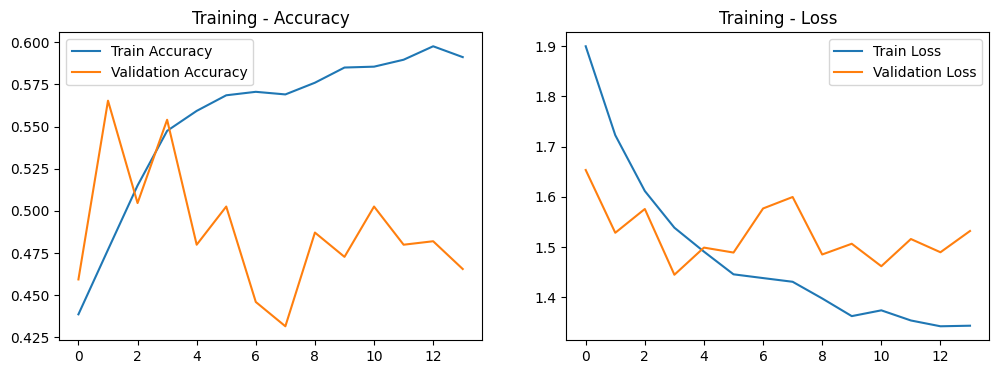

31/31 ━━━━━━━━━━━━━━━━━━━━ 4s 110ms/step - accuracy: 0.5590 - loss: 1.4297
Validation Accuracy: 55.41%


In [23]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt

# Load and preprocess the data
data_dir = 'data'

# Load dataset
data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),  # Use a smaller size to start with
    batch_size=32,
    seed=42,
    validation_split=0.2,
    subset='training'
)
val_data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),
    batch_size=32,
    seed=42,
    validation_split=0.2,
    subset='validation'
)

# Get the number of classes
num_classes = len(data.class_names)

# Normalize the images
data = data.map(lambda x, y: (x / 255.0, tf.one_hot(y, num_classes)))
val_data = val_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, num_classes)))

# Data augmentation
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.3),
    tf.keras.layers.RandomZoom(0.3),
    tf.keras.layers.RandomTranslation(0.3, 0.3),
    tf.keras.layers.RandomContrast(0.2)
])

# Build a simpler CNN model
model = Sequential([
    data_augmentation,
    Conv2D(32, (3, 3), activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(num_classes, activation='softmax')
])

# Compile the model
optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Implement Early Stopping and ReduceLROnPlateau
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)

# Train the model
history = model.fit(data, validation_data=val_data, epochs=50, callbacks=[early_stopping, reduce_lr])

# Plot the training history
def plot_history(history, title):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(history.history['accuracy'], label='Train Accuracy')
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy')
    ax1.legend()
    ax1.set_title(f'{title} - Accuracy')

    ax2.plot(history.history['loss'], label='Train Loss')
    ax2.plot(history.history['val_loss'], label='Validation Loss')
    ax2.legend()
    ax2.set_title(f'{title} - Loss')

    plt.show()

plot_history(history, 'Training')

# Evaluate the model
val_loss, val_accuracy = model.evaluate(val_data)
print(f'Validation Accuracy: {val_accuracy * 100:.2f}%')


Found 4856 files belonging to 14 classes.
Using 3885 files for training.
Found 4856 files belonging to 14 classes.
Using 971 files for validation.
Epoch 1/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 23s 171ms/step - accuracy: 0.4664 - loss: 1.8472 - val_accuracy: 0.6807 - val_loss: 1.0214 - learning_rate: 1.0000e-04
Epoch 2/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - accuracy: 0.6357 - loss: 1.1208 - val_accuracy: 0.7250 - val_loss: 0.8461 - learning_rate: 1.0000e-04
Epoch 3/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 21s 172ms/step - accuracy: 0.6846 - loss: 0.9337 - val_accuracy: 0.7497 - val_loss: 0.7758 - learning_rate: 1.0000e-04
Epoch 4/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 23s 182ms/step - accuracy: 0.7206 - loss: 0.8260 - val_accuracy: 0.7539 - val_loss: 0.7173 - learning_rate: 1.0000e-04
Epoch 5/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - accuracy: 0.7475 - loss: 0.7473 - val_accuracy: 0.7703 - val_loss: 0.6749 - learning_rate: 1.0000e-04
Epoch 6/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - a

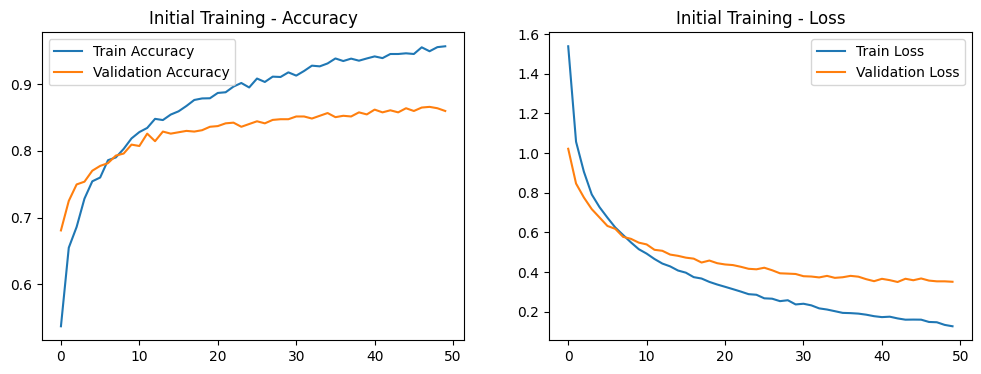

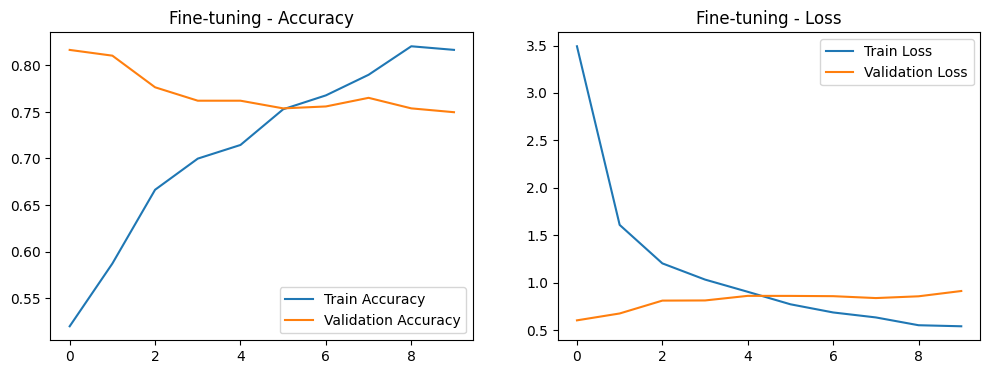

31/31 ━━━━━━━━━━━━━━━━━━━━ 5s 137ms/step - accuracy: 0.8229 - loss: 0.6211
Validation Accuracy: 81.67%


In [24]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout, GlobalAveragePooling2D
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt

# Load and preprocess the data
data_dir = 'data'

# Load dataset
data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),  # MobileNetV2 expects images of at least 160x160
    batch_size=32,
    seed=42,
    validation_split=0.2,
    subset='training'
)
val_data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),
    batch_size=32,
    seed=42,
    validation_split=0.2,
    subset='validation'
)

# Get the number of classes
num_classes = len(data.class_names)

# Normalize the images
data = data.map(lambda x, y: (x / 255.0, tf.one_hot(y, num_classes)))
val_data = val_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, num_classes)))

# Load pre-trained MobileNetV2 model + higher level layers
weights_path = 'mobilenet_v2_weights_tf_dim_ordering_tf_kernels_1.0_160_no_top.h5'
base_model = MobileNetV2(input_shape=(160, 160, 3), include_top=False, weights=None)
base_model.load_weights(weights_path)
base_model.trainable = False  # Freeze the base model

# Build the model
model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Implement Early Stopping and ReduceLROnPlateau
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)

# Train the model
history = model.fit(data, validation_data=val_data, epochs=50, callbacks=[early_stopping, reduce_lr])

# Unfreeze some layers in the base model for fine-tuning
base_model.trainable = True
fine_tune_at = 100  # Fine-tune from this layer onwards

for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])

# Continue training the model
history_fine = model.fit(data, validation_data=val_data, epochs=50, callbacks=[early_stopping, reduce_lr])

# Plot the training history
def plot_history(history, title):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(history.history['accuracy'], label='Train Accuracy')
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy')
    ax1.legend()
    ax1.set_title(f'{title} - Accuracy')

    ax2.plot(history.history['loss'], label='Train Loss')
    ax2.plot(history.history['val_loss'], label='Validation Loss')
    ax2.legend()
    ax2.set_title(f'{title} - Loss')

    plt.show()

plot_history(history, 'Initial Training')
plot_history(history_fine, 'Fine-tuning')

# Evaluate the model
val_loss, val_accuracy = model.evaluate(val_data)
print(f'Validation Accuracy: {val_accuracy * 100:.2f}%')


Found 4856 files belonging to 14 classes.
Using 3400 files for training.
Found 4856 files belonging to 14 classes.
Using 1456 files for validation.
Epoch 1/50
107/107 ━━━━━━━━━━━━━━━━━━━━ 24s 208ms/step - accuracy: 0.3798 - loss: 2.1241 - val_accuracy: 0.6542 - val_loss: 1.0758 - learning_rate: 1.0000e-04
Epoch 2/50
107/107 ━━━━━━━━━━━━━━━━━━━━ 23s 215ms/step - accuracy: 0.6174 - loss: 1.1906 - val_accuracy: 0.7014 - val_loss: 0.9134 - learning_rate: 1.0000e-04
Epoch 3/50
107/107 ━━━━━━━━━━━━━━━━━━━━ 23s 215ms/step - accuracy: 0.6603 - loss: 0.9919 - val_accuracy: 0.7111 - val_loss: 0.8516 - learning_rate: 1.0000e-04
Epoch 4/50
107/107 ━━━━━━━━━━━━━━━━━━━━ 23s 208ms/step - accuracy: 0.7109 - loss: 0.8942 - val_accuracy: 0.7389 - val_loss: 0.7613 - learning_rate: 1.0000e-04
Epoch 5/50
107/107 ━━━━━━━━━━━━━━━━━━━━ 22s 200ms/step - accuracy: 0.7288 - loss: 0.8089 - val_accuracy: 0.7514 - val_loss: 0.7339 - learning_rate: 1.0000e-04
Epoch 6/50
107/107 ━━━━━━━━━━━━━━━━━━━━ 23s 207ms/step - 

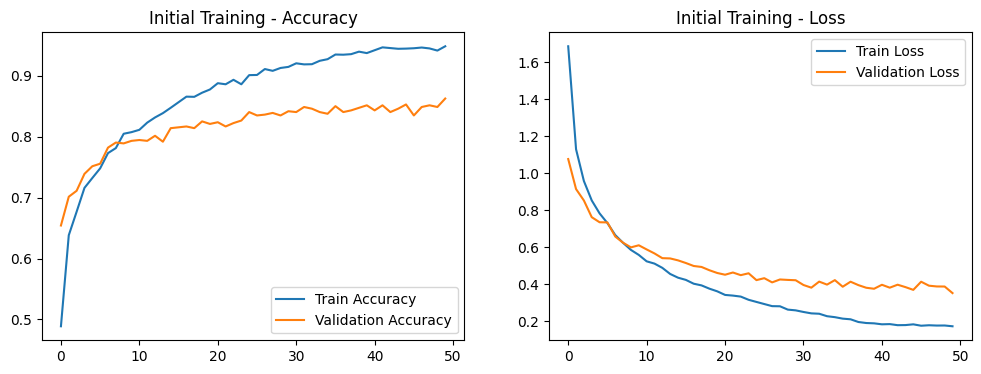

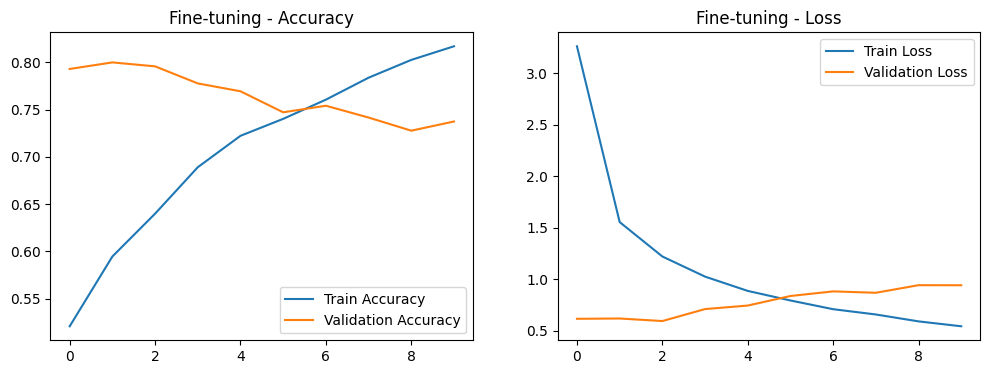

23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 127ms/step - accuracy: 0.8187 - loss: 0.5497
Validation Accuracy: 80.56%
23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - accuracy: 0.8273 - loss: 0.6202
Test Accuracy: 79.48%


ModuleNotFoundError: No module named 'sklearn'

In [25]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt
import numpy as np

# Load and preprocess the data
data_dir = 'data'

# Load dataset with a validation split
data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),
    batch_size=32,
    seed=42,
    validation_split=0.3,
    subset='training'
)

val_test_data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),
    batch_size=32,
    seed=42,
    validation_split=0.3,
    subset='validation'
)

# Split the val_test_data into validation and test sets
val_batches = tf.data.experimental.cardinality(val_test_data)
test_size = val_batches // 2
val_data = val_test_data.skip(test_size)
test_data = val_test_data.take(test_size)

# Get the number of classes
num_classes = len(data.class_names)

# Normalize the images
data = data.map(lambda x, y: (x / 255.0, tf.one_hot(y, num_classes)))
val_data = val_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, num_classes)))
test_data = test_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, num_classes)))

# Load pre-trained MobileNetV2 model + higher level layers
weights_path = 'mobilenet_v2_weights_tf_dim_ordering_tf_kernels_1.0_160_no_top.h5'
base_model = MobileNetV2(input_shape=(160, 160, 3), include_top=False, weights=None)
base_model.load_weights(weights_path)
base_model.trainable = False  # Freeze the base model

# Build the model
model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Implement Early Stopping and ReduceLROnPlateau
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)

# Train the model
history = model.fit(data, validation_data=val_data, epochs=50, callbacks=[early_stopping, reduce_lr])

# Unfreeze some layers in the base model for fine-tuning
base_model.trainable = True
fine_tune_at = 100  # Fine-tune from this layer onwards

for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])

# Continue training the model
history_fine = model.fit(data, validation_data=val_data, epochs=50, callbacks=[early_stopping, reduce_lr])

# Plot the training history
def plot_history(history, title):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(history.history['accuracy'], label='Train Accuracy')
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy')
    ax1.legend()
    ax1.set_title(f'{title} - Accuracy')

    ax2.plot(history.history['loss'], label='Train Loss')
    ax2.plot(history.history['val_loss'], label='Validation Loss')
    ax2.legend()
    ax2.set_title(f'{title} - Loss')

    plt.show()

plot_history(history, 'Initial Training')
plot_history(history_fine, 'Fine-tuning')

# Evaluate the model on the validation set
val_loss, val_accuracy = model.evaluate(val_data)
print(f'Validation Accuracy: {val_accuracy * 100:.2f}%')

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_data)
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')

# Generate confusion matrix for the test set
import numpy as np
import itertools
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Get predictions
y_pred = np.concatenate([np.argmax(model.predict(x), axis=1) for x, y in test_data], axis=0)
y_true = np.concatenate([np.argmax(y.numpy(), axis=1) for x, y in test_data], axis=0)

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plot confusion matrix
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.figure(figsize=(10, 8))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

# Plot non-normalized confusion matrix
plot_confusion_matrix(cm, classes=data.class_names,
                      title='Confusion matrix, without normalization')
plt.show()

# Plot normalized confusion matrix
plot_confusion_matrix(cm, classes=data.class_names, normalize=True,
                      title='Normalized confusion matrix')
plt.show()


Found 4856 files belonging to 14 classes.
Using 3400 files for training.
Found 4856 files belonging to 14 classes.
Using 1456 files for validation.
Epoch 1/50
107/107 ━━━━━━━━━━━━━━━━━━━━ 33s 267ms/step - accuracy: 0.4276 - loss: 1.9769 - val_accuracy: 0.6431 - val_loss: 1.0605 - learning_rate: 1.0000e-04
Epoch 2/50
107/107 ━━━━━━━━━━━━━━━━━━━━ 19s 170ms/step - accuracy: 0.6279 - loss: 1.1693 - val_accuracy: 0.6986 - val_loss: 0.9019 - learning_rate: 1.0000e-04
Epoch 3/50
107/107 ━━━━━━━━━━━━━━━━━━━━ 19s 175ms/step - accuracy: 0.6675 - loss: 0.9784 - val_accuracy: 0.7222 - val_loss: 0.8356 - learning_rate: 1.0000e-04
Epoch 4/50
107/107 ━━━━━━━━━━━━━━━━━━━━ 19s 170ms/step - accuracy: 0.7196 - loss: 0.8799 - val_accuracy: 0.7431 - val_loss: 0.7524 - learning_rate: 1.0000e-04
Epoch 5/50
107/107 ━━━━━━━━━━━━━━━━━━━━ 19s 177ms/step - accuracy: 0.7423 - loss: 0.7843 - val_accuracy: 0.7583 - val_loss: 0.7270 - learning_rate: 1.0000e-04
Epoch 6/50
107/107 ━━━━━━━━━━━━━━━━━━━━ 19s 175ms/step - 

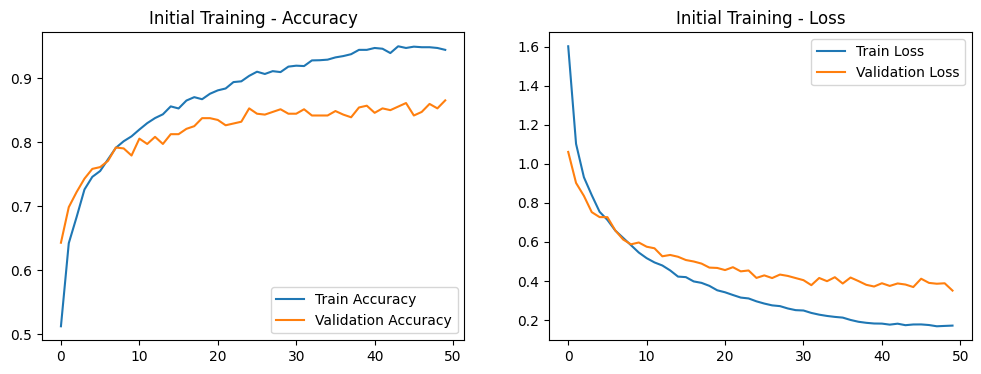

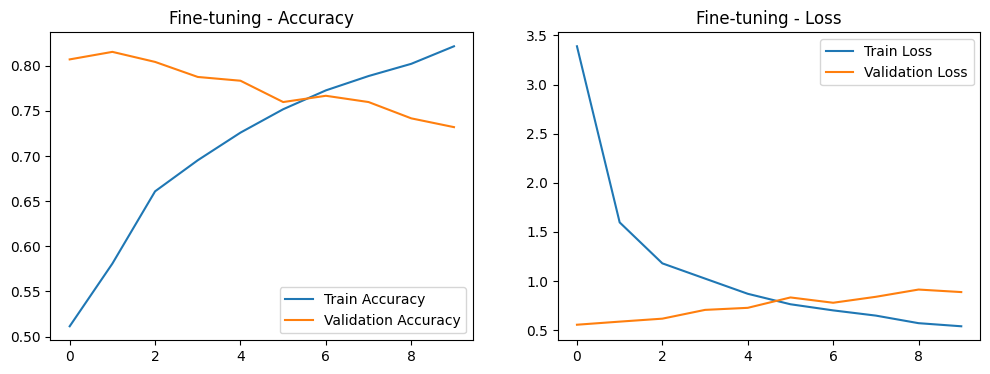

23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - accuracy: 0.8226 - loss: 0.5098
Validation Accuracy: 81.11%
23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 136ms/step - accuracy: 0.8217 - loss: 0.5948
Test Accuracy: 80.16%
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 662ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━

2024-05-25 10:40:47.045452: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2024-05-25 10:40:47.884265: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


AttributeError: '_MapDataset' object has no attribute 'class_names'

In [27]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt
import numpy as np
import itertools
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Load and preprocess the data
data_dir = 'data'

# Load dataset with a validation split
data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),
    batch_size=32,
    seed=42,
    validation_split=0.3,
    subset='training'
)

val_test_data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),
    batch_size=32,
    seed=42,
    validation_split=0.3,
    subset='validation'
)

# Split the val_test_data into validation and test sets
val_batches = tf.data.experimental.cardinality(val_test_data)
test_size = val_batches // 2
val_data = val_test_data.skip(test_size)
test_data = val_test_data.take(test_size)

# Get the number of classes
num_classes = len(data.class_names)

# Normalize the images
data = data.map(lambda x, y: (x / 255.0, tf.one_hot(y, num_classes)))
val_data = val_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, num_classes)))
test_data = test_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, num_classes)))

# Load pre-trained MobileNetV2 model + higher level layers
weights_path = 'mobilenet_v2_weights_tf_dim_ordering_tf_kernels_1.0_160_no_top.h5'
base_model = MobileNetV2(input_shape=(160, 160, 3), include_top=False, weights=None)
base_model.load_weights(weights_path)
base_model.trainable = False  # Freeze the base model

# Build the model
model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Implement Early Stopping and ReduceLROnPlateau
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)

# Train the model
history = model.fit(data, validation_data=val_data, epochs=50, callbacks=[early_stopping, reduce_lr])

# Unfreeze some layers in the base model for fine-tuning
base_model.trainable = True
fine_tune_at = 100  # Fine-tune from this layer onwards

for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])

# Continue training the model
history_fine = model.fit(data, validation_data=val_data, epochs=50, callbacks=[early_stopping, reduce_lr])

# Plot the training history
def plot_history(history, title):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(history.history['accuracy'], label='Train Accuracy')
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy')
    ax1.legend()
    ax1.set_title(f'{title} - Accuracy')

    ax2.plot(history.history['loss'], label='Train Loss')
    ax2.plot(history.history['val_loss'], label='Validation Loss')
    ax2.legend()
    ax2.set_title(f'{title} - Loss')

    plt.show()

plot_history(history, 'Initial Training')
plot_history(history_fine, 'Fine-tuning')

# Evaluate the model on the validation set
val_loss, val_accuracy = model.evaluate(val_data)
print(f'Validation Accuracy: {val_accuracy * 100:.2f}%')

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_data)
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')

# Generate confusion matrix for the test set
y_pred = np.concatenate([np.argmax(model.predict(x), axis=1) for x, y in test_data], axis=0)
y_true = np.concatenate([np.argmax(y.numpy(), axis=1) for x, y in test_data], axis=0)

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plot confusion matrix
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap=cmap, xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

# Plot non-normalized confusion matrix
plot_confusion_matrix(cm, classes=data.class_names,
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix(cm, classes=data.class_names, normalize=True,
                      title='Normalized confusion matrix')


Found 4856 files belonging to 14 classes.
Using 3400 files for training.
Found 4856 files belonging to 14 classes.
Using 1456 files for validation.
Epoch 1/5000
107/107 ━━━━━━━━━━━━━━━━━━━━ 31s 190ms/step - accuracy: 0.4261 - loss: 1.9572 - val_accuracy: 0.6514 - val_loss: 1.0849 - learning_rate: 1.0000e-04
Epoch 2/5000
107/107 ━━━━━━━━━━━━━━━━━━━━ 24s 221ms/step - accuracy: 0.6245 - loss: 1.1887 - val_accuracy: 0.7042 - val_loss: 0.9022 - learning_rate: 1.0000e-04
Epoch 3/5000
107/107 ━━━━━━━━━━━━━━━━━━━━ 22s 205ms/step - accuracy: 0.6566 - loss: 0.9834 - val_accuracy: 0.7264 - val_loss: 0.8273 - learning_rate: 1.0000e-04
Epoch 4/5000
107/107 ━━━━━━━━━━━━━━━━━━━━ 20s 179ms/step - accuracy: 0.7120 - loss: 0.8586 - val_accuracy: 0.7403 - val_loss: 0.7424 - learning_rate: 1.0000e-04
Epoch 5/5000
107/107 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - accuracy: 0.7414 - loss: 0.7864 - val_accuracy: 0.7528 - val_loss: 0.7149 - learning_rate: 1.0000e-04
Epoch 6/5000
107/107 ━━━━━━━━━━━━━━━━━━━━ 18s 1

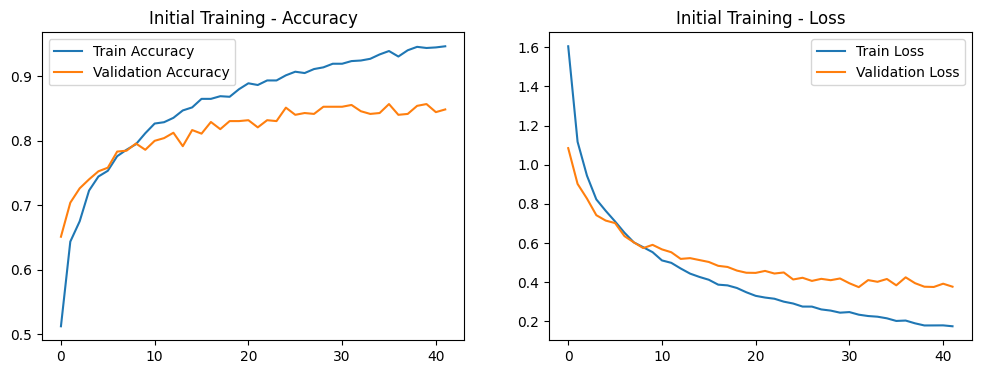

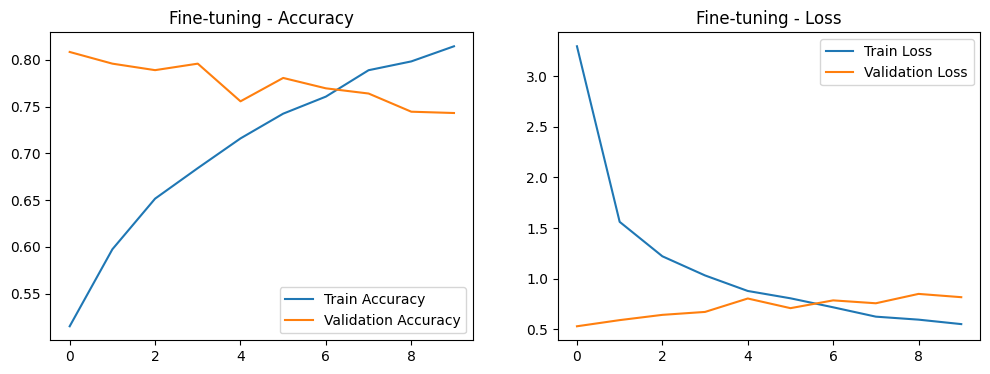

23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - accuracy: 0.8155 - loss: 0.4753
Validation Accuracy: 81.11%
23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 191ms/step - accuracy: 0.7919 - loss: 0.5820
Test Accuracy: 79.62%
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 652ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1

2024-05-26 00:40:43.326107: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


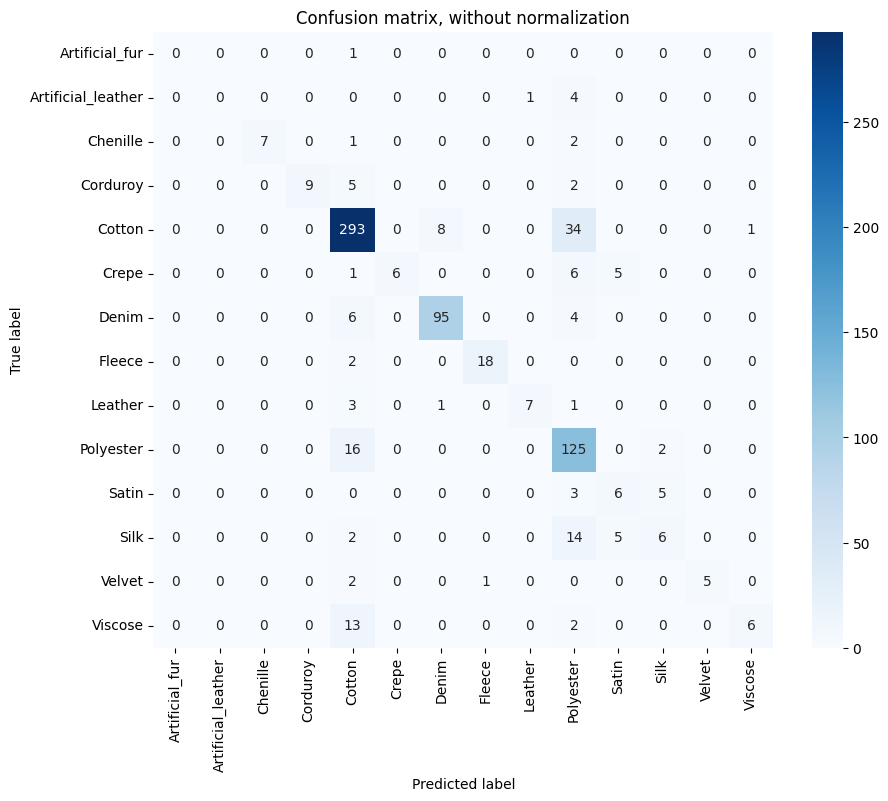

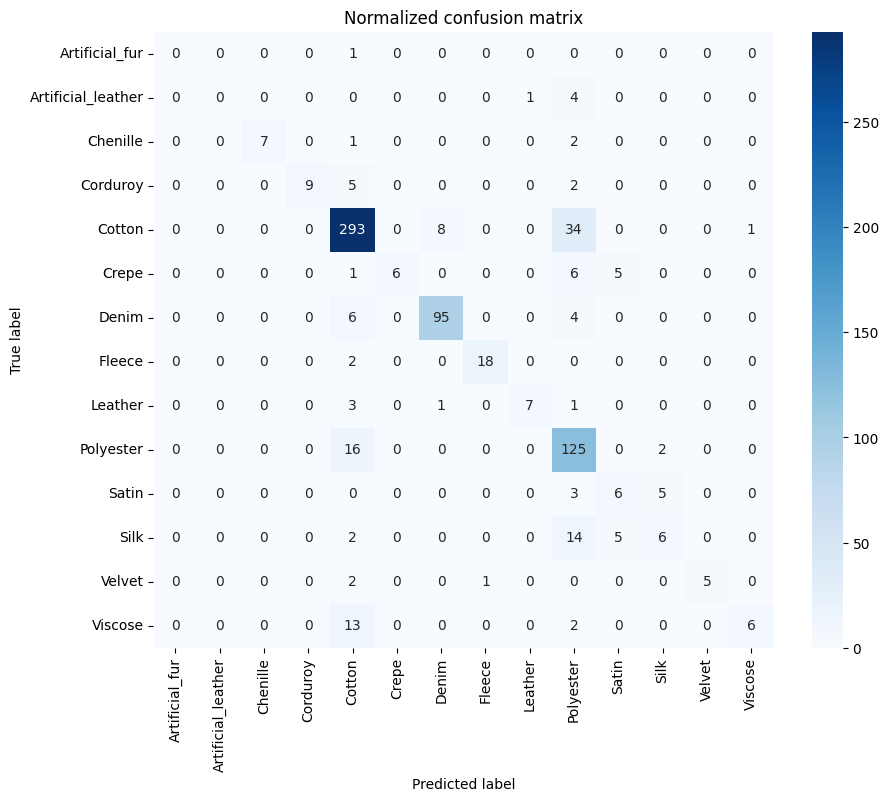

In [45]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Load and preprocess the data
data_dir = 'data'

# Load dataset with a validation split
data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),
    batch_size=32,
    seed=42,
    validation_split=0.3,
    subset='training'
)

val_test_data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),
    batch_size=32,
    seed=42,
    validation_split=0.3,
    subset='validation'
)

# Get the class names before mapping
class_names = data.class_names

# Split the val_test_data into validation and test sets
val_batches = tf.data.experimental.cardinality(val_test_data)
test_size = val_batches // 2
val_data = val_test_data.skip(test_size)
test_data = val_test_data.take(test_size)

# Normalize the images
data = data.map(lambda x, y: (x / 255.0, tf.one_hot(y, len(class_names))))
val_data = val_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, len(class_names))))
test_data = test_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, len(class_names))))

# Load pre-trained MobileNetV2 model + higher level layers
weights_path = 'mobilenet_v2_weights_tf_dim_ordering_tf_kernels_1.0_160_no_top.h5'
base_model = MobileNetV2(input_shape=(160, 160, 3), include_top=False, weights=None)
base_model.load_weights(weights_path)
base_model.trainable = False  # Freeze the base model

# Build the model
model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(len(class_names), activation='softmax')
])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Implement Early Stopping and ReduceLROnPlateau
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)

# Train the model
history = model.fit(data, validation_data=val_data, epochs=100, callbacks=[early_stopping, reduce_lr])

# Unfreeze some layers in the base model for fine-tuning
base_model.trainable = True
fine_tune_at = 100  # Fine-tune from this layer onwards

for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])

# Continue training the model
history_fine = model.fit(data, validation_data=val_data, epochs=100, callbacks=[early_stopping, reduce_lr])

# Plot the training history
def plot_history(history, title):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(history.history['accuracy'], label='Train Accuracy')
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy')
    ax1.legend()
    ax1.set_title(f'{title} - Accuracy')

    ax2.plot(history.history['loss'], label='Train Loss')
    ax2.plot(history.history['val_loss'], label='Validation Loss')
    ax2.legend()
    ax2.set_title(f'{title} - Loss')

    plt.show()

plot_history(history, 'Initial Training')
plot_history(history_fine, 'Fine-tuning')

# Evaluate the model on the validation set
val_loss, val_accuracy = model.evaluate(val_data)
print(f'Validation Accuracy: {val_accuracy * 100:.2f}%')

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_data)
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')

# Generate confusion matrix for the test set
test_data_unbatched = test_data.unbatch()
y_pred = []
y_true = []

for x, y in test_data_unbatched:
    x = tf.expand_dims(x, axis=0)
    pred = model.predict(x)
    y_pred.append(np.argmax(pred))
    y_true.append(np.argmax(y.numpy()))

y_pred = np.array(y_pred)
y_true = np.array(y_true)

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plot confusion matrix
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap=cmap, xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

# Plot non-normalized confusion matrix
plot_confusion_matrix(cm, classes=class_names,
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix(cm, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')


In [34]:
# Save the trained model to a file
model.save('fabric_classification_model.h5')

ValueError: Unable to create dataset (name already exists)

In [35]:
import os

# File path for the saved model
model_file_path = 'fabric_classification_model_v2.keras'  # Changed the file name to ensure it doesn't exist

# Check if the file already exists and remove it (optional, since we are using a new name)
if os.path.exists(model_file_path):
    os.remove(model_file_path)

# Save the trained model to a file using the recommended format
model.save(model_file_path)


Found 5740 files belonging to 22 classes.
Using 4018 files for training.
Found 5740 files belonging to 22 classes.
Using 1722 files for validation.
Epoch 1/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 30s 210ms/step - accuracy: 0.3364 - loss: 2.5310 - val_accuracy: 0.5594 - val_loss: 1.4249 - learning_rate: 1.0000e-04
Epoch 2/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 25s 193ms/step - accuracy: 0.5337 - loss: 1.5296 - val_accuracy: 0.6399 - val_loss: 1.1688 - learning_rate: 1.0000e-04
Epoch 3/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 24s 189ms/step - accuracy: 0.5905 - loss: 1.2944 - val_accuracy: 0.6783 - val_loss: 1.0439 - learning_rate: 1.0000e-04
Epoch 4/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 25s 196ms/step - accuracy: 0.6398 - loss: 1.1274 - val_accuracy: 0.6888 - val_loss: 0.9489 - learning_rate: 1.0000e-04
Epoch 5/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 26s 203ms/step - accuracy: 0.6731 - loss: 1.0196 - val_accuracy: 0.7121 - val_loss: 0.8812 - learning_rate: 1.0000e-04
Epoch 6/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 25s 193ms/s

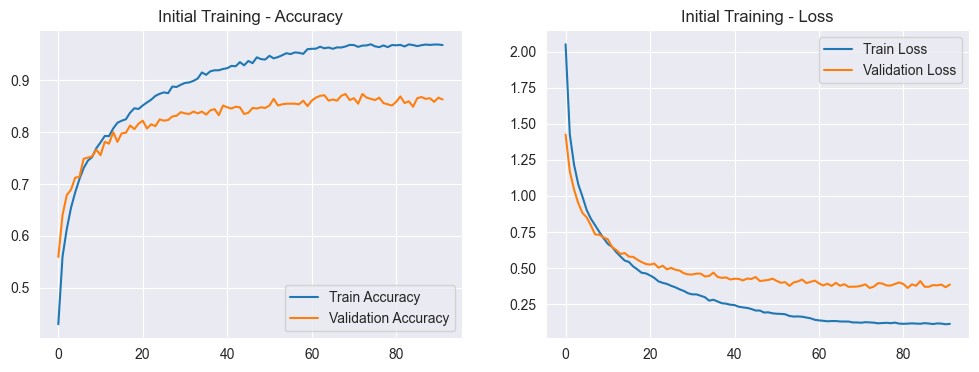

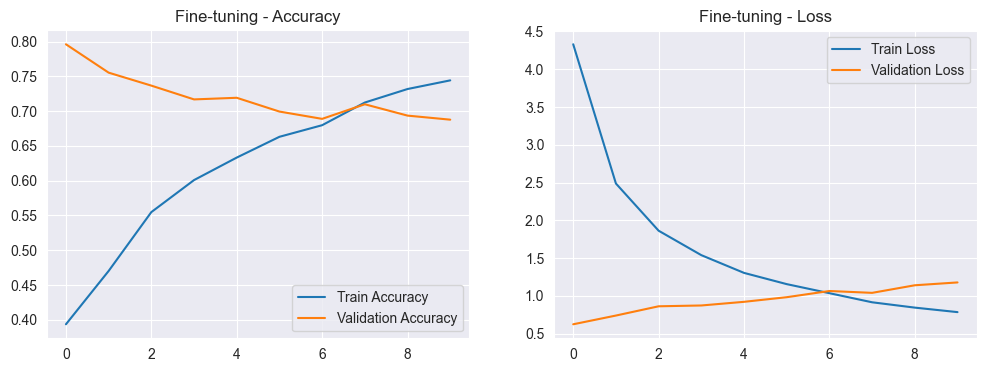

27/27 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - accuracy: 0.7984 - loss: 0.6100
Validation Accuracy: 78.90%
27/27 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - accuracy: 0.7931 - loss: 0.6808
Test Accuracy: 77.55%
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1

2024-05-30 17:34:37.099734: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


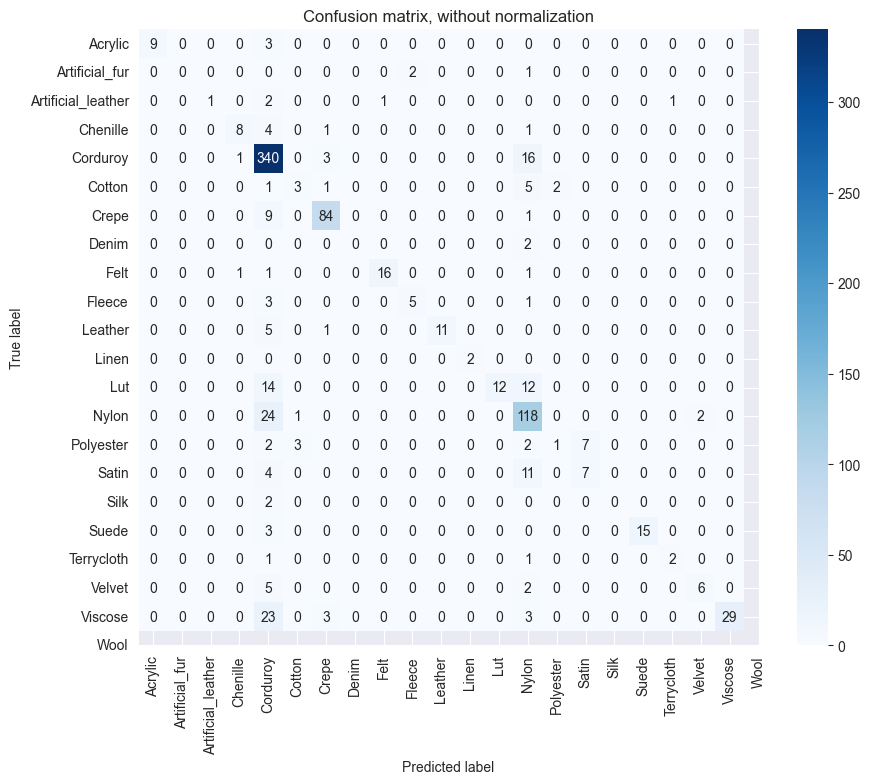

Normalized confusion matrix


ValueError: Unknown format code 'd' for object of type 'float'

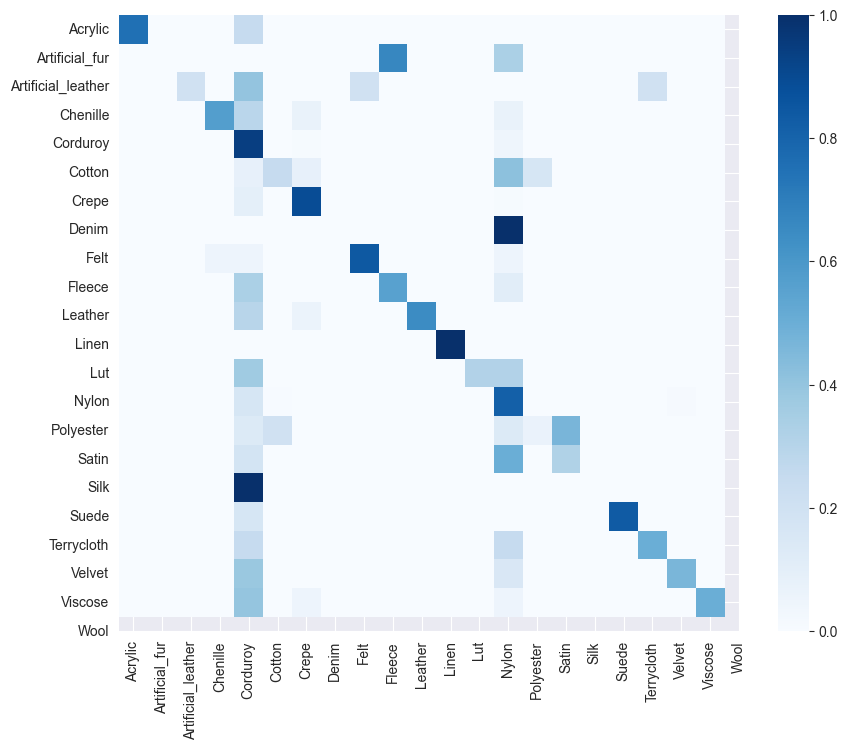

In [2]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Load and preprocess the data
data_dir = 'data'

# Load dataset with a validation split = 30%
data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),
    batch_size=32,
    seed=42,
    validation_split=0.3,
    subset='training'
)

val_test_data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),
    batch_size=32,
    seed=42,
    validation_split=0.3,
    subset='validation'
)

# Get the class names before mapping
class_names = data.class_names

# Split the val_test_data into validation and test sets
val_batches = tf.data.experimental.cardinality(val_test_data)
test_size = val_batches // 2
val_data = val_test_data.skip(test_size)
test_data = val_test_data.take(test_size)

# Normalize the images
data = data.map(lambda x, y: (x / 255.0, tf.one_hot(y, len(class_names))))
val_data = val_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, len(class_names))))
test_data = test_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, len(class_names))))

# Load pre-trained MobileNetV2 model + higher level layers
weights_path = 'mobilenet_v2_weights_tf_dim_ordering_tf_kernels_1.0_160_no_top.h5'
base_model = MobileNetV2(input_shape=(160, 160, 3), include_top=False, weights=None)
base_model.load_weights(weights_path)
base_model.trainable = False  # Freeze the base model

# Build the model
model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(len(class_names), activation='softmax')
])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Implement Early Stopping and ReduceLROnPlateau
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)

# Train the model
history = model.fit(data, validation_data=val_data, epochs=100, callbacks=[early_stopping, reduce_lr])

# Unfreeze some layers in the base model for fine-tuning
base_model.trainable = True
fine_tune_at = 100  # Fine-tune from this layer onwards

for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])

# Continue training the model
history_fine = model.fit(data, validation_data=val_data, epochs=100, callbacks=[early_stopping, reduce_lr])

# Plot the training history
def plot_history(history, title):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(history.history['accuracy'], label='Train Accuracy')
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy')
    ax1.legend()
    ax1.set_title(f'{title} - Accuracy')

    ax2.plot(history.history['loss'], label='Train Loss')
    ax2.plot(history.history['val_loss'], label='Validation Loss')
    ax2.legend()
    ax2.set_title(f'{title} - Loss')

    plt.show()

plot_history(history, 'Initial Training')
plot_history(history_fine, 'Fine-tuning')

# Evaluate the model on the validation set
val_loss, val_accuracy = model.evaluate(val_data)
print(f'Validation Accuracy: {val_accuracy * 100:.2f}%')

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_data)
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')

# Generate confusion matrix for the test set
test_data_unbatched = test_data.unbatch()
y_pred = []
y_true = []

for x, y in test_data_unbatched:
    x = tf.expand_dims(x, axis=0)
    pred = model.predict(x)
    y_pred.append(np.argmax(pred))
    y_true.append(np.argmax(y.numpy()))

y_pred = np.array(y_pred)
y_true = np.array(y_true)

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
  
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print("Confusion matrix, without normalization")
        
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap=cmap, xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

# Plot non-normalized confusion matrix
plot_confusion_matrix(cm, classes=class_names, 
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix(cm, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')


In [3]:
import os

# File path for the saved model
model_file_path = 'fabric_classification_model_v3.keras'  # Changed the file name to ensure it doesn't exist

# Check if the file already exists and remove it (optional, since we are using a new name)
if os.path.exists(model_file_path):
    os.remove(model_file_path)

# Save the trained model to a file using the recommended format
model.save(model_file_path)


Found 5740 files belonging to 22 classes.
Using 4018 files for training.
Found 5740 files belonging to 22 classes.
Using 1722 files for validation.
Epoch 1/90
126/126 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - accuracy: 0.3422 - loss: 2.4527 - val_accuracy: 0.5606 - val_loss: 1.4448 - learning_rate: 1.0000e-04
Epoch 2/90
126/126 ━━━━━━━━━━━━━━━━━━━━ 32s 250ms/step - accuracy: 0.5503 - loss: 1.5308 - val_accuracy: 0.6410 - val_loss: 1.1793 - learning_rate: 1.0000e-04
Epoch 3/90
126/126 ━━━━━━━━━━━━━━━━━━━━ 25s 198ms/step - accuracy: 0.6038 - loss: 1.2571 - val_accuracy: 0.6678 - val_loss: 1.0556 - learning_rate: 1.0000e-04
Epoch 4/90
126/126 ━━━━━━━━━━━━━━━━━━━━ 36s 280ms/step - accuracy: 0.6396 - loss: 1.1231 - val_accuracy: 0.6748 - val_loss: 0.9673 - learning_rate: 1.0000e-04
Epoch 5/90
126/126 ━━━━━━━━━━━━━━━━━━━━ 32s 246ms/step - accuracy: 0.6787 - loss: 0.9977 - val_accuracy: 0.7028 - val_loss: 0.8849 - learning_rate: 1.0000e-04
Epoch 6/90
126/126 ━━━━━━━━━━━━━━━━━━━━ 33s 260ms/step - 

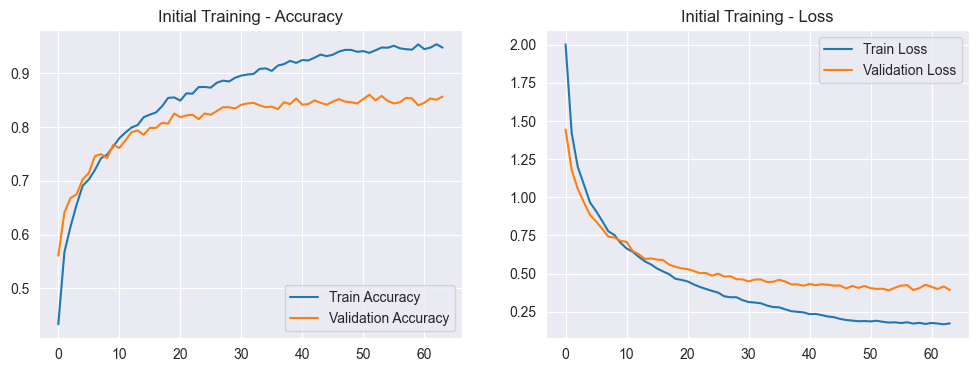

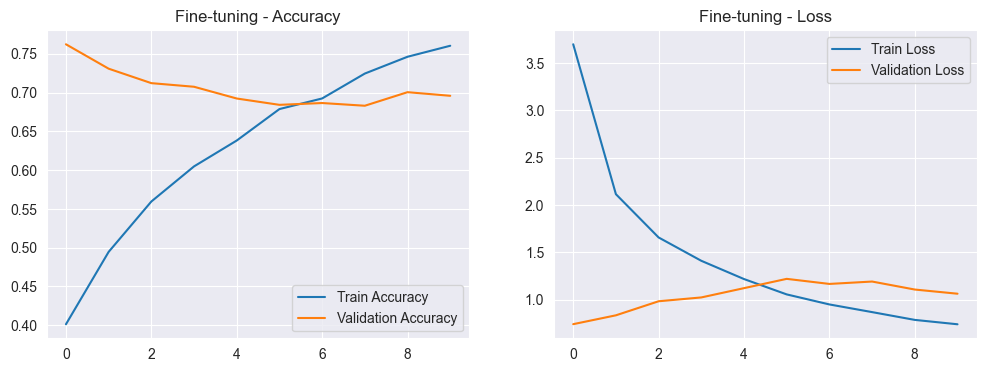

27/27 ━━━━━━━━━━━━━━━━━━━━ 6s 172ms/step - accuracy: 0.7615 - loss: 0.7114
Validation Accuracy: 76.92%
27/27 ━━━━━━━━━━━━━━━━━━━━ 5s 179ms/step - accuracy: 0.7634 - loss: 0.7045
Test Accuracy: 76.16%
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 612ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1

2024-05-30 18:24:53.698418: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


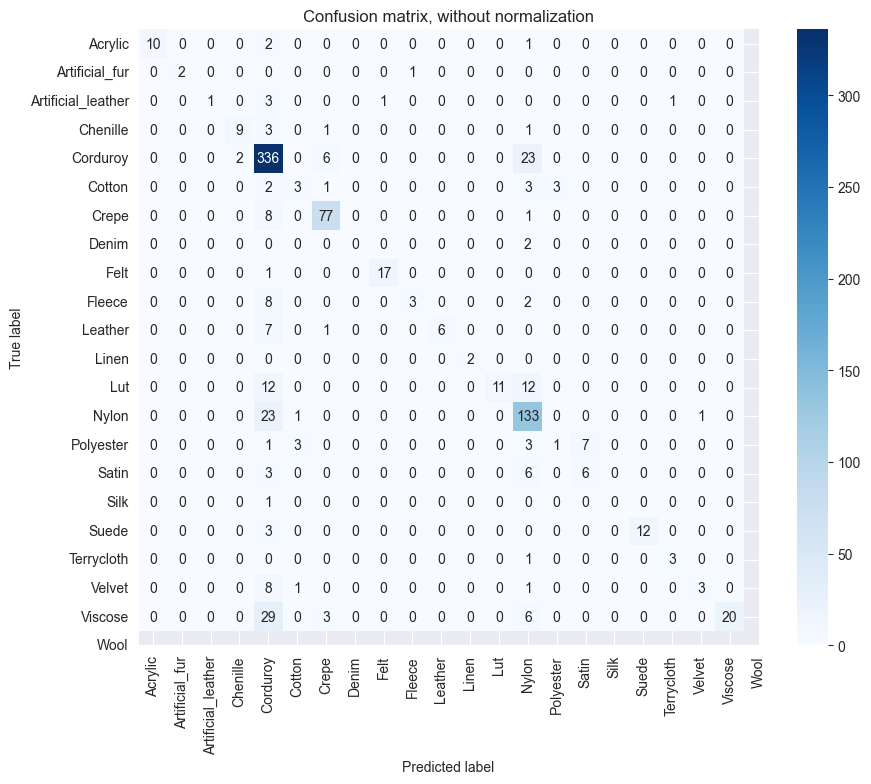

Normalized confusion matrix


ValueError: Unknown format code 'd' for object of type 'float'

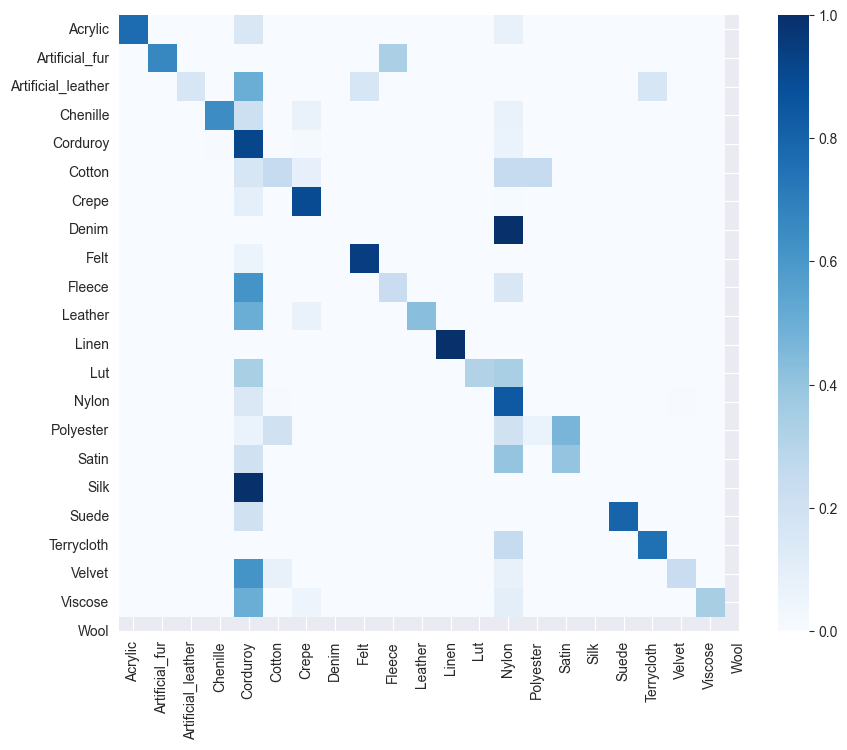

In [4]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Load and preprocess the data
data_dir = 'data'

# Load dataset with a validation split = 30%
data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),
    batch_size=32,
    seed=42,
    validation_split=0.3,
    subset='training'
)

val_test_data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),
    batch_size=32,
    seed=42,
    validation_split=0.3,
    subset='validation'
)

# Get the class names before mapping
class_names = data.class_names

# Split the val_test_data into validation and test sets
val_batches = tf.data.experimental.cardinality(val_test_data)
test_size = val_batches // 2
val_data = val_test_data.skip(test_size)
test_data = val_test_data.take(test_size)

# Normalize the images
data = data.map(lambda x, y: (x / 255.0, tf.one_hot(y, len(class_names))))
val_data = val_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, len(class_names))))
test_data = test_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, len(class_names))))

# Load pre-trained MobileNetV2 model + higher level layers
weights_path = 'mobilenet_v2_weights_tf_dim_ordering_tf_kernels_1.0_160_no_top.h5'
base_model = MobileNetV2(input_shape=(160, 160, 3), include_top=False, weights=None)
base_model.load_weights(weights_path)
base_model.trainable = False  # Freeze the base model

# Build the model
model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(len(class_names), activation='softmax')
])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Implement Early Stopping and ReduceLROnPlateau
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)

# Train the model
history = model.fit(data, validation_data=val_data, epochs=90, callbacks=[early_stopping, reduce_lr])

# Unfreeze some layers in the base model for fine-tuning
base_model.trainable = True
fine_tune_at = 100  # Fine-tune from this layer onwards

for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])

# Continue training the model
history_fine = model.fit(data, validation_data=val_data, epochs=90, callbacks=[early_stopping, reduce_lr])

# Plot the training history
def plot_history(history, title):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(history.history['accuracy'], label='Train Accuracy')
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy')
    ax1.legend()
    ax1.set_title(f'{title} - Accuracy')

    ax2.plot(history.history['loss'], label='Train Loss')
    ax2.plot(history.history['val_loss'], label='Validation Loss')
    ax2.legend()
    ax2.set_title(f'{title} - Loss')

    plt.show()

plot_history(history, 'Initial Training')
plot_history(history_fine, 'Fine-tuning')

# Evaluate the model on the validation set
val_loss, val_accuracy = model.evaluate(val_data)
print(f'Validation Accuracy: {val_accuracy * 100:.2f}%')

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_data)
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')

# Generate confusion matrix for the test set
test_data_unbatched = test_data.unbatch()
y_pred = []
y_true = []

for x, y in test_data_unbatched:
    x = tf.expand_dims(x, axis=0)
    pred = model.predict(x)
    y_pred.append(np.argmax(pred))
    y_true.append(np.argmax(y.numpy()))

y_pred = np.array(y_pred)
y_true = np.array(y_true)

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
  
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print("Confusion matrix, without normalization")
        
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap=cmap, xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

# Plot non-normalized confusion matrix
plot_confusion_matrix(cm, classes=class_names, 
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix(cm, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')


Found 5740 files belonging to 22 classes.
Using 4018 files for training.
Found 5740 files belonging to 22 classes.
Using 1722 files for validation.
Epoch 1/90
126/126 ━━━━━━━━━━━━━━━━━━━━ 33s 238ms/step - accuracy: 0.3247 - loss: 2.5846 - val_accuracy: 0.5602 - val_loss: 1.4005 - learning_rate: 1.0000e-04
Epoch 2/90
126/126 ━━━━━━━━━━━━━━━━━━━━ 33s 258ms/step - accuracy: 0.5331 - loss: 1.5245 - val_accuracy: 0.6204 - val_loss: 1.1652 - learning_rate: 1.0000e-04
Epoch 3/90
126/126 ━━━━━━━━━━━━━━━━━━━━ 28s 221ms/step - accuracy: 0.6068 - loss: 1.2467 - val_accuracy: 0.6789 - val_loss: 1.0253 - learning_rate: 1.0000e-04
Epoch 4/90
126/126 ━━━━━━━━━━━━━━━━━━━━ 35s 277ms/step - accuracy: 0.6420 - loss: 1.1146 - val_accuracy: 0.7059 - val_loss: 0.9080 - learning_rate: 1.0000e-04
Epoch 5/90
126/126 ━━━━━━━━━━━━━━━━━━━━ 34s 266ms/step - accuracy: 0.6717 - loss: 0.9993 - val_accuracy: 0.7068 - val_loss: 0.8661 - learning_rate: 1.0000e-04
Epoch 6/90
126/126 ━━━━━━━━━━━━━━━━━━━━ 35s 272ms/step - 

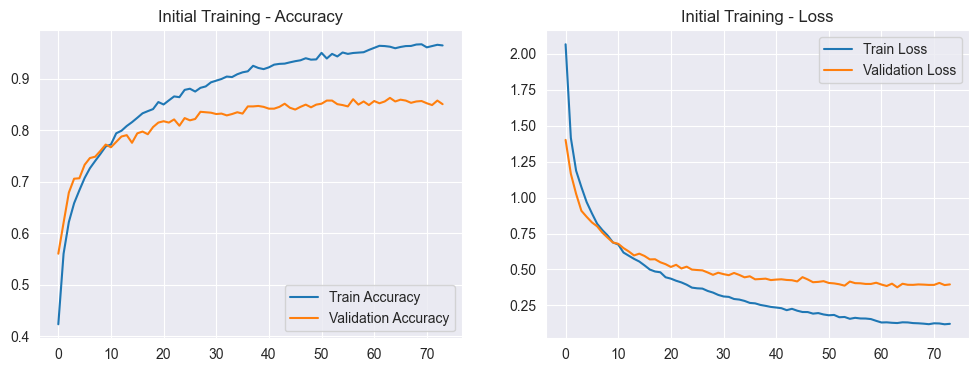

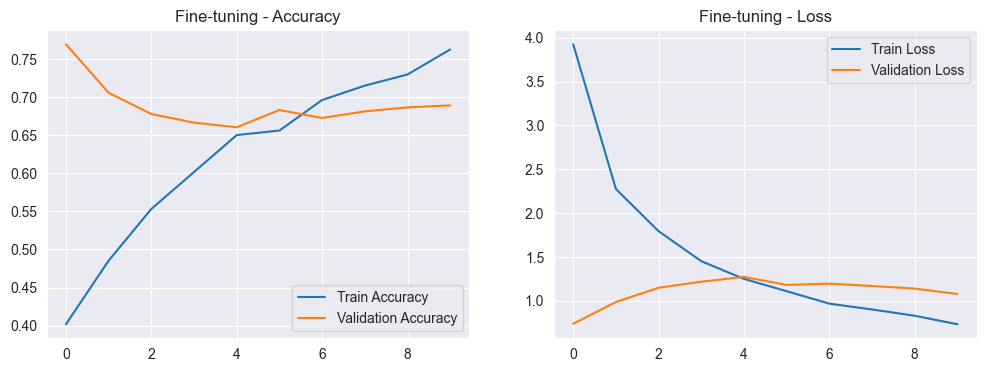

36/36 ━━━━━━━━━━━━━━━━━━━━ 8s 179ms/step - accuracy: 0.7551 - loss: 0.7989
Validation Accuracy: 76.53%
18/18 ━━━━━━━━━━━━━━━━━━━━ 5s 217ms/step - accuracy: 0.7713 - loss: 0.7880
Test Accuracy: 75.00%
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 

2024-06-03 11:38:01.211136: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


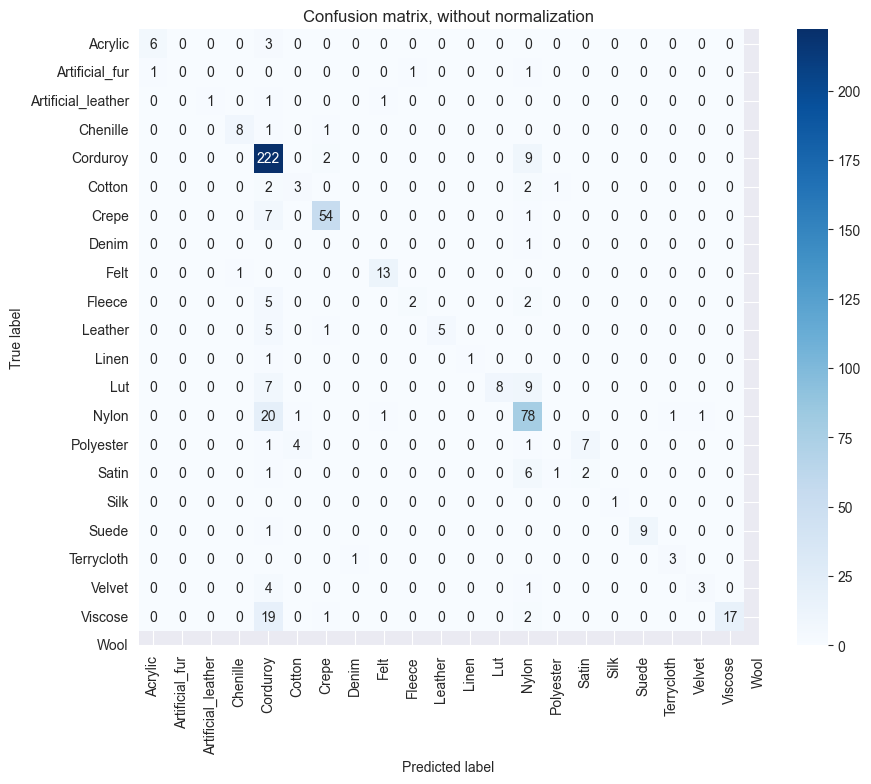

Normalized confusion matrix


ValueError: Unknown format code 'd' for object of type 'float'

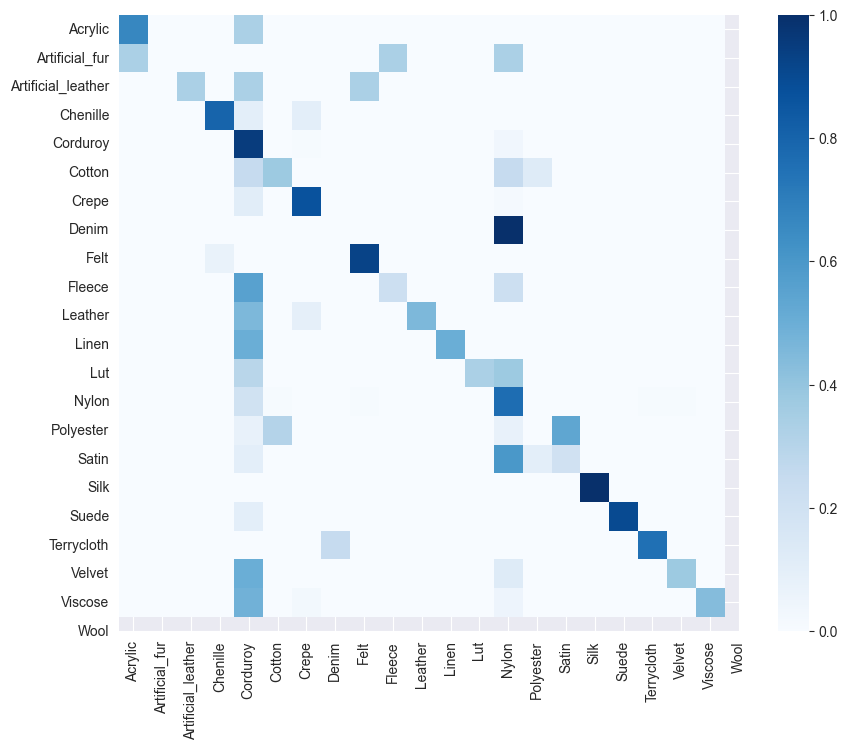

In [3]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Load and preprocess the data
data_dir = 'data'

# Load dataset with a validation split = 30%
data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),
    batch_size=32,
    seed=42,
    validation_split=0.3,
    subset='training'
)

val_test_data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),
    batch_size=32,
    seed=42,
    validation_split=0.3,
    subset='validation'
)

# Get the class names before mapping
class_names = data.class_names

# Split the val_test_data into validation and test sets
val_batches = tf.data.experimental.cardinality(val_test_data)
test_size = val_batches // 3
val_data = val_test_data.skip(test_size)
test_data = val_test_data.take(test_size)

# Normalize the images
data = data.map(lambda x, y: (x / 255.0, tf.one_hot(y, len(class_names))))
val_data = val_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, len(class_names))))
test_data = test_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, len(class_names))))

# Load pre-trained MobileNetV2 model + higher level layers
weights_path = 'mobilenet_v2_weights_tf_dim_ordering_tf_kernels_1.0_160_no_top.h5'
base_model = MobileNetV2(input_shape=(160, 160, 3), include_top=False, weights=None)
base_model.load_weights(weights_path)
base_model.trainable = False  # Freeze the base model

# Build the model
model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(len(class_names), activation='softmax')
])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Implement Early Stopping and ReduceLROnPlateau
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)

# Train the model
history = model.fit(data, validation_data=val_data, epochs=90, callbacks=[early_stopping, reduce_lr])

# Unfreeze some layers in the base model for fine-tuning
base_model.trainable = True
fine_tune_at = 100  # Fine-tune from this layer onwards

for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])

# Continue training the model
history_fine = model.fit(data, validation_data=val_data, epochs=90, callbacks=[early_stopping, reduce_lr])

# Plot the training history
def plot_history(history, title):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(history.history['accuracy'], label='Train Accuracy')
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy')
    ax1.legend()
    ax1.set_title(f'{title} - Accuracy')

    ax2.plot(history.history['loss'], label='Train Loss')
    ax2.plot(history.history['val_loss'], label='Validation Loss')
    ax2.legend()
    ax2.set_title(f'{title} - Loss')

    plt.show()

plot_history(history, 'Initial Training')
plot_history(history_fine, 'Fine-tuning')

# Evaluate the model on the validation set
val_loss, val_accuracy = model.evaluate(val_data)
print(f'Validation Accuracy: {val_accuracy * 100:.2f}%')

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_data)
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')

# Generate confusion matrix for the test set
test_data_unbatched = test_data.unbatch()
y_pred = []
y_true = []

for x, y in test_data_unbatched:
    x = tf.expand_dims(x, axis=0)
    pred = model.predict(x)
    y_pred.append(np.argmax(pred))
    y_true.append(np.argmax(y.numpy()))

y_pred = np.array(y_pred)
y_true = np.array(y_true)

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
  
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print("Confusion matrix, without normalization")
        
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap=cmap, xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

# Plot non-normalized confusion matrix
plot_confusion_matrix(cm, classes=class_names, 
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix(cm, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')


Found 5740 files belonging to 22 classes.
Using 4018 files for training.
Found 5740 files belonging to 22 classes.
Using 1722 files for validation.
Epoch 1/60
126/126 ━━━━━━━━━━━━━━━━━━━━ 38s 284ms/step - accuracy: 0.3498 - loss: 2.4845 - val_accuracy: 0.5506 - val_loss: 1.4399 - learning_rate: 1.0000e-04
Epoch 2/60
126/126 ━━━━━━━━━━━━━━━━━━━━ 40s 311ms/step - accuracy: 0.5343 - loss: 1.5332 - val_accuracy: 0.6309 - val_loss: 1.1935 - learning_rate: 1.0000e-04
Epoch 3/60
126/126 ━━━━━━━━━━━━━━━━━━━━ 45s 351ms/step - accuracy: 0.5936 - loss: 1.2793 - val_accuracy: 0.6614 - val_loss: 1.0474 - learning_rate: 1.0000e-04
Epoch 4/60
126/126 ━━━━━━━━━━━━━━━━━━━━ 39s 308ms/step - accuracy: 0.6451 - loss: 1.1035 - val_accuracy: 0.6981 - val_loss: 0.9296 - learning_rate: 1.0000e-04
Epoch 5/60
126/126 ━━━━━━━━━━━━━━━━━━━━ 35s 271ms/step - accuracy: 0.6645 - loss: 1.0247 - val_accuracy: 0.7059 - val_loss: 0.8919 - learning_rate: 1.0000e-04
Epoch 6/60
126/126 ━━━━━━━━━━━━━━━━━━━━ 33s 255ms/step - 

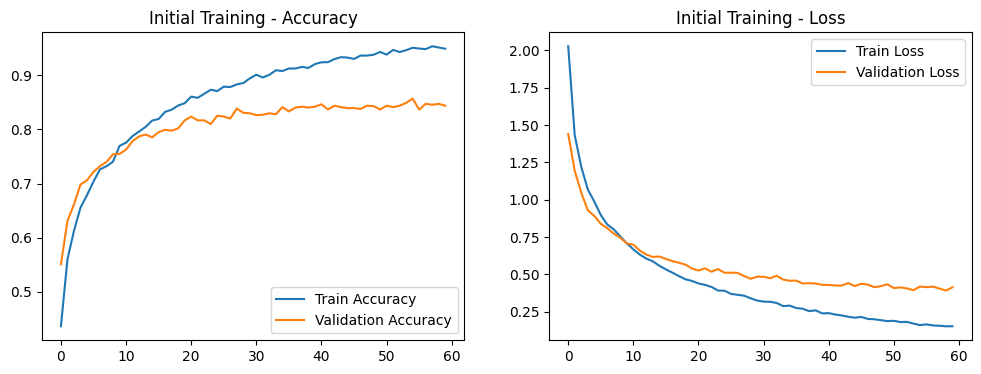

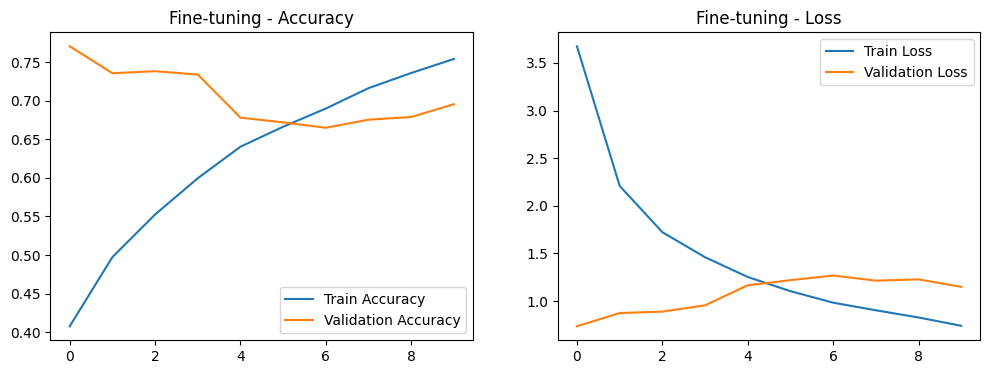

36/36 ━━━━━━━━━━━━━━━━━━━━ 8s 189ms/step - accuracy: 0.7669 - loss: 0.7642
Validation Accuracy: 76.44%
18/18 ━━━━━━━━━━━━━━━━━━━━ 4s 206ms/step - accuracy: 0.7795 - loss: 0.7245
Test Accuracy: 77.78%
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 733ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1

2024-06-03 14:41:57.700981: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


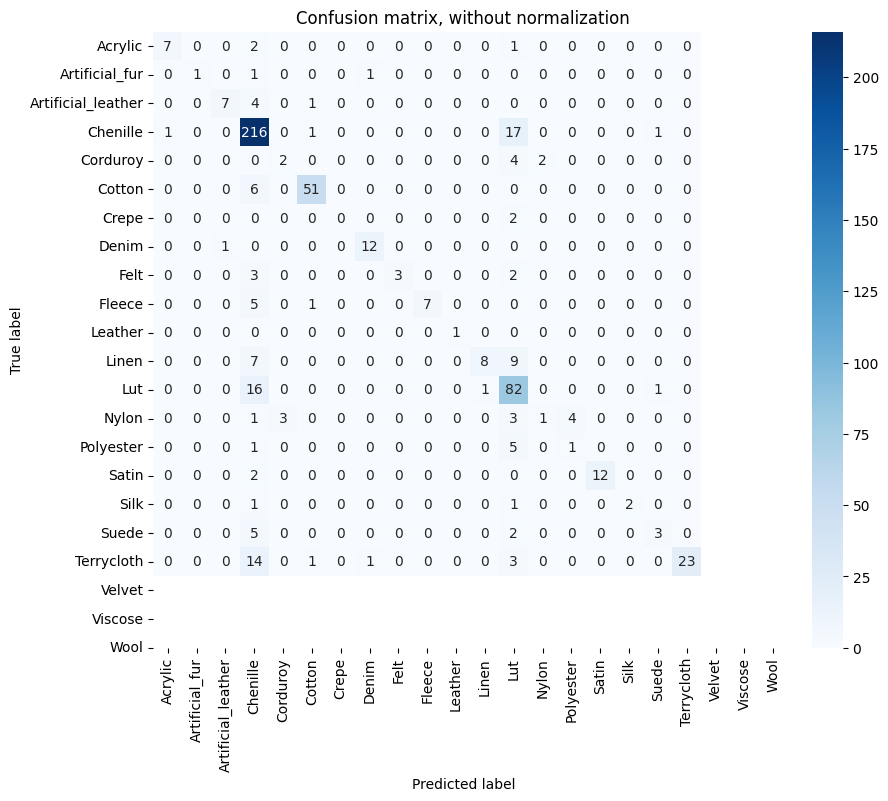

Normalized confusion matrix


ValueError: Unknown format code 'd' for object of type 'float'

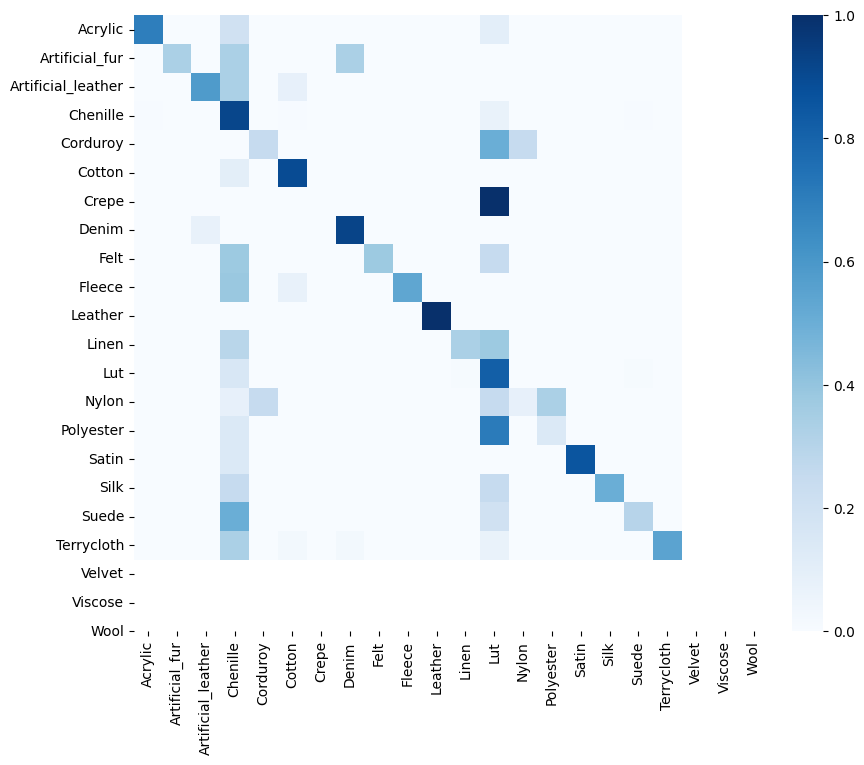

In [6]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Load and preprocess the data
data_dir = 'data'

# Load dataset with a validation split = 30%
data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),
    batch_size=32,
    seed=42,
    validation_split=0.3,
    subset='training'
)

val_test_data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),
    batch_size=32,
    seed=42,
    validation_split=0.3,
    subset='validation'
)

# Get the class names before mapping
class_names = data.class_names

# Split the val_test_data into validation and test sets
val_batches = tf.data.experimental.cardinality(val_test_data)
test_size = val_batches // 3
val_data = val_test_data.skip(test_size)
test_data = val_test_data.take(test_size)

# Normalize the images
data = data.map(lambda x, y: (x / 255.0, tf.one_hot(y, len(class_names))))
val_data = val_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, len(class_names))))
test_data = test_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, len(class_names))))

# Load pre-trained MobileNetV2 model + higher level layers
weights_path = 'mobilenet_v2_weights_tf_dim_ordering_tf_kernels_1.0_160_no_top.h5'
base_model = MobileNetV2(input_shape=(160, 160, 3), include_top=False, weights=None)
base_model.load_weights(weights_path)
base_model.trainable = False  # Freeze the base model

# Build the model
model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(len(class_names), activation='softmax')
])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Implement Early Stopping and ReduceLROnPlateau
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)

# Train the model
history = model.fit(data, validation_data=val_data, epochs=60, callbacks=[early_stopping, reduce_lr])

# Unfreeze some layers in the base model for fine-tuning
base_model.trainable = True
fine_tune_at = 100  # Fine-tune from this layer onwards

for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])


# Continue training the model
history_fine = model.fit(data, validation_data=val_data, epochs=30, callbacks=[early_stopping, reduce_lr])

# Plot the training history
def plot_history(history, title):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(history.history['accuracy'], label='Train Accuracy')
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy')
    ax1.legend()
    ax1.set_title(f'{title} - Accuracy')

    ax2.plot(history.history['loss'], label='Train Loss')
    ax2.plot(history.history['val_loss'], label='Validation Loss')
    ax2.legend()
    ax2.set_title(f'{title} - Loss')

    plt.show()

plot_history(history, 'Initial Training')
plot_history(history_fine, 'Fine-tuning')

# Evaluate the model on the validation set
val_loss, val_accuracy = model.evaluate(val_data)
print(f'Validation Accuracy: {val_accuracy * 100:.2f}%')

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_data)
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')

# Generate confusion matrix for the test set
test_data_unbatched = test_data.unbatch()
y_pred = []
y_true = []

for x, y in test_data_unbatched:
    x = tf.expand_dims(x, axis=0)
    pred = model.predict(x)
    y_pred.append(np.argmax(pred))
    y_true.append(np.argmax(y.numpy()))

y_pred = np.array(y_pred)
y_true = np.array(y_true)

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
  
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print("Confusion matrix, without normalization")
        
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap=cmap, xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

# Plot non-normalized confusion matrix
plot_confusion_matrix(cm, classes=class_names, 
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix(cm, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')


In [7]:
from sklearn.metrics import f1_score, mean_squared_error, log_loss

# Evaluate the model on the validation set
val_loss, val_accuracy = model.evaluate(val_data)
print(f'Validation Accuracy: {val_accuracy * 100:.2f}%')

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_data)
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')

# Generate confusion matrix and other metrics for the test set
test_data_unbatched = test_data.unbatch()
y_pred = []
y_true = []

for x, y in test_data_unbatched:
    x = tf.expand_dims(x, axis=0)
    pred = model.predict(x)
    y_pred.append(np.argmax(pred))
    y_true.append(np.argmax(y.numpy()))

y_pred = np.array(y_pred)
y_true = np.array(y_true)

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Compute F-score, log-loss, and mean squared error
f_score = f1_score(y_true, y_pred, average='weighted')
logloss = log_loss(y_true, tf.keras.utils.to_categorical(y_pred, num_classes=len(class_names)))
mse = mean_squared_error(y_true, y_pred)

print(f'F-score: {f_score:.2f}')
print(f'Log-loss: {logloss:.2f}')
print(f'Mean Squared Error: {mse:.2f}')

def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print("Confusion matrix, without normalization")
        
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap=cmap, xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

# Plot non-normalized confusion matrix
plot_confusion_matrix(cm, classes=class_names, title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix(cm, classes=class_names, normalize=True, title='Normalized confusion matrix')


36/36 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - accuracy: 0.7500 - loss: 0.8323
Validation Accuracy: 76.70%
18/18 ━━━━━━━━━━━━━━━━━━━━ 3s 148ms/step - accuracy: 0.7810 - loss: 0.6158
Test Accuracy: 76.74%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/

2024-06-03 15:09:58.643670: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


ValueError: y_true and y_pred contain different number of classes 21, 22. Please provide the true labels explicitly through the labels argument. Classes found in y_true: [ 0  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21]

In [8]:
from sklearn.metrics import f1_score, mean_squared_error, log_loss, confusion_matrix

# Evaluate the model on the validation set
val_loss, val_accuracy = model.evaluate(val_data)
print(f'Validation Accuracy: {val_accuracy * 100:.2f}%')

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_data)
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')

# Generate confusion matrix and other metrics for the test set
test_data_unbatched = test_data.unbatch()
y_pred = []
y_true = []

for x, y in test_data_unbatched:
    x = tf.expand_dims(x, axis=0)
    pred = model.predict(x)
    y_pred.append(np.argmax(pred))
    y_true.append(np.argmax(y.numpy()))

y_pred = np.array(y_pred)
y_true = np.array(y_true)

# Ensure the true and predicted labels contain the same number of classes
all_classes = np.arange(len(class_names))

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred, labels=all_classes)

# Compute F-score, log-loss, and mean squared error
f_score = f1_score(y_true, y_pred, average='weighted', labels=all_classes)
logloss = log_loss(y_true, tf.keras.utils.to_categorical(y_pred, num_classes=len(class_names)))
mse = mean_squared_error(y_true, y_pred)

print(f'F-score: {f_score:.2f}')
print(f'Log-loss: {logloss:.2f}')
print(f'Mean Squared Error: {mse:.2f}')

def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print("Confusion matrix, without normalization")
        
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap=cmap, xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

# Plot non-normalized confusion matrix
plot_confusion_matrix(cm, classes=class_names, title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix(cm, classes=class_names, normalize=True, title='Normalized confusion matrix')


36/36 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - accuracy: 0.7622 - loss: 0.8018
Validation Accuracy: 76.79%
18/18 ━━━━━━━━━━━━━━━━━━━━ 3s 168ms/step - accuracy: 0.7794 - loss: 0.7034
Test Accuracy: 76.56%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/

2024-06-03 15:12:45.060879: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
/Users/tabitalucaciu/UBB INFO ENGL/YEAR 3/SEM 2/Licenta/pythonProject1/.venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


ValueError: y_true and y_pred contain different number of classes 21, 22. Please provide the true labels explicitly through the labels argument. Classes found in y_true: [ 0  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21]

In [9]:
from sklearn.metrics import f1_score, mean_squared_error, log_loss, confusion_matrix

# Evaluate the model on the validation set
val_loss, val_accuracy = model.evaluate(val_data)
print(f'Validation Accuracy: {val_accuracy * 100:.2f}%')

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_data)
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')

# Generate confusion matrix and other metrics for the test set
test_data_unbatched = test_data.unbatch()
y_pred = []
y_true = []

for x, y in test_data_unbatched:
    x = tf.expand_dims(x, axis=0)
    pred = model.predict(x)
    y_pred.append(np.argmax(pred))
    y_true.append(np.argmax(y.numpy()))

y_pred = np.array(y_pred)
y_true = np.array(y_true)

# Ensure the true and predicted labels contain the same number of classes
all_classes = np.arange(len(class_names))

# Filter out classes that are not present in the predictions
present_classes = np.unique(np.concatenate((y_true, y_pred)))

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred, labels=present_classes)

# Compute F-score, log-loss, and mean squared error
f_score = f1_score(y_true, y_pred, average='weighted', zero_division=1)
logloss = log_loss(y_true, tf.keras.utils.to_categorical(y_pred, num_classes=len(class_names)))
mse = mean_squared_error(y_true, y_pred)

print(f'F-score: {f_score:.2f}')
print(f'Log-loss: {logloss:.2f}')
print(f'Mean Squared Error: {mse:.2f}')

def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print("Confusion matrix, without normalization")
        
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap=cmap, xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

# Plot non-normalized confusion matrix
plot_confusion_matrix(cm, classes=class_names, title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix(cm, classes=class_names, normalize=True, title='Normalized confusion matrix')


36/36 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - accuracy: 0.7418 - loss: 0.8683
Validation Accuracy: 76.00%
18/18 ━━━━━━━━━━━━━━━━━━━━ 4s 171ms/step - accuracy: 0.7740 - loss: 0.7039
Test Accuracy: 76.22%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/

2024-06-03 15:14:23.388252: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


ValueError: y_true and y_pred contain different number of classes 21, 22. Please provide the true labels explicitly through the labels argument. Classes found in y_true: [ 0  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21]

36/36 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - accuracy: 0.7696 - loss: 0.7656
Validation Accuracy: 76.79%
18/18 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - accuracy: 0.7884 - loss: 0.6852
Test Accuracy: 76.22%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/

2024-06-03 15:19:00.368138: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


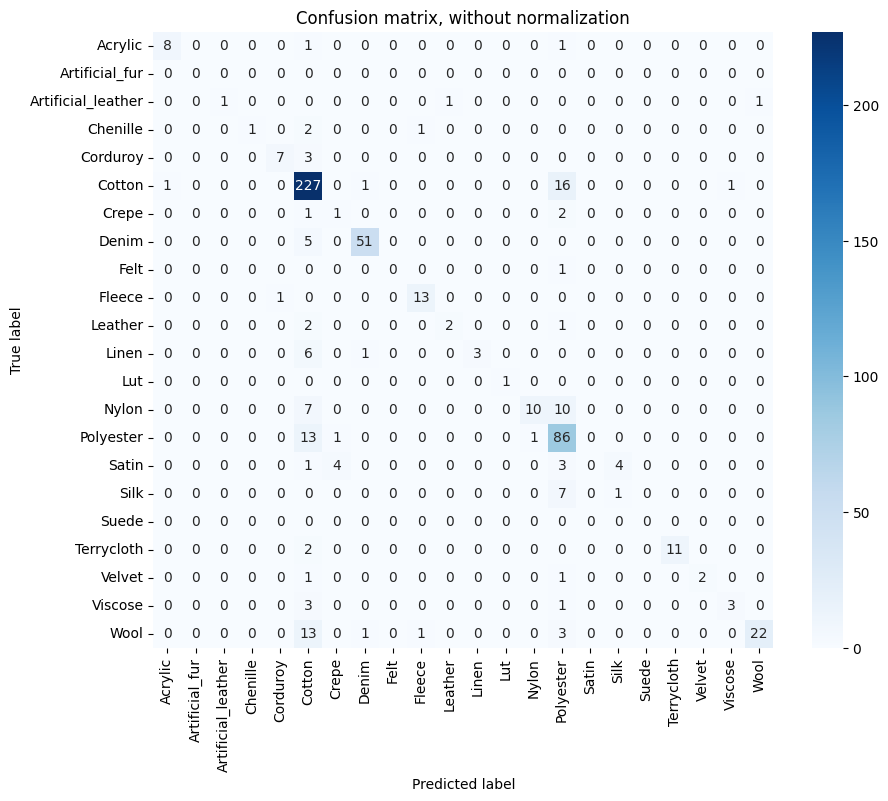

Normalized confusion matrix


/var/folders/x3/jh_7mg9d1sx0rl54wqhg5gr00000gn/T/ipykernel_24153/283306452.py:42: RuntimeWarning: invalid value encountered in divide
  cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


ValueError: Unknown format code 'd' for object of type 'float'

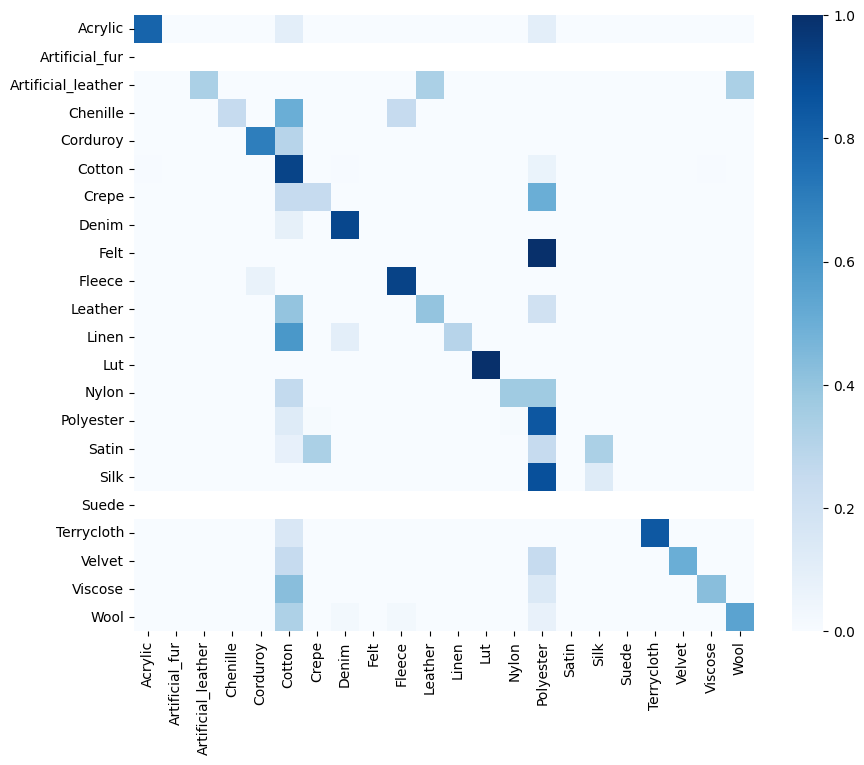

In [10]:
from sklearn.metrics import f1_score, mean_squared_error, log_loss, confusion_matrix

# Evaluate the model on the validation set
val_loss, val_accuracy = model.evaluate(val_data)
print(f'Validation Accuracy: {val_accuracy * 100:.2f}%')

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_data)
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')

# Generate confusion matrix and other metrics for the test set
test_data_unbatched = test_data.unbatch()
y_pred = []
y_true = []

for x, y in test_data_unbatched:
    x = tf.expand_dims(x, axis=0)
    pred = model.predict(x)
    y_pred.append(np.argmax(pred))
    y_true.append(np.argmax(y.numpy()))

y_pred = np.array(y_pred)
y_true = np.array(y_true)

# Ensure the true and predicted labels contain the same number of classes
all_classes = np.arange(len(class_names))

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred, labels=all_classes)

# Compute F-score, log-loss, and mean squared error
f_score = f1_score(y_true, y_pred, average='weighted', zero_division=1)
logloss = log_loss(tf.keras.utils.to_categorical(y_true, num_classes=len(class_names)), tf.keras.utils.to_categorical(y_pred, num_classes=len(class_names)))
mse = mean_squared_error(y_true, y_pred)

print(f'F-score: {f_score:.2f}')
print(f'Log-loss: {logloss:.2f}')
print(f'Mean Squared Error: {mse:.2f}')

def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print("Confusion matrix, without normalization")
        
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap=cmap, xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

# Plot non-normalized confusion matrix
plot_confusion_matrix(cm, classes=class_names, title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix(cm, classes=class_names, normalize=True, title='Normalized confusion matrix')


In [18]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix, f1_score, log_loss, mean_squared_error
import seaborn as sns

# Load and preprocess the data
data_dir = 'data'

# Load dataset with a validation split = 30%
data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),
    batch_size=32,
    seed=42,
    validation_split=0.3,
    subset='training'
)

val_test_data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),
    batch_size=32,
    seed=42,
    validation_split=0.3,
    subset='validation'
)

# Get the class names before mapping
class_names = data.class_names

# Split the val_test_data into validation and test sets
val_batches = tf.data.experimental.cardinality(val_test_data)
test_size = val_batches // 3
val_data = val_test_data.skip(test_size)
test_data = val_test_data.take(test_size)

# Normalize the images
data = data.map(lambda x, y: (x / 255.0, tf.one_hot(y, len(class_names))))
val_data = val_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, len(class_names))))
test_data = test_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, len(class_names))))

# Load pre-trained MobileNetV2 model + higher level layers
weights_path = 'mobilenet_v2_weights_tf_dim_ordering_tf_kernels_1.0_160_no_top.h5'
base_model = MobileNetV2(input_shape=(160, 160, 3), include_top=False, weights=None)
base_model.load_weights(weights_path)
base_model.trainable = False  # Freeze the base model

# Build the model
model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(len(class_names), activation='softmax')
])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Implement Early Stopping and ReduceLROnPlateau
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)

# Train the model
history = model.fit(data, validation_data=val_data, epochs=70, callbacks=[early_stopping, reduce_lr])

# Unfreeze some layers in the base model for fine-tuning
base_model.trainable = True
fine_tune_at = 100  # Fine-tune from this layer onwards

for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])

# Continue training the model
history_fine = model.fit(data, validation_data=val_data, epochs=30, callbacks=[early_stopping, reduce_lr])

# Plot the training history
def plot_history(history, title):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(history.history['accuracy'], label='Train Accuracy')
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy')
    ax1.legend()
    ax1.set_title(f'{title} - Accuracy')

    ax2.plot(history.history['loss'], label='Train Loss')
    ax2.plot(history.history['val_loss'], label='Validation Loss')
    ax2.legend()
    ax2.set_title(f'{title} - Loss')

    plt.show()

plot_history(history, 'Initial Training')
plot_history(history_fine, 'Fine-tuning')

# Evaluate the model on the validation set
val_loss, val_accuracy = model.evaluate(val_data)
print(f'Validation Accuracy: {val_accuracy * 100:.2f}%')

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_data)
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')

# Generate confusion matrix and other metrics for the test set
test_data_unbatched = test_data.unbatch()
y_pred = []
y_true = []

for x, y in test_data_unbatched:
    x = tf.expand_dims(x, axis=0)
    pred = model.predict(x)
    y_pred.append(np.argmax(pred))
    y_true.append(np.argmax(y.numpy()))

y_pred = np.array(y_pred)
y_true = np.array(y_true)

# Ensure the true and predicted labels contain the same number of classes
all_classes = np.arange(len(class_names))

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred, labels=all_classes)

# Compute F-score, log-loss, and mean squared error
f_score = f1_score(y_true, y_pred, average='weighted', zero_division=1)
logloss = log_loss(tf.keras.utils.to_categorical(y_true, num_classes=len(class_names)), tf.keras.utils.to_categorical(y_pred, num_classes=len(class_names)))
mse = mean_squared_error(y_true, y_pred)

print(f'F-score: {f_score:.2f}')
print(f'Log-loss: {logloss:.2f}')
print(f'Mean Squared Error: {mse:.2f}')

def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print("Confusion matrix, without normalization")
        
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap=cmap, xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

# Plot non-normalized confusion matrix
plot_confusion_matrix(cm, classes=class_names, title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix(cm, classes=class_names, normalize=True, title='Normalized confusion matrix')


Found 5740 files belonging to 22 classes.
Using 4018 files for training.
Found 5740 files belonging to 22 classes.
Using 1722 files for validation.
Epoch 1/70
126/126 ━━━━━━━━━━━━━━━━━━━━ 33s 244ms/step - accuracy: 0.3293 - loss: 2.5422 - val_accuracy: 0.5471 - val_loss: 1.4414 - learning_rate: 1.0000e-04
Epoch 2/70
126/126 ━━━━━━━━━━━━━━━━━━━━ 24s 184ms/step - accuracy: 0.5335 - loss: 1.5284 - val_accuracy: 0.6187 - val_loss: 1.1938 - learning_rate: 1.0000e-04
Epoch 3/70
126/126 ━━━━━━━━━━━━━━━━━━━━ 22s 172ms/step - accuracy: 0.6021 - loss: 1.2731 - val_accuracy: 0.6815 - val_loss: 1.0466 - learning_rate: 1.0000e-04
Epoch 4/70
126/126 ━━━━━━━━━━━━━━━━━━━━ 22s 173ms/step - accuracy: 0.6350 - loss: 1.1333 - val_accuracy: 0.7016 - val_loss: 0.9371 - learning_rate: 1.0000e-04
Epoch 5/70
126/126 ━━━━━━━━━━━━━━━━━━━━ 22s 176ms/step - accuracy: 0.6727 - loss: 1.0055 - val_accuracy: 0.7112 - val_loss: 0.8896 - learning_rate: 1.0000e-04
Epoch 6/70
126/126 ━━━━━━━━━━━━━━━━━━━━ 23s 180ms/step - 

KeyboardInterrupt: 

Found 5740 files belonging to 22 classes.
Using 4018 files for training.
Found 5740 files belonging to 22 classes.
Using 1722 files for validation.
Epoch 1/70
126/126 ━━━━━━━━━━━━━━━━━━━━ 40s 281ms/step - accuracy: 0.2274 - loss: 3.0816 - val_accuracy: 0.5288 - val_loss: 1.8651 - learning_rate: 1.0000e-04
Epoch 2/70
126/126 ━━━━━━━━━━━━━━━━━━━━ 31s 245ms/step - accuracy: 0.4420 - loss: 1.9683 - val_accuracy: 0.5916 - val_loss: 1.5090 - learning_rate: 1.0000e-04
Epoch 3/70
126/126 ━━━━━━━━━━━━━━━━━━━━ 27s 210ms/step - accuracy: 0.5196 - loss: 1.7196 - val_accuracy: 0.6274 - val_loss: 1.3080 - learning_rate: 1.0000e-04
Epoch 4/70
126/126 ━━━━━━━━━━━━━━━━━━━━ 26s 200ms/step - accuracy: 0.5423 - loss: 1.5519 - val_accuracy: 0.6824 - val_loss: 1.1401 - learning_rate: 1.0000e-04
Epoch 5/70
126/126 ━━━━━━━━━━━━━━━━━━━━ 28s 216ms/step - accuracy: 0.5776 - loss: 1.4084 - val_accuracy: 0.6798 - val_loss: 1.0765 - learning_rate: 1.0000e-04
Epoch 6/70
126/126 ━━━━━━━━━━━━━━━━━━━━ 31s 241ms/step - 

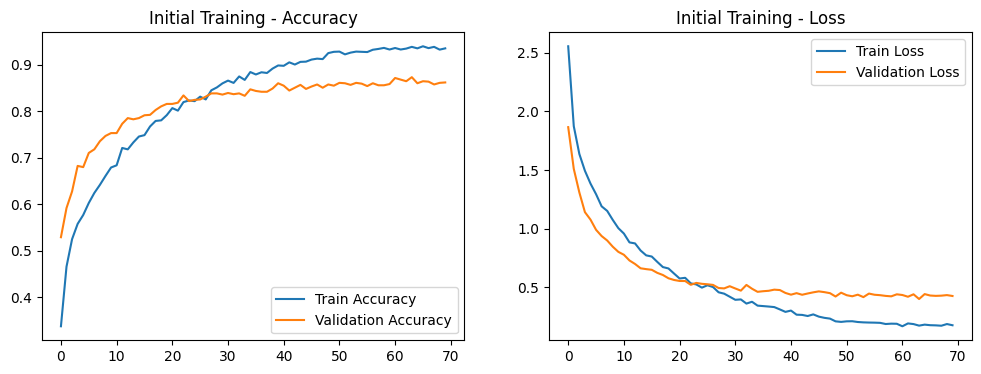

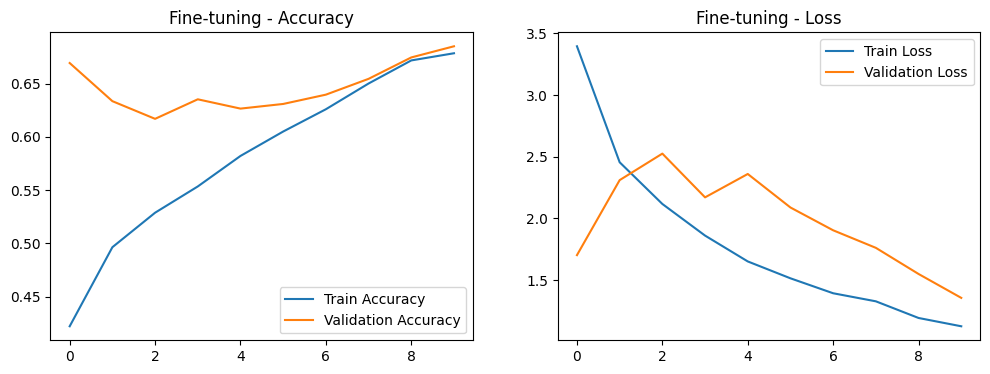

36/36 ━━━━━━━━━━━━━━━━━━━━ 6s 147ms/step - accuracy: 0.6699 - loss: 1.7697
Validation Accuracy: 67.19%
18/18 ━━━━━━━━━━━━━━━━━━━━ 4s 166ms/step - accuracy: 0.6875 - loss: 1.9204
Test Accuracy: 68.58%
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 606ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1

2024-06-03 18:08:13.027466: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


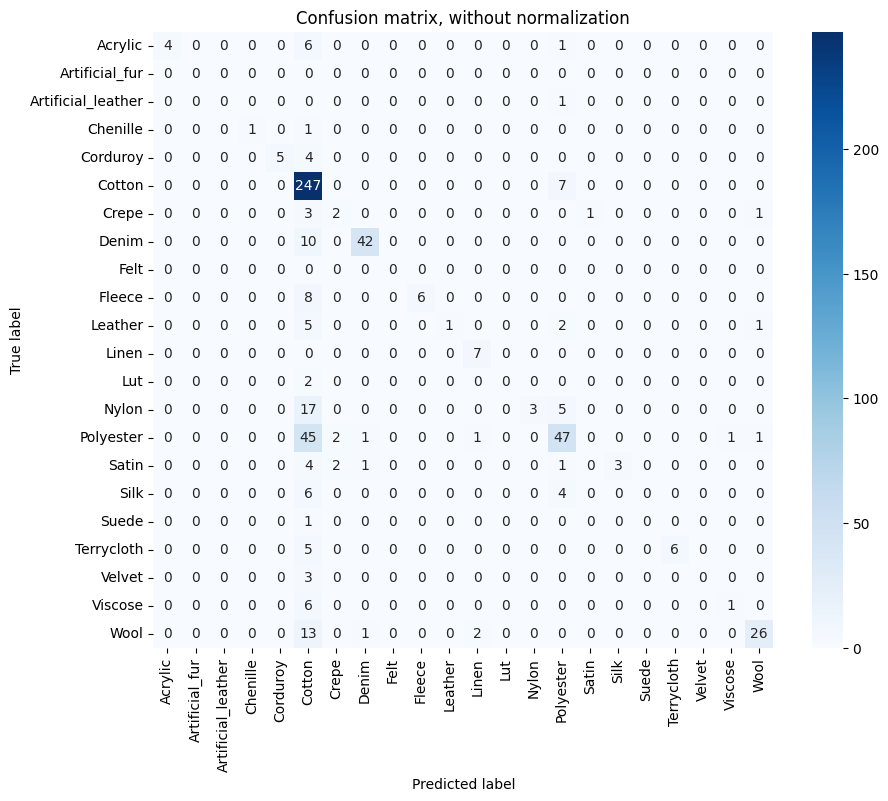

Normalized confusion matrix


/var/folders/x3/jh_7mg9d1sx0rl54wqhg5gr00000gn/T/ipykernel_24153/1234714599.py:148: RuntimeWarning: invalid value encountered in divide
  cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


ValueError: Unknown format code 'd' for object of type 'float'

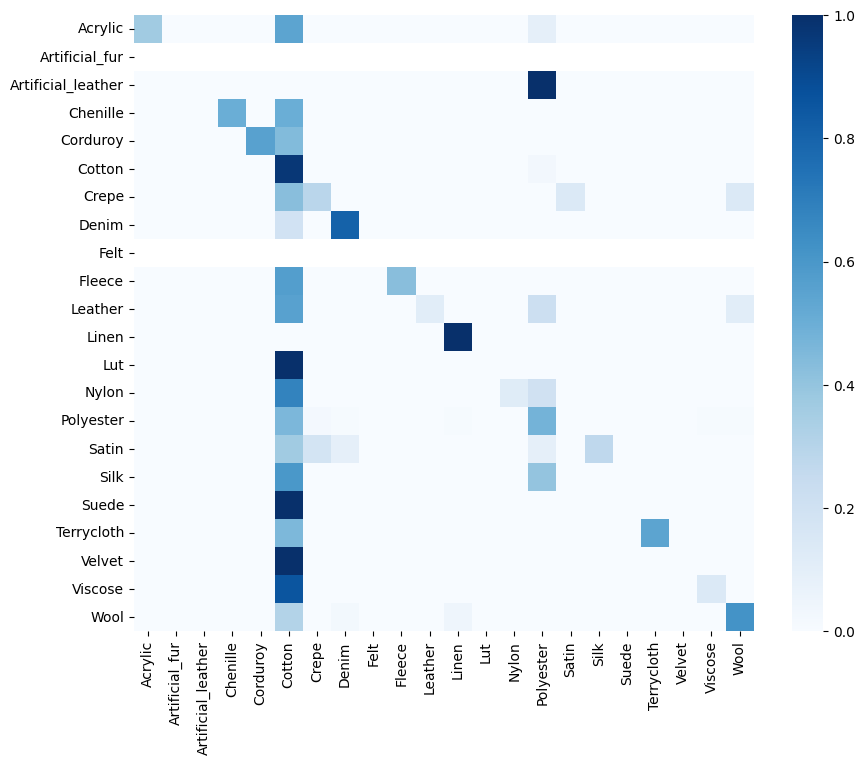

In [21]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D, GlobalMaxPooling2D, BatchNormalization, LeakyReLU
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix, f1_score, log_loss, mean_squared_error
import seaborn as sns

# Load and preprocess the data
data_dir = 'data'

# Load dataset with a validation split = 30%
data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),
    batch_size=32,
    seed=42,
    validation_split=0.3,
    subset='training'
)

val_test_data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),
    batch_size=32,
    seed=42,
    validation_split=0.3,
    subset='validation'
)

# Get the class names before mapping
class_names = data.class_names

# Split the val_test_data into validation and test sets
val_batches = tf.data.experimental.cardinality(val_test_data)
test_size = val_batches // 3
val_data = val_test_data.skip(test_size)
test_data = val_test_data.take(test_size)

# Normalize the images
data = data.map(lambda x, y: (x / 255.0, tf.one_hot(y, len(class_names))))
val_data = val_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, len(class_names))))
test_data = test_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, len(class_names))))

# Load pre-trained MobileNetV2 model + higher level layers
weights_path = 'mobilenet_v2_weights_tf_dim_ordering_tf_kernels_1.0_160_no_top.h5'
base_model = MobileNetV2(input_shape=(160, 160, 3), include_top=False, weights=None)
base_model.load_weights(weights_path)
base_model.trainable = False  # Freeze the base model

# Build the model
model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    BatchNormalization(),
    Dense(1024),
    LeakyReLU(alpha=0.1),
    Dropout(0.5),
    Dense(512),
    LeakyReLU(alpha=0.1),
    Dropout(0.5),
    Dense(256),
    LeakyReLU(alpha=0.1),
    Dropout(0.5),
    Dense(len(class_names), activation='softmax')
])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Implement Early Stopping and ReduceLROnPlateau
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)

# Train the model
history = model.fit(data, validation_data=val_data, epochs=70, callbacks=[early_stopping, reduce_lr])

# Unfreeze some layers in the base model for fine-tuning
base_model.trainable = True
fine_tune_at = 100  # Fine-tune from this layer onwards

for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])

# Continue training the model
history_fine = model.fit(data, validation_data=val_data, epochs=30, callbacks=[early_stopping, reduce_lr])

# Plot the training history
def plot_history(history, title):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(history.history['accuracy'], label='Train Accuracy')
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy')
    ax1.legend()
    ax1.set_title(f'{title} - Accuracy')

    ax2.plot(history.history['loss'], label='Train Loss')
    ax2.plot(history.history['val_loss'], label='Validation Loss')
    ax2.legend()
    ax2.set_title(f'{title} - Loss')

    plt.show()

plot_history(history, 'Initial Training')
plot_history(history_fine, 'Fine-tuning')

# Evaluate the model on the validation set
val_loss, val_accuracy = model.evaluate(val_data)
print(f'Validation Accuracy: {val_accuracy * 100:.2f}%')

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_data)
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')

# Generate confusion matrix and other metrics for the test set
test_data_unbatched = test_data.unbatch()
y_pred = []
y_true = []

for x, y in test_data_unbatched:
    x = tf.expand_dims(x, axis=0)
    pred = model.predict(x)
    y_pred.append(np.argmax(pred))
    y_true.append(np.argmax(y.numpy()))

y_pred = np.array(y_pred)
y_true = np.array(y_true)

# Ensure the true and predicted labels contain the same number of classes
all_classes = np.arange(len(class_names))

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred, labels=all_classes)

# Compute F-score, log-loss, and mean squared error
f_score = f1_score(y_true, y_pred, average='weighted', zero_division=1)
logloss = log_loss(tf.keras.utils.to_categorical(y_true, num_classes=len(class_names)), tf.keras.utils.to_categorical(y_pred, num_classes=len(class_names)))
mse = mean_squared_error(y_true, y_pred)

print(f'F-score: {f_score:.2f}')
print(f'Log-loss: {logloss:.2f}')
print(f'Mean Squared Error: {mse:.2f}')

def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print("Confusion matrix, without normalization")
        
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap=cmap, xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

# Plot non-normalized confusion matrix
plot_confusion_matrix(cm, classes=class_names, title='Confusion matrix, without normalization')


# Plot normalized confusion matrix
plot_confusion_matrix(cm, classes=class_names, normalize=True, title='Normalized confusion matrix')


Epoch 1/90
126/126 ━━━━━━━━━━━━━━━━━━━━ 52s 408ms/step - accuracy: 0.4866 - loss: 2.6104 - val_accuracy: 0.6195 - val_loss: 2.4507 - learning_rate: 1.0000e-05
Epoch 2/90
126/126 ━━━━━━━━━━━━━━━━━━━━ 49s 382ms/step - accuracy: 0.4993 - loss: 2.1850 - val_accuracy: 0.6239 - val_loss: 2.4532 - learning_rate: 1.0000e-05
Epoch 3/90
126/126 ━━━━━━━━━━━━━━━━━━━━ 45s 349ms/step - accuracy: 0.5645 - loss: 1.7743 - val_accuracy: 0.6379 - val_loss: 2.1945 - learning_rate: 1.0000e-05
Epoch 4/90
126/126 ━━━━━━━━━━━━━━━━━━━━ 38s 299ms/step - accuracy: 0.5838 - loss: 1.6184 - val_accuracy: 0.6483 - val_loss: 1.9295 - learning_rate: 1.0000e-05
Epoch 5/90
126/126 ━━━━━━━━━━━━━━━━━━━━ 40s 316ms/step - accuracy: 0.6077 - loss: 1.5114 - val_accuracy: 0.6684 - val_loss: 1.7773 - learning_rate: 1.0000e-05
Epoch 6/90
126/126 ━━━━━━━━━━━━━━━━━━━━ 40s 315ms/step - accuracy: 0.6420 - loss: 1.3501 - val_accuracy: 0.6824 - val_loss: 1.4712 - learning_rate: 1.0000e-05
Epoch 7/90
126/126 ━━━━━━━━━━━━━━━━━━━━ 39s 30

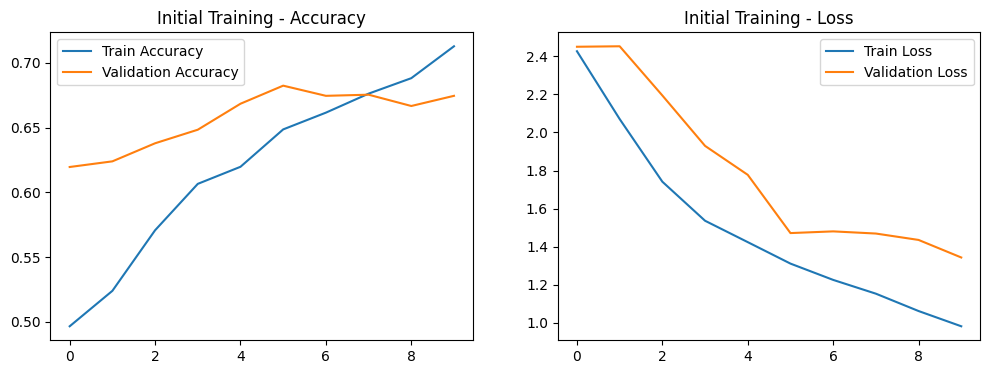

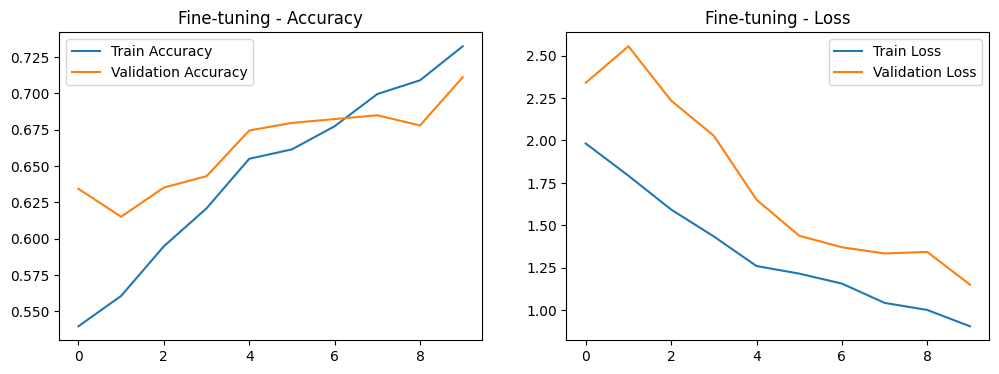

36/36 ━━━━━━━━━━━━━━━━━━━━ 7s 166ms/step - accuracy: 0.6297 - loss: 2.4600
Validation Accuracy: 63.53%
18/18 ━━━━━━━━━━━━━━━━━━━━ 3s 144ms/step - accuracy: 0.6915 - loss: 2.0945
Test Accuracy: 66.15%
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 582ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1

2024-06-03 18:26:36.074276: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


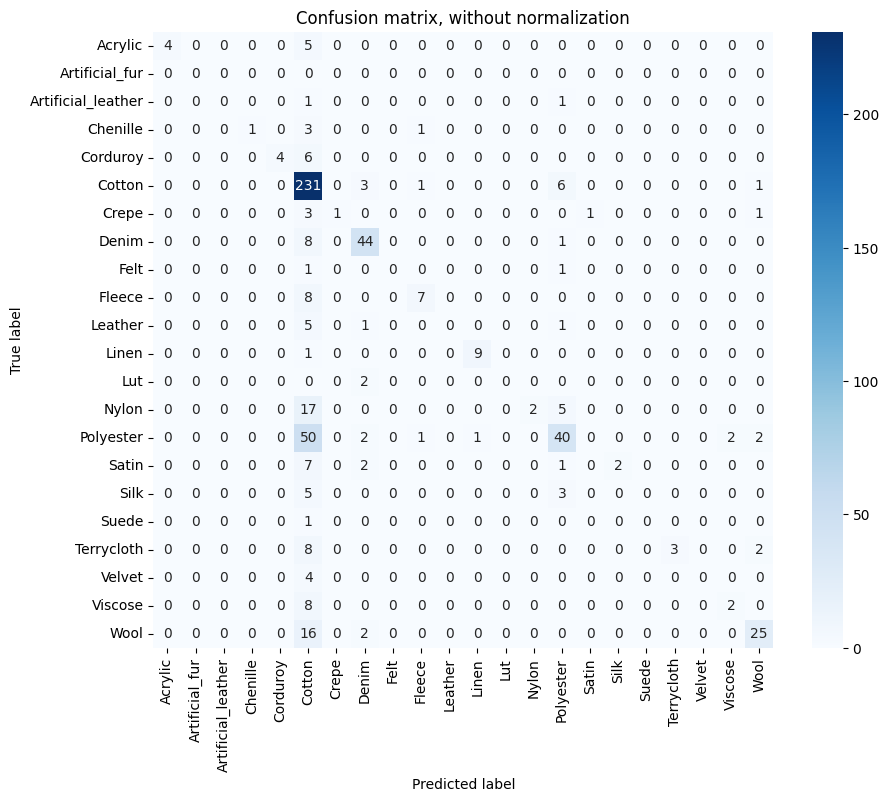

Normalized confusion matrix


/var/folders/x3/jh_7mg9d1sx0rl54wqhg5gr00000gn/T/ipykernel_24153/2566392538.py:73: RuntimeWarning: invalid value encountered in divide
  cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


ValueError: Unknown format code 'd' for object of type 'float'

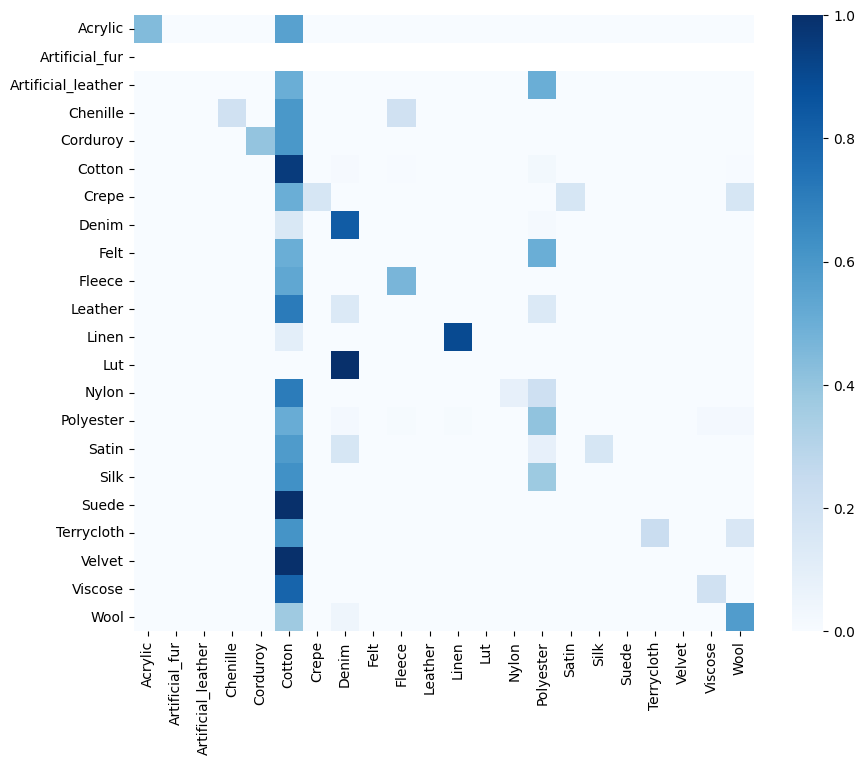

In [22]:

# Train the model
history = model.fit(data, validation_data=val_data, epochs=90, callbacks=[early_stopping, reduce_lr])

# Unfreeze some layers in the base model for fine-tuning
base_model.trainable = True
fine_tune_at = 100  # Fine-tune from this layer onwards

for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])

# Continue training the model
history_fine = model.fit(data, validation_data=val_data, epochs=30, callbacks=[early_stopping, reduce_lr])

# Plot the training history
def plot_history(history, title):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(history.history['accuracy'], label='Train Accuracy')
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy')
    ax1.legend()
    ax1.set_title(f'{title} - Accuracy')

    ax2.plot(history.history['loss'], label='Train Loss')
    ax2.plot(history.history['val_loss'], label='Validation Loss')
    ax2.legend()
    ax2.set_title(f'{title} - Loss')

    plt.show()

plot_history(history, 'Initial Training')
plot_history(history_fine, 'Fine-tuning')

# Evaluate the model on the validation set
val_loss, val_accuracy = model.evaluate(val_data)
print(f'Validation Accuracy: {val_accuracy * 100:.2f}%')

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_data)
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')

# Generate confusion matrix and other metrics for the test set
test_data_unbatched = test_data.unbatch()
y_pred = []
y_true = []

for x, y in test_data_unbatched:
    x = tf.expand_dims(x, axis=0)
    pred = model.predict(x)
    y_pred.append(np.argmax(pred))
    y_true.append(np.argmax(y.numpy()))

y_pred = np.array(y_pred)
y_true = np.array(y_true)

# Ensure the true and predicted labels contain the same number of classes
all_classes = np.arange(len(class_names))

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred, labels=all_classes)

# Compute F-score, log-loss, and mean squared error
f_score = f1_score(y_true, y_pred, average='weighted', zero_division=1)
logloss = log_loss(tf.keras.utils.to_categorical(y_true, num_classes=len(class_names)), tf.keras.utils.to_categorical(y_pred, num_classes=len(class_names)))
mse = mean_squared_error(y_true, y_pred)

print(f'F-score: {f_score:.2f}')
print(f'Log-loss: {logloss:.2f}')
print(f'Mean Squared Error: {mse:.2f}')

def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print("Confusion matrix, without normalization")
        
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap=cmap, xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

# Plot non-normalized confusion matrix
plot_confusion_matrix(cm, classes=class_names, title='Confusion matrix, without normalization')


# Plot normalized confusion matrix
plot_confusion_matrix(cm, classes=class_names, normalize=True, title='Normalized confusion matrix')


Found 5740 files belonging to 22 classes.
Using 4018 files for training.
Found 5740 files belonging to 22 classes.
Using 1722 files for validation.
Epoch 1/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 34s 249ms/step - accuracy: 0.3251 - loss: 2.5344 - val_accuracy: 0.5606 - val_loss: 1.4761 - learning_rate: 1.0000e-04
Epoch 2/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 25s 194ms/step - accuracy: 0.5450 - loss: 1.5633 - val_accuracy: 0.6235 - val_loss: 1.2184 - learning_rate: 1.0000e-04
Epoch 3/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 30s 237ms/step - accuracy: 0.5792 - loss: 1.3383 - val_accuracy: 0.6503 - val_loss: 1.0930 - learning_rate: 1.0000e-04
Epoch 4/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 26s 207ms/step - accuracy: 0.6268 - loss: 1.1862 - val_accuracy: 0.6690 - val_loss: 1.0007 - learning_rate: 1.0000e-04
Epoch 5/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 27s 210ms/step - accuracy: 0.6497 - loss: 1.0715 - val_accuracy: 0.6993 - val_loss: 0.9257 - learning_rate: 1.0000e-04
Epoch 6/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 26s 205ms/s

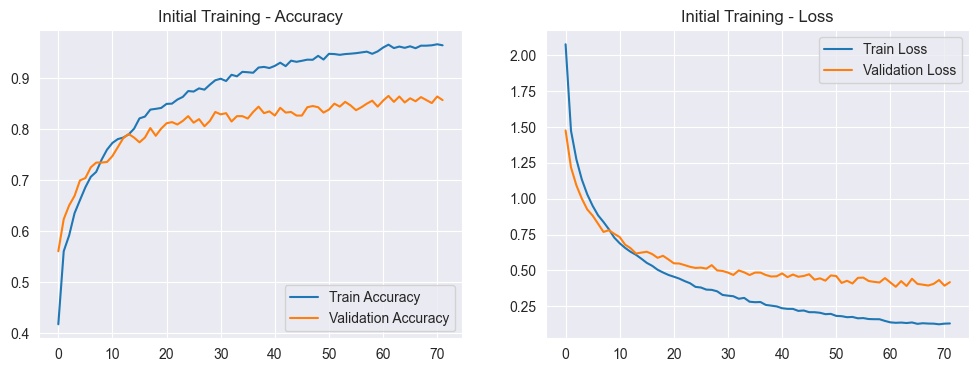

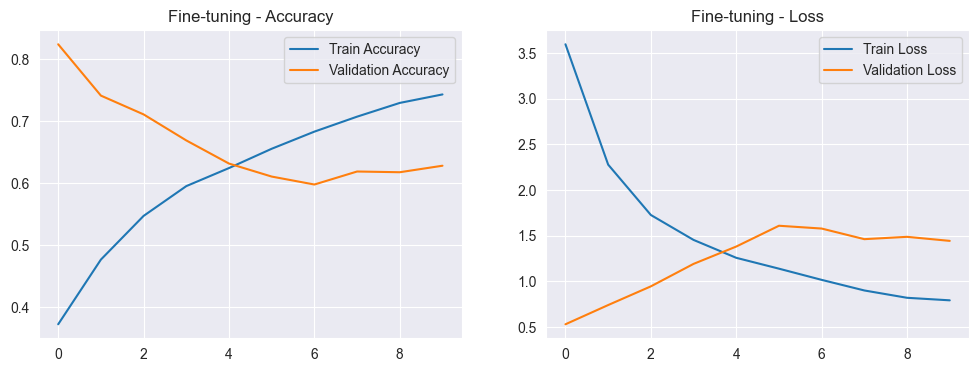

27/27 ━━━━━━━━━━━━━━━━━━━━ 6s 180ms/step - accuracy: 0.7689 - loss: 0.7466
Validation Accuracy: 80.07%
27/27 ━━━━━━━━━━━━━━━━━━━━ 7s 256ms/step - accuracy: 0.7820 - loss: 0.6307
Test Accuracy: 78.24%
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 780ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1

2024-06-05 08:20:04.183019: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


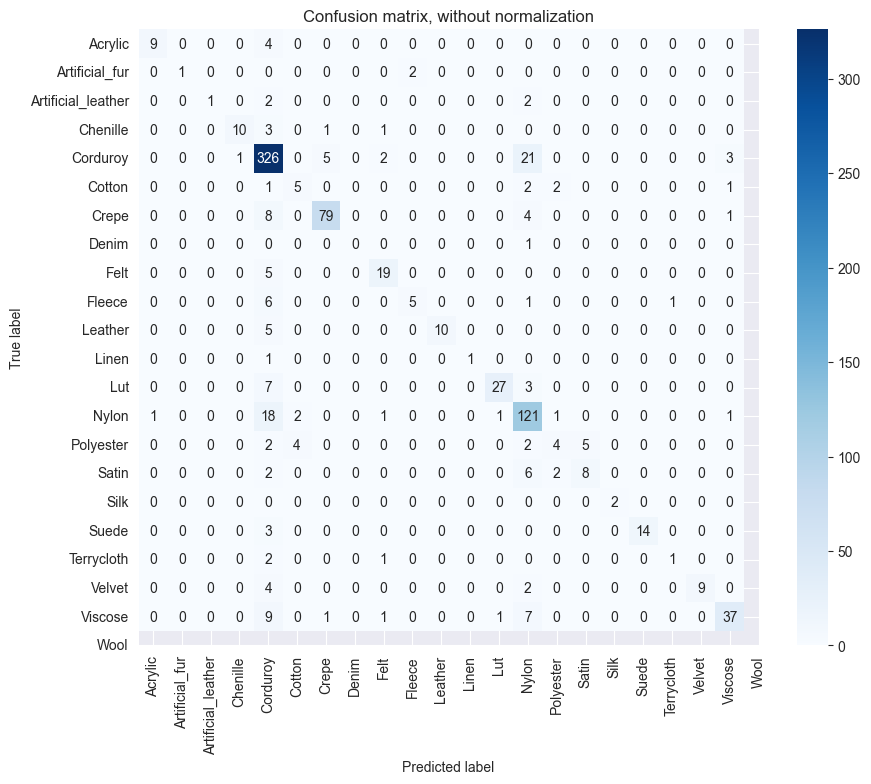

Normalized confusion matrix


ValueError: Unknown format code 'd' for object of type 'float'

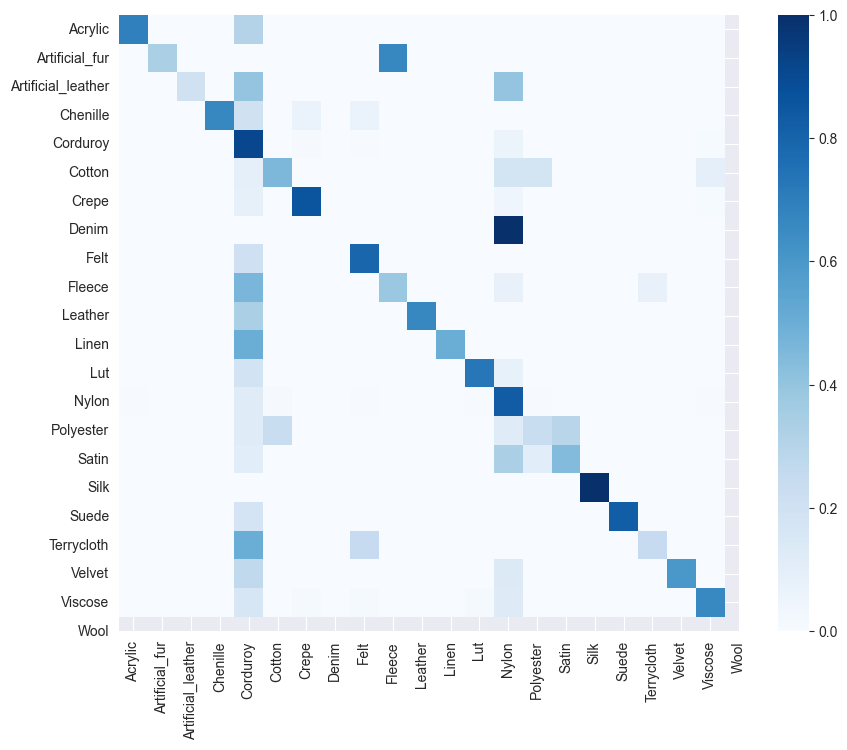

In [1]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Load and preprocess the data
data_dir = 'data_noise_reduction'

# Load dataset with a validation split = 30%
data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),
    batch_size=32,
    seed=42,
    validation_split=0.3,
    subset='training'
)

val_test_data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),
    batch_size=32,
    seed=42,
    validation_split=0.3,
    subset='validation'
)

# Get the class names before mapping
class_names = data.class_names

# Split the val_test_data into validation and test sets
val_batches = tf.data.experimental.cardinality(val_test_data)
test_size = val_batches // 2
val_data = val_test_data.skip(test_size)
test_data = val_test_data.take(test_size)

# Normalize the images
data = data.map(lambda x, y: (x / 255.0, tf.one_hot(y, len(class_names))))
val_data = val_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, len(class_names))))
test_data = test_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, len(class_names))))

# Load pre-trained MobileNetV2 model + higher level layers
weights_path = 'mobilenet_v2_weights_tf_dim_ordering_tf_kernels_1.0_160_no_top.h5'
base_model = MobileNetV2(input_shape=(160, 160, 3), include_top=False, weights=None)
base_model.load_weights(weights_path)
base_model.trainable = False  # Freeze the base model

# Build the model
model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(len(class_names), activation='softmax')
])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Implement Early Stopping and ReduceLROnPlateau
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)

# Train the model
history = model.fit(data, validation_data=val_data, epochs=100, callbacks=[early_stopping, reduce_lr])

# Unfreeze some layers in the base model for fine-tuning
base_model.trainable = True
fine_tune_at = 100  # Fine-tune from this layer onwards

for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])

# Continue training the model
history_fine = model.fit(data, validation_data=val_data, epochs=100, callbacks=[early_stopping, reduce_lr])

# Plot the training history
def plot_history(history, title):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(history.history['accuracy'], label='Train Accuracy')
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy')
    ax1.legend()
    ax1.set_title(f'{title} - Accuracy')

    ax2.plot(history.history['loss'], label='Train Loss')
    ax2.plot(history.history['val_loss'], label='Validation Loss')
    ax2.legend()
    ax2.set_title(f'{title} - Loss')

    plt.show()

plot_history(history, 'Initial Training')
plot_history(history_fine, 'Fine-tuning')

# Evaluate the model on the validation set
val_loss, val_accuracy = model.evaluate(val_data)
print(f'Validation Accuracy: {val_accuracy * 100:.2f}%')

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_data)
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')

# Generate confusion matrix for the test set
test_data_unbatched = test_data.unbatch()
y_pred = []
y_true = []

for x, y in test_data_unbatched:
    x = tf.expand_dims(x, axis=0)
    pred = model.predict(x)
    y_pred.append(np.argmax(pred))
    y_true.append(np.argmax(y.numpy()))

y_pred = np.array(y_pred)
y_true = np.array(y_true)

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
  
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print("Confusion matrix, without normalization")
        
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap=cmap, xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

# Plot non-normalized confusion matrix
plot_confusion_matrix(cm, classes=class_names, 
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix(cm, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')


In [2]:
import os

# File path for the saved model
model_file_path = 'fabric_classification_model_noise_reduction.keras'  # Changed the file name to ensure it doesn't exist

# Check if the file already exists and remove it (optional, since we are using a new name)
if os.path.exists(model_file_path):
    os.remove(model_file_path)

# Save the trained model to a file using the recommended format
model.save(model_file_path)


Found 5740 files belonging to 22 classes.
Using 4018 files for training.
Found 5740 files belonging to 22 classes.
Using 1722 files for validation.
Epoch 1/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 28s 206ms/step - accuracy: 0.2969 - loss: 2.7814 - val_accuracy: 0.5490 - val_loss: 1.4927 - learning_rate: 1.0000e-04
Epoch 2/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - accuracy: 0.5317 - loss: 1.5616 - val_accuracy: 0.6166 - val_loss: 1.2017 - learning_rate: 1.0000e-04
Epoch 3/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - accuracy: 0.5948 - loss: 1.2870 - val_accuracy: 0.6387 - val_loss: 1.0685 - learning_rate: 1.0000e-04
Epoch 4/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - accuracy: 0.6320 - loss: 1.1335 - val_accuracy: 0.6760 - val_loss: 0.9718 - learning_rate: 1.0000e-04
Epoch 5/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 22s 172ms/step - accuracy: 0.6688 - loss: 1.0032 - val_accuracy: 0.7028 - val_loss: 0.8979 - learning_rate: 1.0000e-04
Epoch 6/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 26s 206ms/s

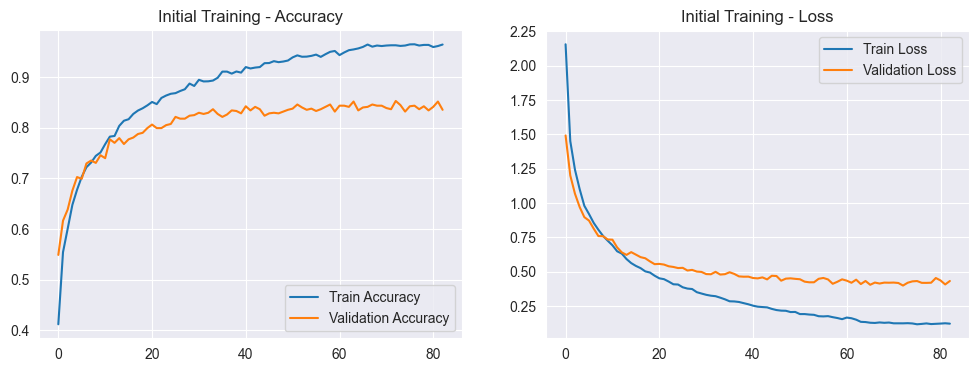

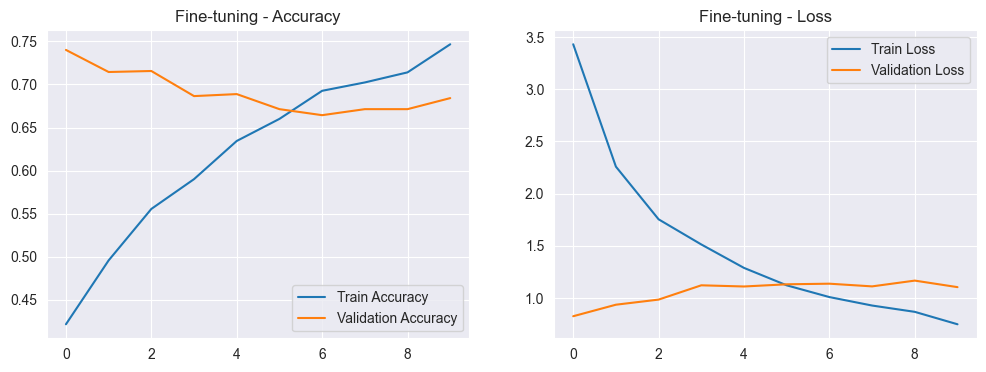

27/27 ━━━━━━━━━━━━━━━━━━━━ 6s 186ms/step - accuracy: 0.7291 - loss: 0.8394
Validation Accuracy: 74.94%
27/27 ━━━━━━━━━━━━━━━━━━━━ 6s 211ms/step - accuracy: 0.7695 - loss: 0.7734
Test Accuracy: 74.65%
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 

2024-06-05 09:17:57.372791: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


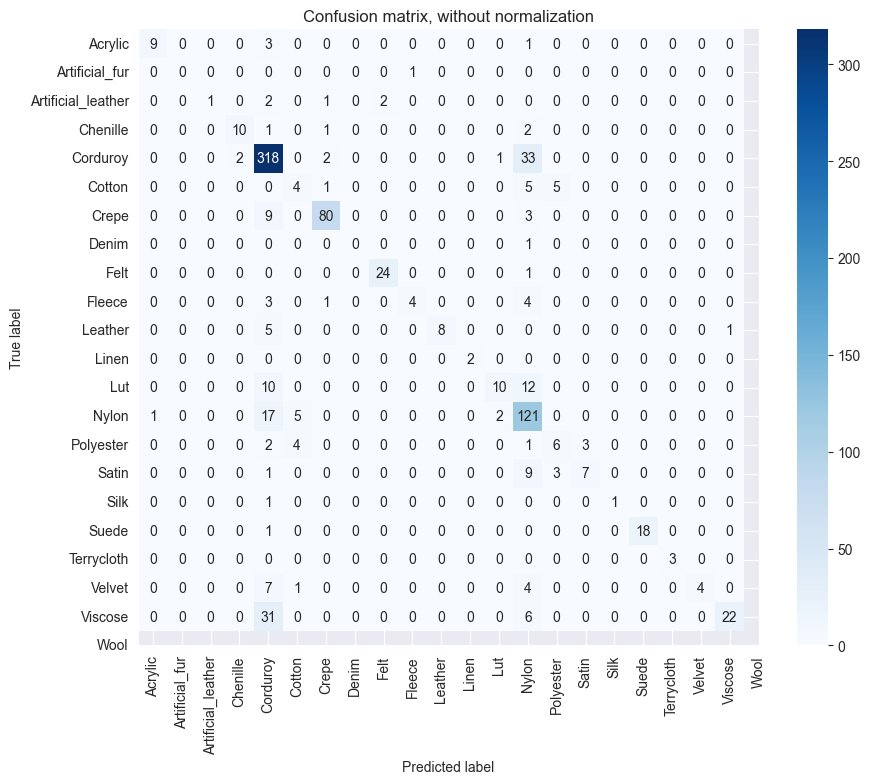

Normalized confusion matrix


ValueError: Unknown format code 'd' for object of type 'float'

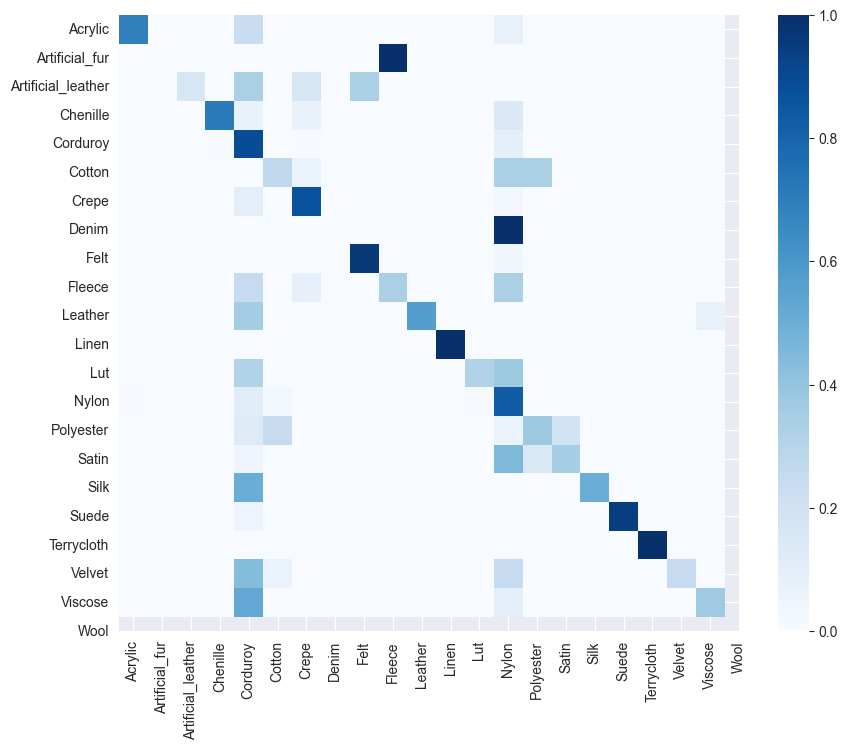

In [3]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Load and preprocess the data
data_dir = 'data_grayscale'

# Load dataset with a validation split = 30%
data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),
    batch_size=32,
    seed=42,
    validation_split=0.3,
    subset='training'
)

val_test_data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),
    batch_size=32,
    seed=42,
    validation_split=0.3,
    subset='validation'
)

# Get the class names before mapping
class_names = data.class_names

# Split the val_test_data into validation and test sets
val_batches = tf.data.experimental.cardinality(val_test_data)
test_size = val_batches // 2
val_data = val_test_data.skip(test_size)
test_data = val_test_data.take(test_size)

# Normalize the images
data = data.map(lambda x, y: (x / 255.0, tf.one_hot(y, len(class_names))))
val_data = val_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, len(class_names))))
test_data = test_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, len(class_names))))

# Load pre-trained MobileNetV2 model + higher level layers
weights_path = 'mobilenet_v2_weights_tf_dim_ordering_tf_kernels_1.0_160_no_top.h5'
base_model = MobileNetV2(input_shape=(160, 160, 3), include_top=False, weights=None)
base_model.load_weights(weights_path)
base_model.trainable = False  # Freeze the base model

# Build the model
model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(len(class_names), activation='softmax')
])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Implement Early Stopping and ReduceLROnPlateau
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)

# Train the model
history = model.fit(data, validation_data=val_data, epochs=100, callbacks=[early_stopping, reduce_lr])

# Unfreeze some layers in the base model for fine-tuning
base_model.trainable = True
fine_tune_at = 100  # Fine-tune from this layer onwards

for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])

# Continue training the model
history_fine = model.fit(data, validation_data=val_data, epochs=100, callbacks=[early_stopping, reduce_lr])

# Plot the training history
def plot_history(history, title):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(history.history['accuracy'], label='Train Accuracy')
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy')
    ax1.legend()
    ax1.set_title(f'{title} - Accuracy')

    ax2.plot(history.history['loss'], label='Train Loss')
    ax2.plot(history.history['val_loss'], label='Validation Loss')
    ax2.legend()
    ax2.set_title(f'{title} - Loss')

    plt.show()

plot_history(history, 'Initial Training')
plot_history(history_fine, 'Fine-tuning')

# Evaluate the model on the validation set
val_loss, val_accuracy = model.evaluate(val_data)
print(f'Validation Accuracy: {val_accuracy * 100:.2f}%')

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_data)
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')

# Generate confusion matrix for the test set
test_data_unbatched = test_data.unbatch()
y_pred = []
y_true = []

for x, y in test_data_unbatched:
    x = tf.expand_dims(x, axis=0)
    pred = model.predict(x)
    y_pred.append(np.argmax(pred))
    y_true.append(np.argmax(y.numpy()))

y_pred = np.array(y_pred)
y_true = np.array(y_true)

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
  
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print("Confusion matrix, without normalization")
        
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap=cmap, xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

# Plot non-normalized confusion matrix
plot_confusion_matrix(cm, classes=class_names, 
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix(cm, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')


In [4]:
import os

# File path for the saved model
model_file_path = 'fabric_classification_model_grayscale.keras'  # Changed the file name to ensure it doesn't exist

# Check if the file already exists and remove it (optional, since we are using a new name)
if os.path.exists(model_file_path):
    os.remove(model_file_path)

# Save the trained model to a file using the recommended format
model.save(model_file_path)


Found 5740 files belonging to 22 classes.
Using 4018 files for training.
Found 5740 files belonging to 22 classes.
Using 1722 files for validation.
Epoch 1/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 26s 189ms/step - accuracy: 0.2986 - loss: 2.6578 - val_accuracy: 0.4732 - val_loss: 1.5745 - learning_rate: 1.0000e-04
Epoch 2/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 23s 182ms/step - accuracy: 0.4736 - loss: 1.6936 - val_accuracy: 0.5606 - val_loss: 1.3643 - learning_rate: 1.0000e-04
Epoch 3/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 24s 188ms/step - accuracy: 0.5292 - loss: 1.4814 - val_accuracy: 0.5839 - val_loss: 1.2495 - learning_rate: 1.0000e-04
Epoch 4/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 24s 188ms/step - accuracy: 0.5533 - loss: 1.3572 - val_accuracy: 0.6049 - val_loss: 1.1770 - learning_rate: 1.0000e-04
Epoch 5/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 26s 201ms/step - accuracy: 0.5972 - loss: 1.2604 - val_accuracy: 0.6119 - val_loss: 1.1321 - learning_rate: 1.0000e-04
Epoch 6/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 25s 194ms/s

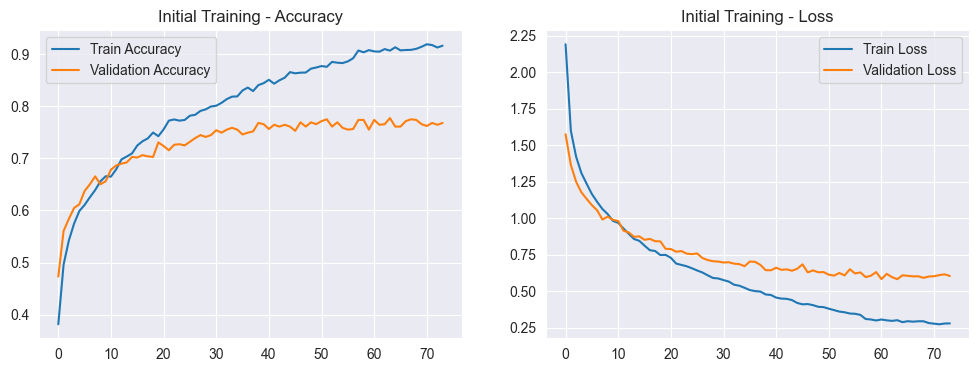

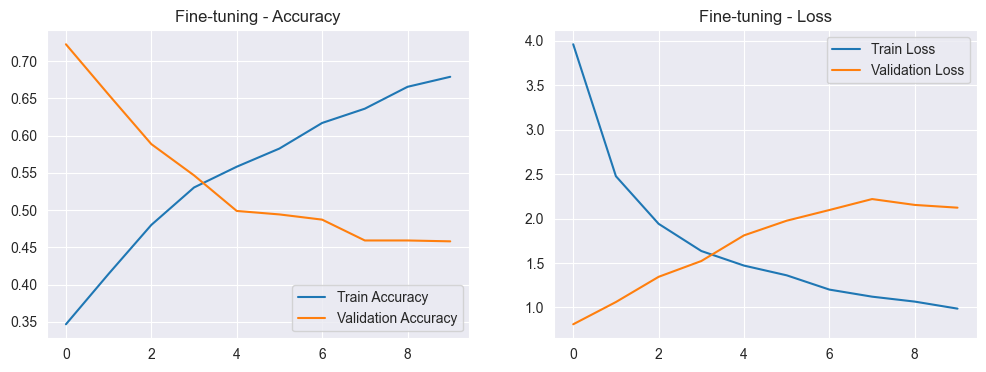

27/27 ━━━━━━━━━━━━━━━━━━━━ 4s 135ms/step - accuracy: 0.6949 - loss: 0.8742
Validation Accuracy: 72.14%
27/27 ━━━━━━━━━━━━━━━━━━━━ 4s 143ms/step - accuracy: 0.7146 - loss: 0.8195
Test Accuracy: 70.83%
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 681ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1

2024-06-05 10:21:21.401244: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


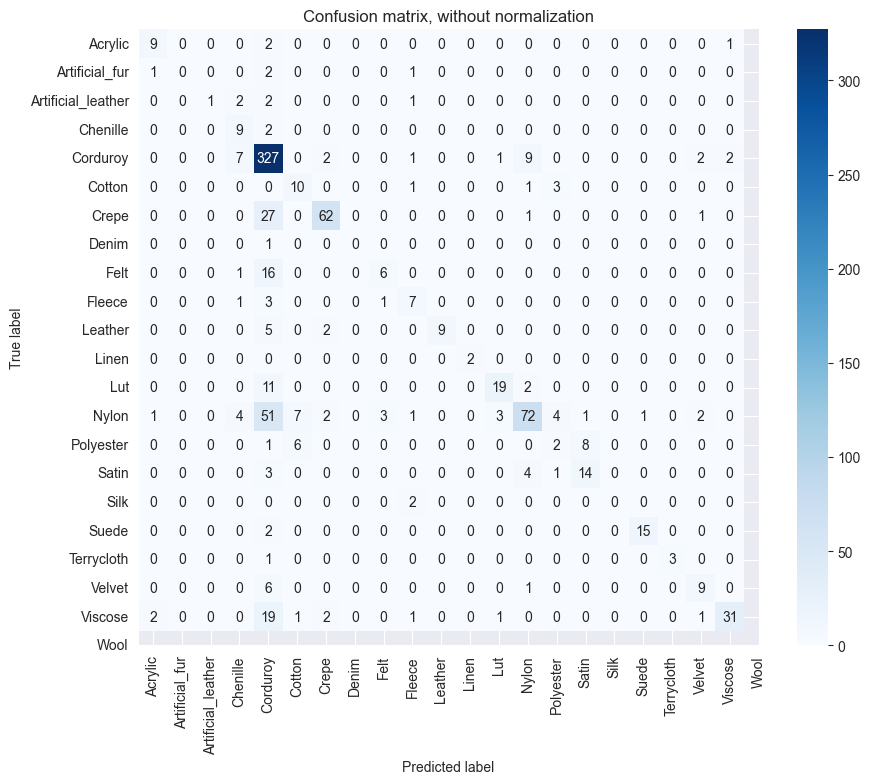

Normalized confusion matrix


ValueError: Unknown format code 'd' for object of type 'float'

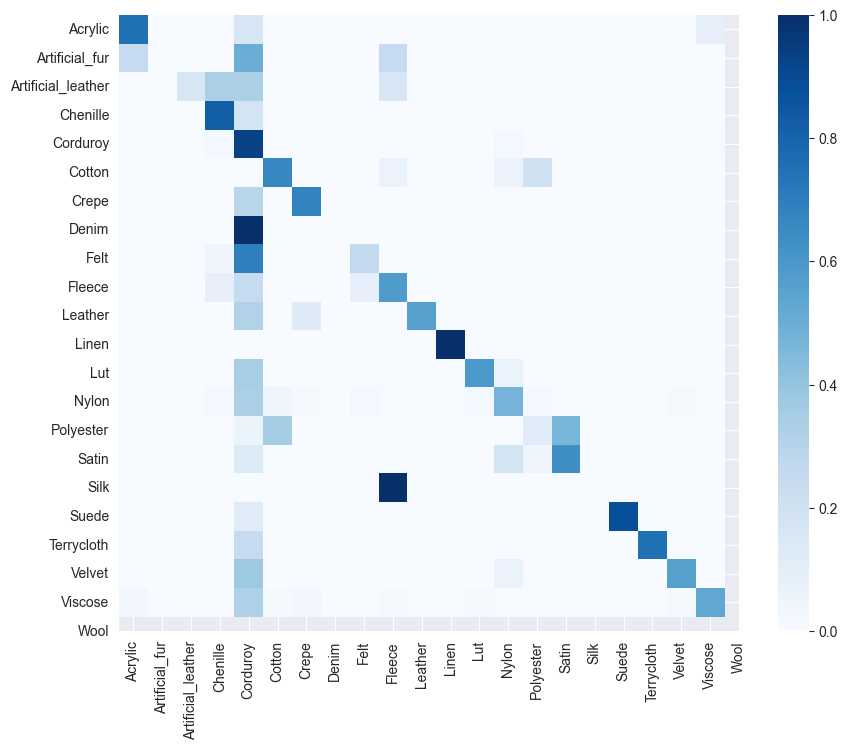

In [5]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Load and preprocess the data
data_dir = 'data_binarization'

# Load dataset with a validation split = 30%
data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),
    batch_size=32,
    seed=42,
    validation_split=0.3,
    subset='training'
)

val_test_data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),
    batch_size=32,
    seed=42,
    validation_split=0.3,
    subset='validation'
)

# Get the class names before mapping
class_names = data.class_names

# Split the val_test_data into validation and test sets
val_batches = tf.data.experimental.cardinality(val_test_data)
test_size = val_batches // 2
val_data = val_test_data.skip(test_size)
test_data = val_test_data.take(test_size)

# Normalize the images
data = data.map(lambda x, y: (x / 255.0, tf.one_hot(y, len(class_names))))
val_data = val_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, len(class_names))))
test_data = test_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, len(class_names))))

# Load pre-trained MobileNetV2 model + higher level layers
weights_path = 'mobilenet_v2_weights_tf_dim_ordering_tf_kernels_1.0_160_no_top.h5'
base_model = MobileNetV2(input_shape=(160, 160, 3), include_top=False, weights=None)
base_model.load_weights(weights_path)
base_model.trainable = False  # Freeze the base model

# Build the model
model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(len(class_names), activation='softmax')
])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Implement Early Stopping and ReduceLROnPlateau
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)

# Train the model
history = model.fit(data, validation_data=val_data, epochs=100, callbacks=[early_stopping, reduce_lr])

# Unfreeze some layers in the base model for fine-tuning
base_model.trainable = True
fine_tune_at = 100  # Fine-tune from this layer onwards

for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])

# Continue training the model
history_fine = model.fit(data, validation_data=val_data, epochs=100, callbacks=[early_stopping, reduce_lr])

# Plot the training history
def plot_history(history, title):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(history.history['accuracy'], label='Train Accuracy')
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy')
    ax1.legend()
    ax1.set_title(f'{title} - Accuracy')

    ax2.plot(history.history['loss'], label='Train Loss')
    ax2.plot(history.history['val_loss'], label='Validation Loss')
    ax2.legend()
    ax2.set_title(f'{title} - Loss')

    plt.show()

plot_history(history, 'Initial Training')
plot_history(history_fine, 'Fine-tuning')

# Evaluate the model on the validation set
val_loss, val_accuracy = model.evaluate(val_data)
print(f'Validation Accuracy: {val_accuracy * 100:.2f}%')

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_data)
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')

# Generate confusion matrix for the test set
test_data_unbatched = test_data.unbatch()
y_pred = []
y_true = []

for x, y in test_data_unbatched:
    x = tf.expand_dims(x, axis=0)
    pred = model.predict(x)
    y_pred.append(np.argmax(pred))
    y_true.append(np.argmax(y.numpy()))

y_pred = np.array(y_pred)
y_true = np.array(y_true)

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
  
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print("Confusion matrix, without normalization")
        
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap=cmap, xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

# Plot non-normalized confusion matrix
plot_confusion_matrix(cm, classes=class_names, 
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix(cm, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')


In [6]:
import os

# File path for the saved model
model_file_path = 'fabric_classification_model_binarization.keras'  # Changed the file name to ensure it doesn't exist

# Check if the file already exists and remove it (optional, since we are using a new name)
if os.path.exists(model_file_path):
    os.remove(model_file_path)

# Save the trained model to a file using the recommended format
model.save(model_file_path)


In [7]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Load and preprocess the data
data_dir = 'data'

# Load dataset with a validation split = 30%
data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),
    batch_size=32,
    seed=42,
    validation_split=0.3,
    subset='training'
)

val_test_data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),
    batch_size=32,
    seed=42,
    validation_split=0.3,
    subset='validation'
)

# Get the class names before mapping
class_names = data.class_names

# Split the val_test_data into validation and test sets
val_batches = tf.data.experimental.cardinality(val_test_data)
test_size = val_batches // 2
val_data = val_test_data.skip(test_size)
test_data = val_test_data.take(test_size)

# Normalize the images
data = data.map(lambda x, y: (x / 255.0, tf.one_hot(y, len(class_names))))
val_data = val_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, len(class_names))))
test_data = test_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, len(class_names))))

# Load pre-trained MobileNetV2 model + higher level layers
weights_path = 'mobilenet_v2_weights_tf_dim_ordering_tf_kernels_1.0_160_no_top.h5'
base_model = MobileNetV2(input_shape=(160, 160, 3), include_top=False, weights=None)
base_model.load_weights(weights_path)
base_model.trainable = False  # Freeze the base model

# Build the model
model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(len(class_names), activation='softmax')
])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Implement Early Stopping and ReduceLROnPlateau
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)

print("Train on unprocessed data")

# Train the model
history = model.fit(data, validation_data=val_data, epochs=100, callbacks=[early_stopping, reduce_lr])

# Unfreeze some layers in the base model for fine-tuning
base_model.trainable = True
fine_tune_at = 100  # Fine-tune from this layer onwards

for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])

# Continue training the model
history_fine = model.fit(data, validation_data=val_data, epochs=100, callbacks=[early_stopping, reduce_lr])

# Plot the training history
def plot_history(history, title):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(history.history['accuracy'], label='Train Accuracy')
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy')
    ax1.legend()
    ax1.set_title(f'{title} - Accuracy')

    ax2.plot(history.history['loss'], label='Train Loss')
    ax2.plot(history.history['val_loss'], label='Validation Loss')
    ax2.legend()
    ax2.set_title(f'{title} - Loss')

    plt.show()

plot_history(history, 'Initial Training')
plot_history(history_fine, 'Fine-tuning')

# Evaluate the model on the validation set
val_loss, val_accuracy = model.evaluate(val_data)
print(f'Validation Accuracy: {val_accuracy * 100:.2f}%')

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_data)
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')

# Generate confusion matrix for the test set
test_data_unbatched = test_data.unbatch()
y_pred = []
y_true = []

for x, y in test_data_unbatched:
    x = tf.expand_dims(x, axis=0)
    pred = model.predict(x)
    y_pred.append(np.argmax(pred))
    y_true.append(np.argmax(y.numpy()))

y_pred = np.array(y_pred)
y_true = np.array(y_true)

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print("Confusion matrix, without normalization")
        
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='.2f' if normalize else 'd', cmap=cmap, xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

# Plot non-normalized confusion matrix
plot_confusion_matrix(cm, classes=class_names, title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix(cm, classes=class_names, normalize=True, title='Normalized confusion matrix')


Found 5740 files belonging to 22 classes.
Using 4018 files for training.
Found 5740 files belonging to 22 classes.
Using 1722 files for validation.
Train on unprocessed data
Epoch 1/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 34s 252ms/step - accuracy: 0.3355 - loss: 2.4538 - val_accuracy: 0.5653 - val_loss: 1.4098 - learning_rate: 1.0000e-04
Epoch 2/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 29s 227ms/step - accuracy: 0.5263 - loss: 1.5473 - val_accuracy: 0.6247 - val_loss: 1.1676 - learning_rate: 1.0000e-04
Epoch 3/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 31s 240ms/step - accuracy: 0.5926 - loss: 1.2654 - val_accuracy: 0.6585 - val_loss: 1.0327 - learning_rate: 1.0000e-04
Epoch 4/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 29s 223ms/step - accuracy: 0.6392 - loss: 1.1067 - val_accuracy: 0.6888 - val_loss: 0.9364 - learning_rate: 1.0000e-04
Epoch 5/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 28s 216ms/step - accuracy: 0.6784 - loss: 1.0051 - val_accuracy: 0.7028 - val_loss: 0.8694 - learning_rate: 1.0000e-04
Epoch 6/100
126/126 ━━━━━━

KeyboardInterrupt: 

Found 5740 files belonging to 22 classes.
Using 4018 files for training.
Found 5740 files belonging to 22 classes.
Using 1722 files for validation.
Train on unprocessed data
Epoch 1/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 36s 258ms/step - accuracy: 0.3385 - loss: 2.4484 - val_accuracy: 0.4872 - val_loss: 1.7607 - learning_rate: 1.0000e-04
Epoch 2/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 30s 237ms/step - accuracy: 0.4976 - loss: 1.7085 - val_accuracy: 0.5163 - val_loss: 1.6598 - learning_rate: 1.0000e-04
Epoch 3/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 36s 285ms/step - accuracy: 0.5403 - loss: 1.5063 - val_accuracy: 0.5152 - val_loss: 1.6713 - learning_rate: 1.0000e-04
Epoch 4/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 57s 452ms/step - accuracy: 0.5854 - loss: 1.3959 - val_accuracy: 0.5350 - val_loss: 1.6377 - learning_rate: 1.0000e-04
Epoch 5/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 65s 513ms/step - accuracy: 0.5975 - loss: 1.3050 - val_accuracy: 0.5268 - val_loss: 1.6546 - learning_rate: 1.0000e-04
Epoch 6/100
126/126 ━━━━━━

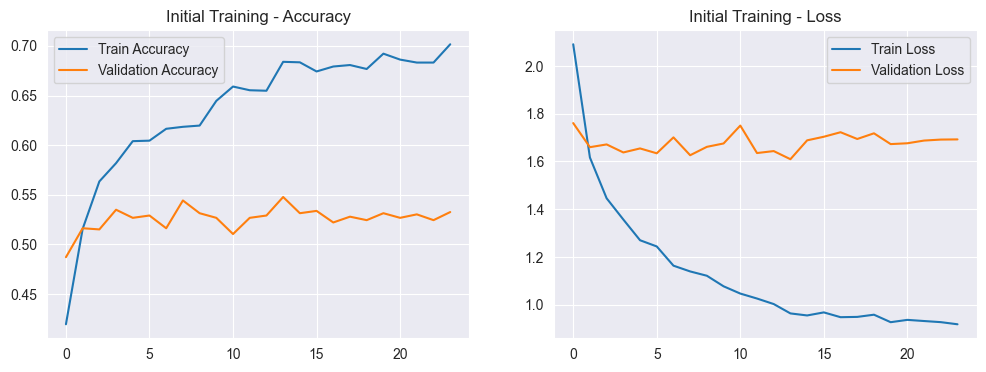

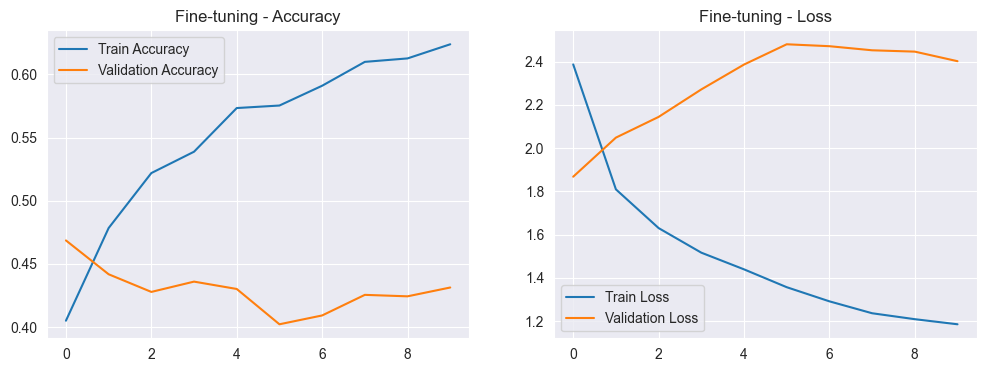

27/27 ━━━━━━━━━━━━━━━━━━━━ 8s 223ms/step - accuracy: 0.4830 - loss: 1.8047
Validation Accuracy: 47.20%
27/27 ━━━━━━━━━━━━━━━━━━━━ 8s 254ms/step - accuracy: 0.4768 - loss: 1.8075
Test Accuracy: 44.68%
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 

2024-06-05 18:45:56.459426: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


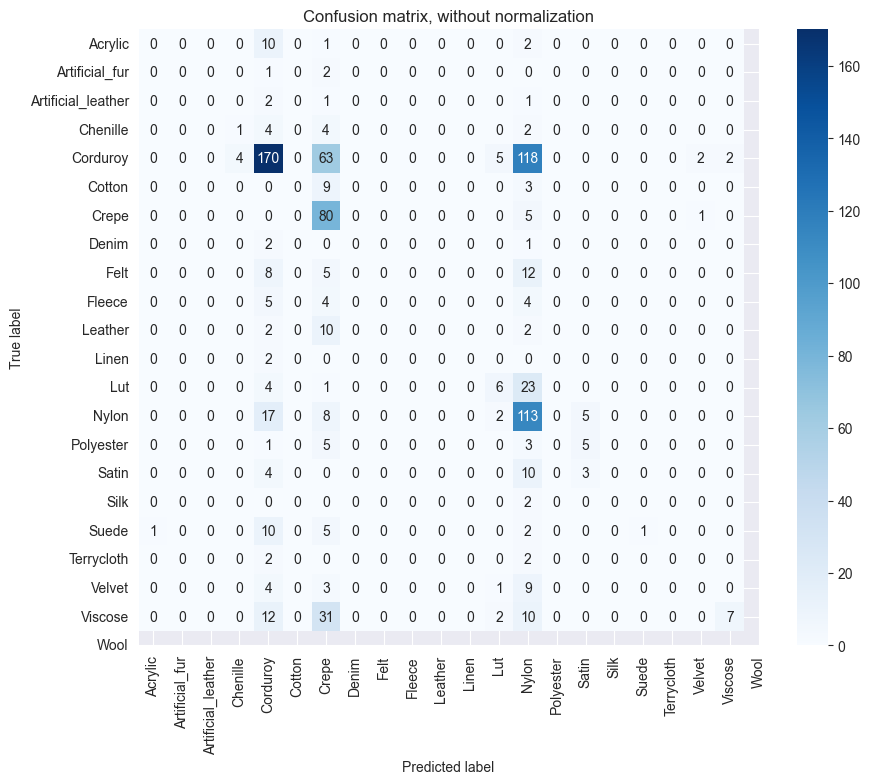

Normalized confusion matrix


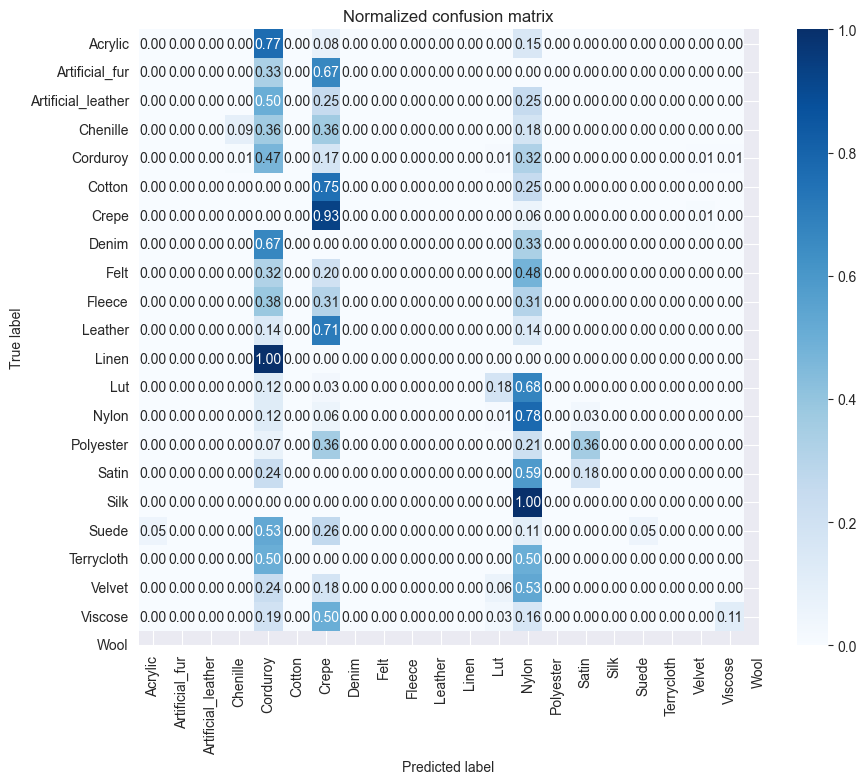

In [12]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.layers import RandomTranslation, RandomRotation
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Custom layer for Gaussian Blur
class GaussianBlur(tf.keras.layers.Layer):
    def __init__(self, kernel_size=3, sigma=1.0, **kwargs):
        super(GaussianBlur, self).__init__(**kwargs)
        self.kernel_size = kernel_size
        self.sigma = sigma

    def gaussian_kernel(self, size: int, mean: float, std: float):
        """Makes 2D gaussian Kernel for convolution."""
        d = tf.range(-size//2 + 1, size//2 + 1, dtype=tf.float32)
        gauss_kernel = tf.exp(-((d - mean) ** 2 / (2 * std ** 2)))
        gauss_kernel = gauss_kernel / tf.reduce_sum(gauss_kernel)
        gauss_kernel = tf.tensordot(gauss_kernel, gauss_kernel, axes=0)
        return gauss_kernel

    def call(self, inputs):
        gauss_kernel = self.gaussian_kernel(self.kernel_size, 0., self.sigma)
        gauss_kernel = gauss_kernel[:, :, tf.newaxis, tf.newaxis]
        gauss_kernel = tf.tile(gauss_kernel, [1, 1, tf.shape(inputs)[-1], 1])
        
        blurred = tf.nn.depthwise_conv2d(inputs, gauss_kernel, strides=[1, 1, 1, 1], padding='SAME')
        return blurred

# Load and preprocess the data
data_dir = 'data'

# Load dataset with a validation split = 30%
train_data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),
    batch_size=32,
    seed=42,
    validation_split=0.3,
    subset='training'
)

val_test_data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),
    batch_size=32,
    seed=42,
    validation_split=0.3,
    subset='validation'
)

# Get the class names before mapping
class_names = train_data.class_names

# Data augmentation
data_augmentation = Sequential([
    RandomTranslation(0.1, 0.1),  # 10% translation
    RandomRotation(0.2),          # 20% rotation
    GaussianBlur(kernel_size=3, sigma=1.0)
])

# Apply data augmentation
train_data = train_data.map(lambda x, y: (data_augmentation(x, training=True), y))

# Split the val_test_data into validation and test sets
val_batches = tf.data.experimental.cardinality(val_test_data)
test_size = val_batches // 2
val_data = val_test_data.skip(test_size)
test_data = val_test_data.take(test_size)

# Normalize the images
train_data = train_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, len(class_names))))
val_data = val_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, len(class_names))))
test_data = test_data.map(lambda x, y: (x / 255.0, tf.one_hot(y, len(class_names))))

# Load pre-trained MobileNetV2 model + higher level layers
weights_path = 'mobilenet_v2_weights_tf_dim_ordering_tf_kernels_1.0_160_no_top.h5'
base_model = MobileNetV2(input_shape=(160, 160, 3), include_top=False, weights=None)
base_model.load_weights(weights_path)
base_model.trainable = False  # Freeze the base model

# Build the model
model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(len(class_names), activation='softmax')
])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Implement Early Stopping and ReduceLROnPlateau
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)

print("Train on unprocessed data")

# Train the model
history = model.fit(train_data, validation_data=val_data, epochs=100, callbacks=[early_stopping, reduce_lr])

# Unfreeze some layers in the base model for fine-tuning
base_model.trainable = True
fine_tune_at = 100  # Fine-tune from this layer onwards

for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])

# Continue training the model
history_fine = model.fit(train_data, validation_data=val_data, epochs=100, callbacks=[early_stopping, reduce_lr])

# Plot the training history
def plot_history(history, title):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(history.history['accuracy'], label='Train Accuracy')
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy')
    ax1.legend()
    ax1.set_title(f'{title} - Accuracy')

    ax2.plot(history.history['loss'], label='Train Loss')
    ax2.plot(history.history['val_loss'], label='Validation Loss')
    ax2.legend()
    ax2.set_title(f'{title} - Loss')

    plt.show()

plot_history(history, 'Initial Training')
plot_history(history_fine, 'Fine-tuning')

# Evaluate the model on the validation set
val_loss, val_accuracy = model.evaluate(val_data)
print(f'Validation Accuracy: {val_accuracy * 100:.2f}%')

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_data)
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')

# Generate confusion matrix for the test set
test_data_unbatched = test_data.unbatch()
y_pred = []
y_true = []

for x, y in test_data_unbatched:
    x = tf.expand_dims(x, axis=0)
    pred = model.predict(x)
    y_pred.append(np.argmax(pred))
    y_true.append(np.argmax(y.numpy()))

y_pred = np.array(y_pred)
y_true = np.array(y_true)

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print("Confusion matrix, without normalization")
        
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='.2f' if normalize else 'd', cmap=cmap, xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

# Plot non-normalized confusion matrix
plot_confusion_matrix(cm, classes=class_names, title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix(cm, classes=class_names, normalize=True, title='Normalized confusion matrix')


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix
import seaborn as sns
from collections import Counter

# Load and preprocess the data
data_dir = 'data'

# Load dataset with a validation split = 30%
train_data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),
    batch_size=32,
    seed=42,
    validation_split=0.3,
    subset='training'
)

val_test_data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(160, 160),
    batch_size=32,
    seed=42,
    validation_split=0.3,
    subset='validation'
)

# Get the class names before mapping
class_names = train_data.class_names

# Split the val_test_data into validation and test sets
val_batches = tf.data.experimental.cardinality(val_test_data)
test_size = val_batches // 2
val_data = val_test_data.skip(test_size)
test_data = val_test_data.take(test_size)

# Normalize the images
train_data = train_data.map(lambda x, y: (x / 255.0, y))
val_data = val_data.map(lambda x, y: (x / 255.0, y))
test_data = test_data.map(lambda x, y: (x / 255.0, y))

# Count the number of instances per class
counter = Counter()
for _, labels in train_data.unbatch():
    counter.update(labels.numpy())

# Calculate the maximum number of samples in any class
max_count = max(counter.values())

# Balance the dataset by upsampling
def upsample_class(dataset, target_count):
    elements = list(dataset.as_numpy_iterator())
    current_count = len(elements)
    if current_count >= target_count:
        return dataset
    else:
        repeats = target_count // current_count
        remainder = target_count % current_count
        remainder_elements = elements[:remainder]
        upsampled_elements = elements * repeats + remainder_elements
        x_elements = [x for x, y in upsampled_elements]
        y_elements = [y for x, y in upsampled_elements]
        return tf.data.Dataset.from_tensor_slices((x_elements, y_elements))

# Separate the data by class and upsample
class_datasets = [train_data.filter(lambda x, y: tf.equal(y, i)) for i in range(len(class_names))]
upsampled_class_datasets = [upsample_class(cls, int(max_count)) for cls in class_datasets]

# Combine the upsampled classes into one dataset
train_data_balanced = upsampled_class_datasets[0]
for cls in upsampled_class_datasets[1:]:
    train_data_balanced = train_data_balanced.concatenate(cls)

# Shuffle the balanced dataset
train_data_balanced = train_data_balanced.shuffle(buffer_size=1000)

# One-hot encode the labels
train_data_balanced = train_data_balanced.map(lambda x, y: (x, tf.one_hot(y, len(class_names))))
val_data = val_data.map(lambda x, y: (x, tf.one_hot(y, len(class_names))))
test_data = test_data.map(lambda x, y: (x, tf.one_hot(y, len(class_names))))

# Load pre-trained MobileNetV2 model + higher level layers
weights_path = 'mobilenet_v2_weights_tf_dim_ordering_tf_kernels_1.0_160_no_top.h5'
base_model = MobileNetV2(input_shape=(160, 160, 3), include_top=False, weights=None)
base_model.load_weights(weights_path)
base_model.trainable = False  # Freeze the base model

# Build the model
model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(len(class_names), activation='softmax')
])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Implement Early Stopping and ReduceLROnPlateau
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)

print("Train on unprocessed data")

# Train the model
history = model.fit(train_data_balanced, validation_data=val_data, epochs=100, callbacks=[early_stopping, reduce_lr])

# Unfreeze some layers in the base model for fine-tuning
base_model.trainable = True
fine_tune_at = 100  # Fine-tune from this layer onwards

for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])

# Continue training the model
history_fine = model.fit(train_data_balanced, validation_data=val_data, epochs=100, callbacks=[early_stopping, reduce_lr])

# Plot the training history
def plot_history(history, title):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.plot(history.history['accuracy'], label='Train Accuracy')
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy')
    ax1.legend()
    ax1.set_title(f'{title} - Accuracy')

    ax2.plot(history.history['loss'], label='Train Loss')
    ax2.plot(history.history['val_loss'], label='Validation Loss')
    ax2.legend()
    ax2.set_title(f'{title} - Loss')

    plt.show()

plot_history(history, 'Initial Training')
plot_history(history_fine, 'Fine-tuning')

# Evaluate the model on the validation set
val_loss, val_accuracy = model.evaluate(val_data)
print(f'Validation Accuracy: {val_accuracy * 100:.2f}%')

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_data)
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')

# Generate confusion matrix for the test set
test_data_unbatched = test_data.unbatch()
y_pred = []
y_true = []

for x, y in test_data_unbatched:
    x = tf.expand_dims(x, axis=0)
    pred = model.predict(x)
    y_pred.append(np.argmax(pred))
    y_true.append(np.argmax(y.numpy()))

y_pred = np.array(y_pred)
y_true = np.array(y_true)

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print("Confusion matrix, without normalization")
        
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='.2f' if normalize else 'd', cmap=cmap, xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

# Plot non-normalized confusion matrix
plot_confusion_matrix(cm, classes=class_names, title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix(cm, classes=class_names, normalize=True, title='Normalized confusion matrix')
